
# Libraries and Data Information

## Mount Google Drive

In [ ]:
from google.colab import drive, files, runtime
drive.mount('/content/drive')

Mounted at /content/drive


## Check for Nvidia GPU.

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


## Create Virtual Environment.

In [ ]:
#!python -m venv /content/drive/My Drive/my_env  # Store in your Drive

## Activate Environment

In [ ]:
!source /content/drive/My Drive/my_env/bin/activate

/bin/bash: line 1: /content/drive/My: No such file or directory


## Installations

In [ ]:
!pip install numpy  # Install or upgrade NumPy first
!pip install tensorflow
!pip install keras-spiking --upgrade
!pip install statsforecast pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.6/354.6 kB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.1/689.1 kB 34.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 348.2/348.2 kB 25.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.0/281.0 kB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 22.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.6/46.6 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 5.0 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.3
    Uninstalling scipy-1.16.3:
      Successfully uninstalled scipy-1.16.3


## Libraries

In [ ]:
import keras
print(keras.__version__)

import keras_spiking
print(keras_spiking.__version__)

3.13.2
0.3.0


In [ ]:
#matplotlib imports
import matplotlib.pyplot as plt
import matplotlib.pyplot as scatter
import time

# sklearn imports
from sklearn.preprocessing import (MinMaxScaler, StandardScaler, MaxAbsScaler,
                                   RobustScaler)
from sklearn.metrics import (mean_absolute_error, mean_squared_error, r2_score,
                             mean_absolute_percentage_error)

# keras/tensorflow imports
import tensorflow as tf
import keras_spiking
from keras.layers import (Dense, Dropout, SimpleRNN, LSTM, GRU, Flatten, Conv1D,
                          MaxPooling1D, TimeDistributed, Conv2D, MaxPooling2D,
                          Lambda)
from keras.models import Sequential
import keras_spiking



# warnings imports
import warnings
warnings.filterwarnings("ignore")

# torch imports
import torch
import torch.nn as nn
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"{device}" " is available.")

# Other imports
import numpy as np
import pandas as pd
from math import sqrt
import os
import pickle
from datetime import datetime, timedelta
import random
import scipy.stats

cpu is available.


# Load Data

In [ ]:
data_to_load = files.upload()

Saving pems_time_series_traffic_Q.csv to pems_time_series_traffic_Q.csv


# Read and Check Data

## Preprocessing stage.

In [ ]:
filename_list = list(data_to_load.keys())
filename = filename_list[0]

In [ ]:
df = pd.read_csv(filename)
df.head()

,Hour,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
0,3/6/2023 0:00,"4,730,945.90","71,292.80",66.359379,430583,55.0
1,3/6/2023 1:00,"3,539,705.60","53,661.00",65.964212,430728,55.0
2,3/6/2023 2:00,"3,303,421.80","50,292.40",65.684314,430476,54.9
3,3/6/2023 3:00,"4,293,866.20","65,046.60",66.012154,430728,54.9
4,3/6/2023 4:00,"7,919,316.80","119,801.60",66.103598,430728,54.8


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8795 entries, 0 to 8794
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Hour             8795 non-null   object 
 1   VMT (Veh-Miles)  8795 non-null   object 
 2   VHT (Veh-Hours)  8795 non-null   object 
 3   Q (VMT/VHT)      8795 non-null   float64
 4   # Lane Points    8795 non-null   int64  
 5   % Observed       8795 non-null   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 412.4+ KB


In [ ]:
title_name = 'CalTrans PeMS Data from 03-06-2023 to 03-06-2024'

In [ ]:
df['VMT (Veh-Miles)'] = [float(str(i).replace(",", "")) for i in df['VMT (Veh-Miles)']]
df['VHT (Veh-Hours)'] = [float(str(i).replace(",", "")) for i in df['VHT (Veh-Hours)']]

## Other Pre-Processing Information

In [ ]:
# We must convert the Datetime column to Datetime format
df['Hour'] = pd.to_datetime(df['Hour'])

# We index the Datetime column after transformation
df.set_index('Hour', inplace=True)
df.head()

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8


In [ ]:
# checking missing data
df.isna().sum()

,0
VMT (Veh-Miles),0
VHT (Veh-Hours),0
Q (VMT/VHT),0
# Lane Points,0
% Observed,0


In [ ]:
# Let's look at the years in the data set
years = df.index.year.unique()
years

Index([2023, 2024], dtype='int32', name='Hour')

In [ ]:
# Let's see the average energy consumed per year
df_yr_obs = df['% Observed'].resample('Y').mean()
df_yr_obs.to_frame()

,% Observed
Hour,
2023-12-31,52.018206
2024-12-31,52.886260


In [ ]:
df_yr_lane_pts = df['# Lane Points'].resample('Y').mean()
df_yr_lane_pts.to_frame()

,# Lane Points
Hour,
2023-12-31,436930.190503
2024-12-31,444306.233461


In [ ]:
df_yr_avg_vmt = df['VMT (Veh-Miles)'].resample('Y').mean()
df_yr_avg_vmt.to_frame()

,VMT (Veh-Miles)
Hour,
2023-12-31,1.664968e+07
2024-12-31,1.608081e+07


In [ ]:
df_yr_avg_vht = df['VHT (Veh-Hours)'].resample('Y').mean()
df_yr_avg_vht.to_frame()

,VHT (Veh-Hours)
Hour,
2023-12-31,285529.216904
2024-12-31,275036.663677


* As can be seen, there are no missing values in our data
* Now let's observe our data set on the graph

In [ ]:
df_yr_avg_vmt = df['Q (VMT/VHT)'].resample('Y').mean()
df_yr_avg_vmt.to_frame()

,Q (VMT/VHT)
Hour,
2023-12-31,60.974523
2024-12-31,61.079063


## Plot Vehicle-Miles Traveled, Vehicle-Hours Traveled, Q based on Trends and Seasonality.

In [ ]:
def plot_veh_mi_hrs(select_df, start, end, seasonality, title_name):
  fig1, ax11 = plt.subplots(figsize=(16, 16))
  ax12 = ax11.twinx()
  ax11.plot(select_df['VMT (Veh-Miles)'][start:end], color='blue',
            label='Vehicle Miles')
  ax11.set_ylabel("Vehicle Miles", fontsize = 20)
  ax11.set_xlabel("Hour", fontsize = 20)
  ax12.plot(select_df['VHT (Veh-Hours)'][start:end], alpha=0.7, color='orange',
            label='Vehicle Hours')
  ax12.set_ylabel("Vehicle Hours", fontsize = 20)
  plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
  plt.title("Vehicle Miles and Hours for {0} ({1})".
            format(title_name, seasonality), fontsize = 20)
  plt.show()

def plot_veh_mi_hrs_Q(select_df, start, end, seasonality, title_name, feature):
    plt.figure(figsize=(16, 16))
    plt.plot(select_df[start:end], label=feature)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.ylabel(feature, fontsize = 20)
    plt.xlabel("Hour", fontsize = 20)
    plt.title("{0} for {1} ({2})".format(feature, title_name, seasonality),
              fontsize = 20)
    plt.show()

### Yearly Plots (Trend)

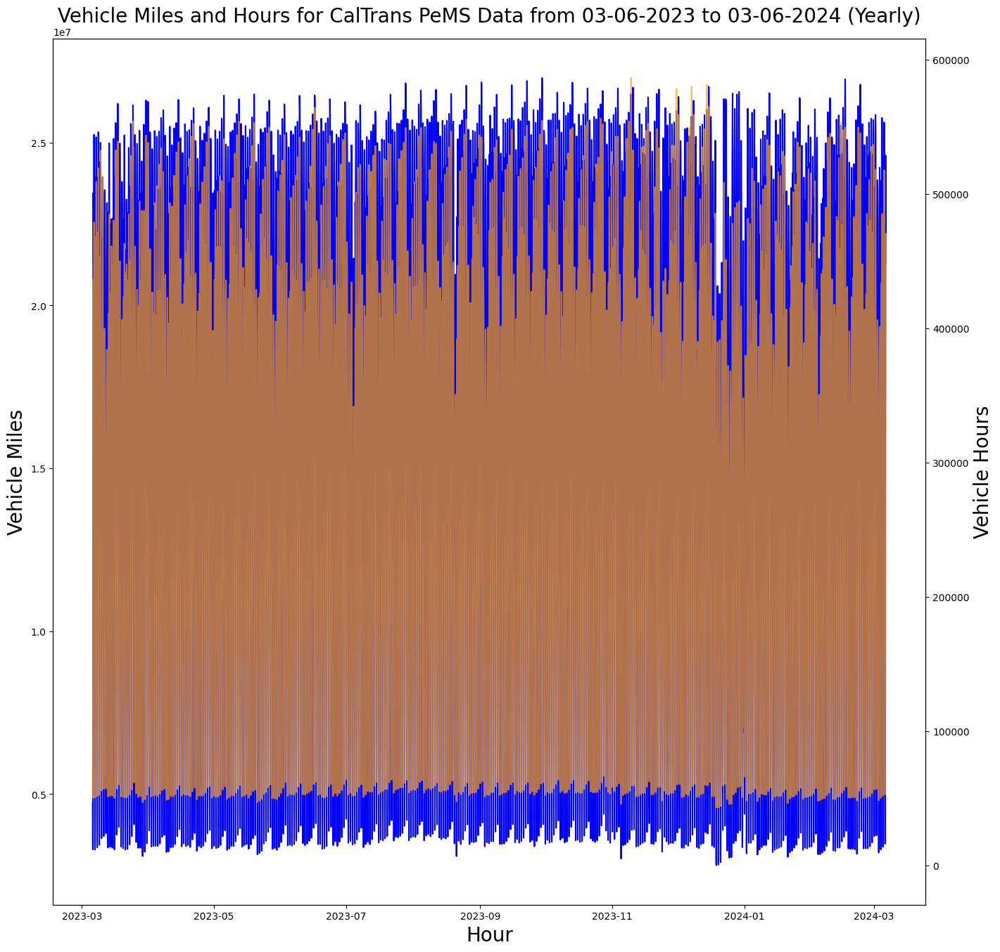

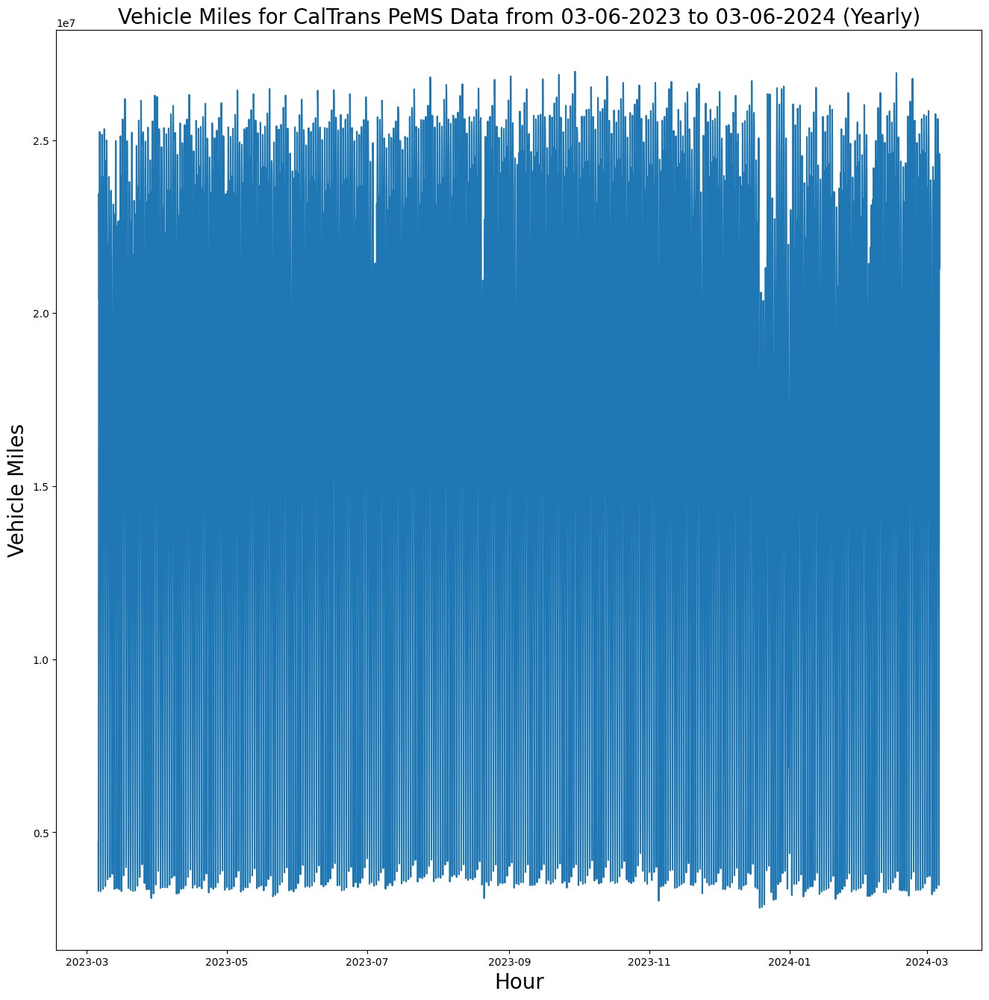

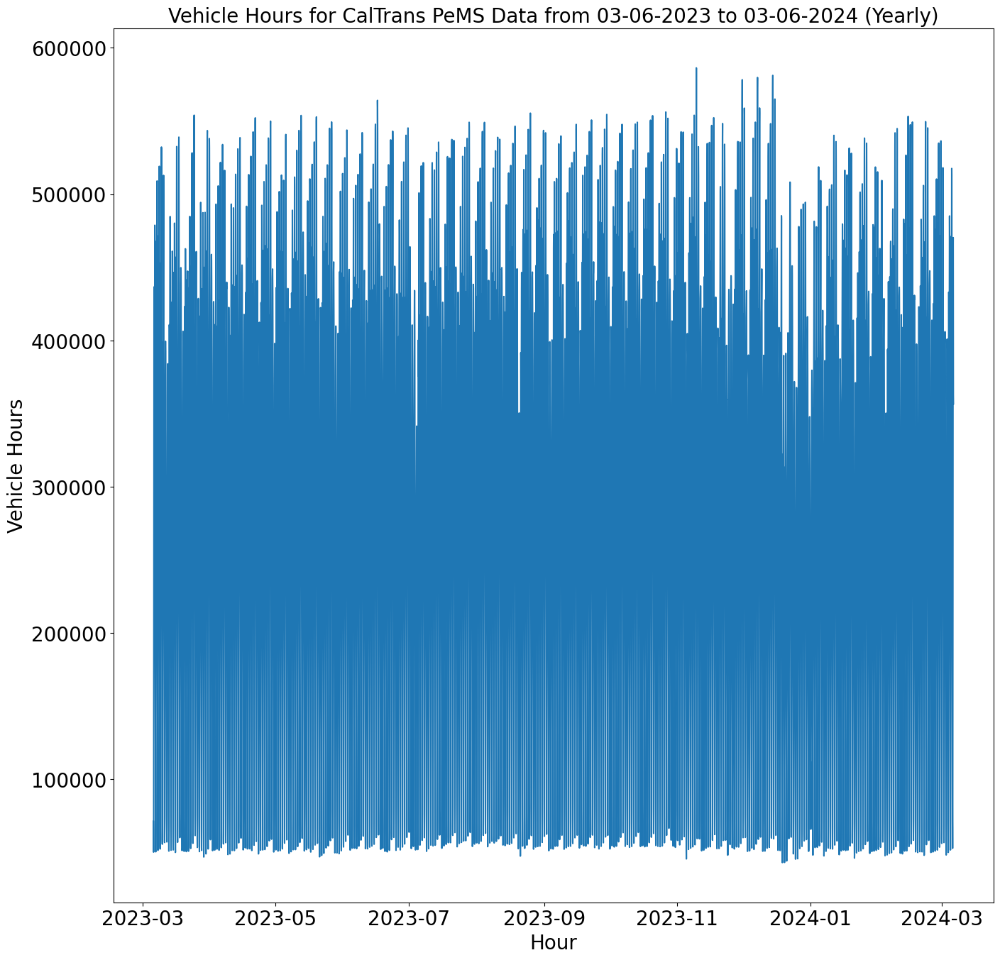

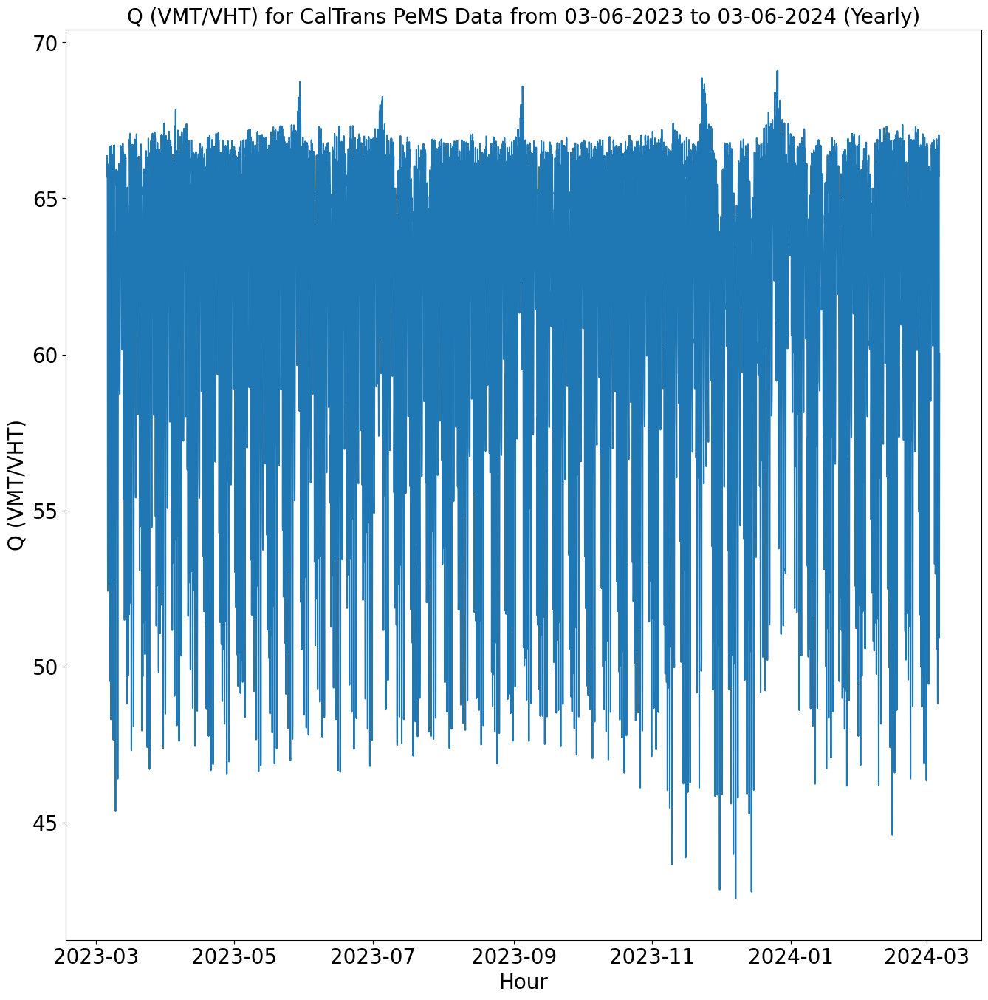

In [ ]:
plot_veh_mi_hrs(df, 0, df.shape[0], "Yearly", title_name)
plot_veh_mi_hrs_Q(df['VMT (Veh-Miles)'], 0, df.shape[0], "Yearly", title_name,
                  'Vehicle Miles')
plot_veh_mi_hrs_Q(df['VHT (Veh-Hours)'], 0, df.shape[0], "Yearly", title_name,
                  'Vehicle Hours')
plot_veh_mi_hrs_Q(df['Q (VMT/VHT)'], 0, df.shape[0], "Yearly", title_name,
                  'Q (VMT/VHT)')

### Daily Plots (Seasonality)

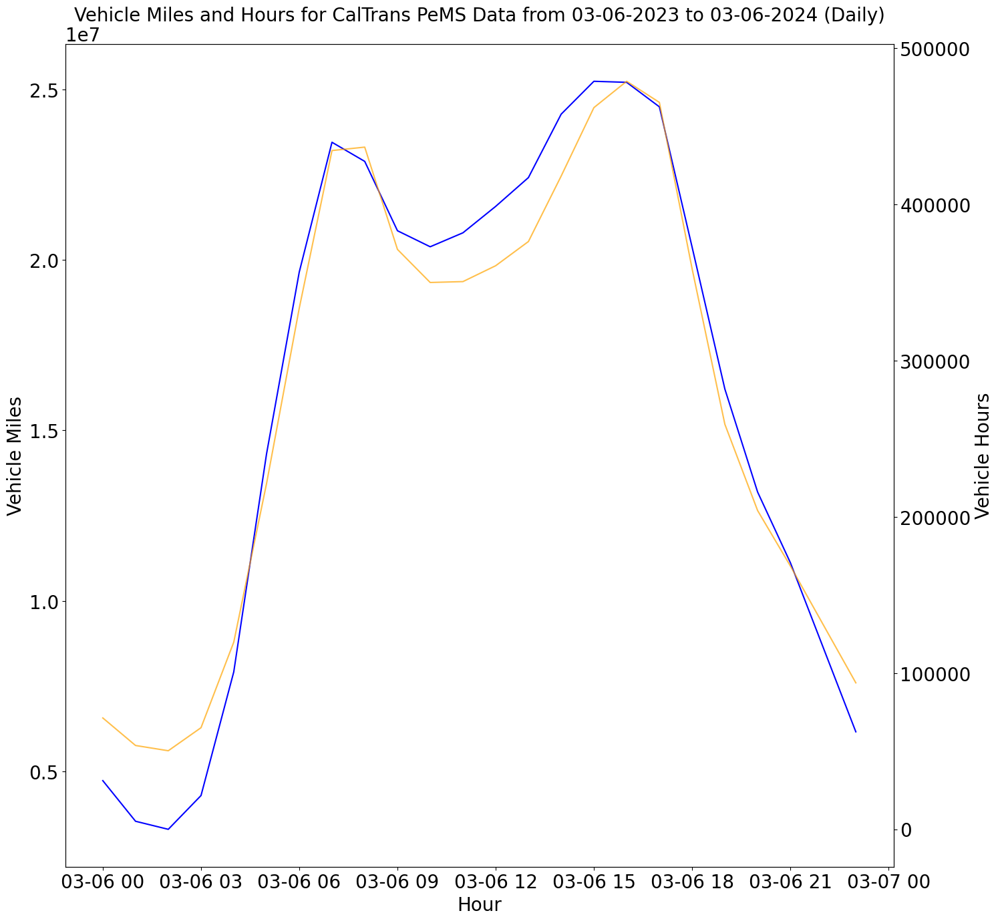

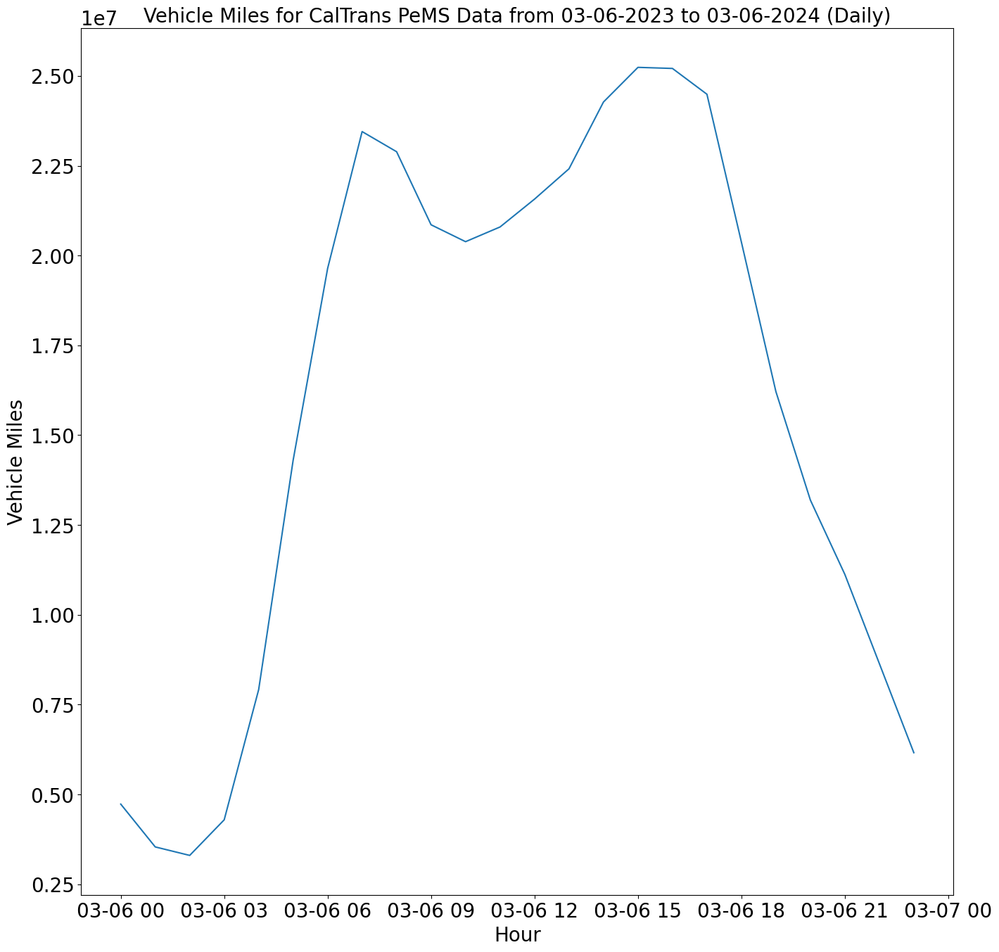

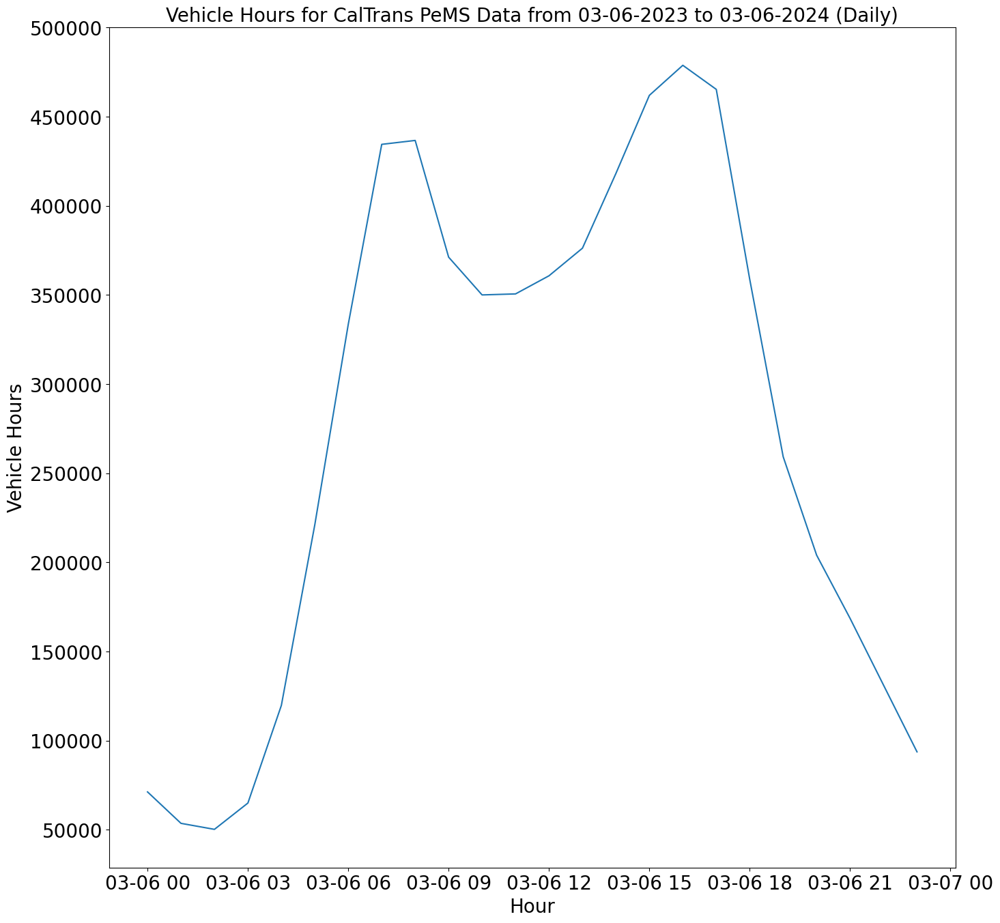

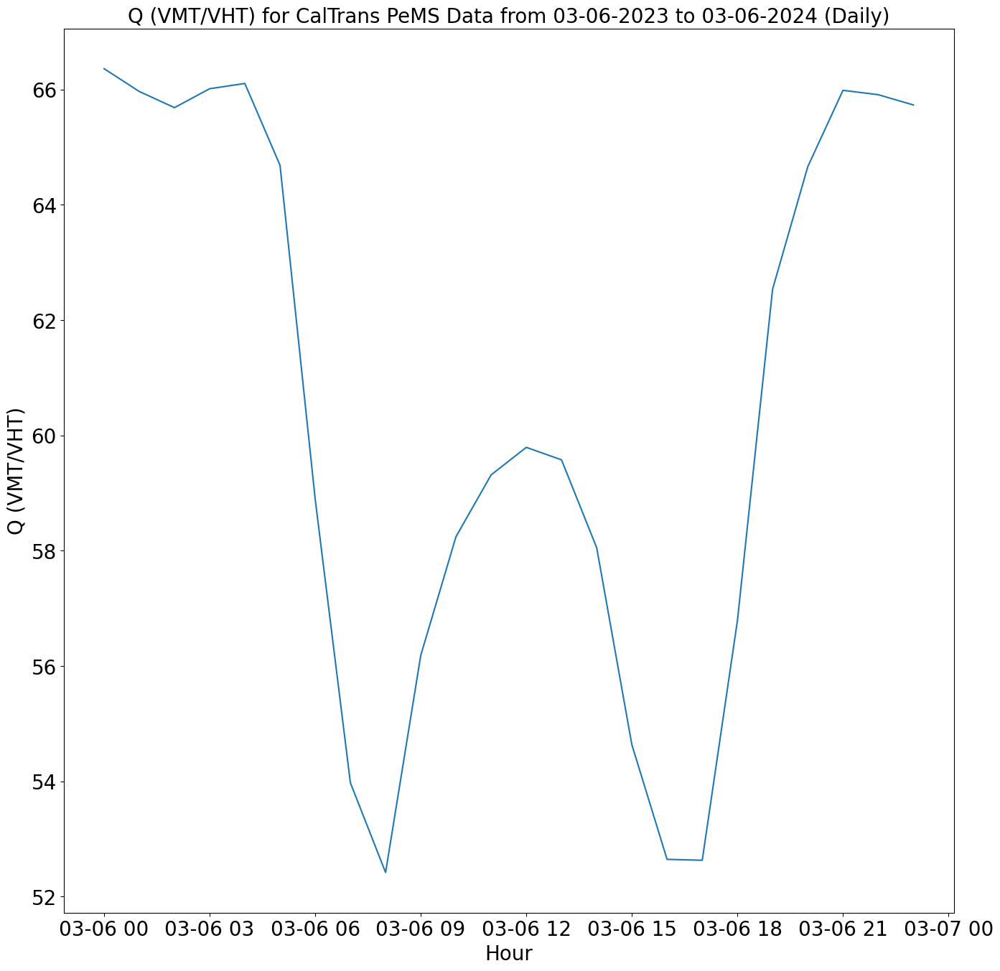

In [ ]:
plot_veh_mi_hrs(df, 0, 24, "Daily", title_name)
plot_veh_mi_hrs_Q(df['VMT (Veh-Miles)'], 0, 24, "Daily", title_name,
                  'Vehicle Miles')
plot_veh_mi_hrs_Q(df['VHT (Veh-Hours)'], 0, 24, "Daily", title_name,
                  'Vehicle Hours')
plot_veh_mi_hrs_Q(df['Q (VMT/VHT)'], 0, 24, "Daily", title_name, 'Q (VMT/VHT)')

### Weekly Plots (Seasonality)

In [ ]:
weekly_df = df.query("Hour >= '2023-04-09' \
                       and Hour <= '2023-04-16'")
weekly_df

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-04-09 00:00:00,7338493.3,109208.5,67.197089,431550,57.0
2023-04-09 01:00:00,5093904.2,76290.6,66.769749,431640,57.0
2023-04-09 02:00:00,4049969.8,60785.5,66.627235,431640,57.0
2023-04-09 03:00:00,3223051.7,48650.7,66.248825,431646,57.0
2023-04-09 04:00:00,3293754.2,49713.6,66.254590,431624,57.0
...,...,...,...,...,...
2023-04-15 20:00:00,17747047.8,276707.1,64.136583,431697,57.0
2023-04-15 21:00:00,16665800.0,250957.2,66.408933,431680,56.9
2023-04-15 22:00:00,14581376.4,218670.8,66.681863,431670,56.9


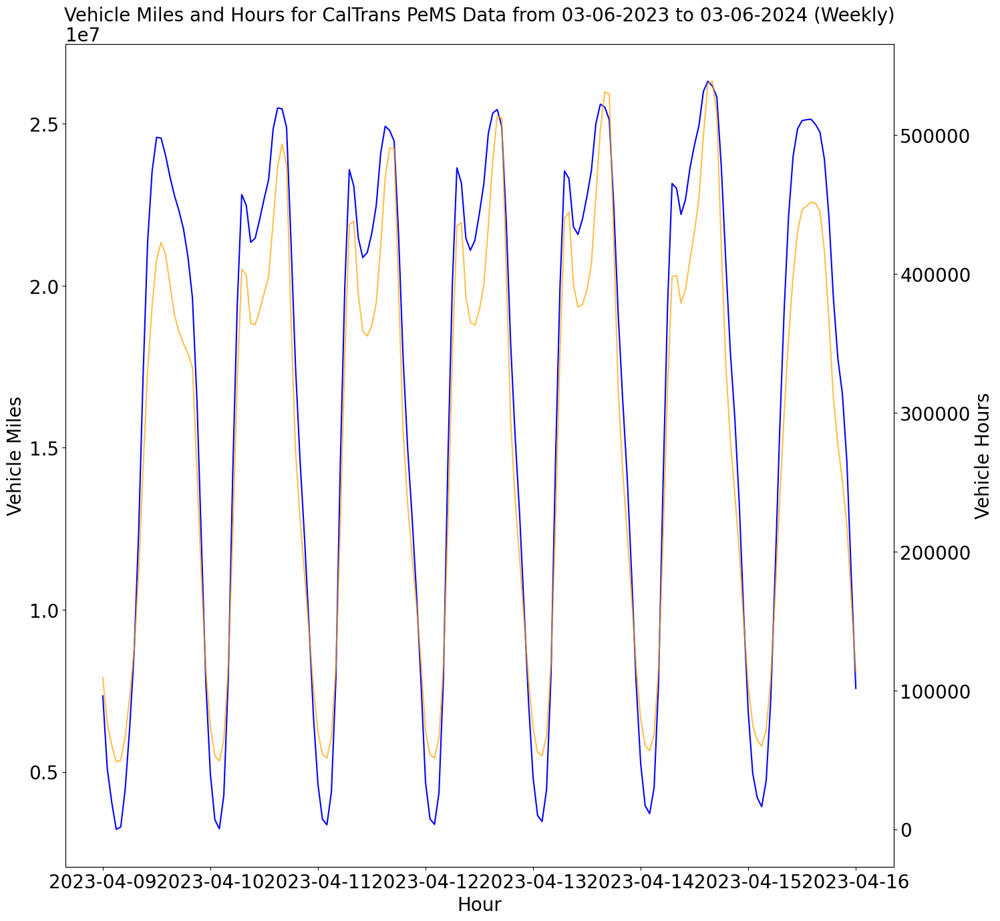

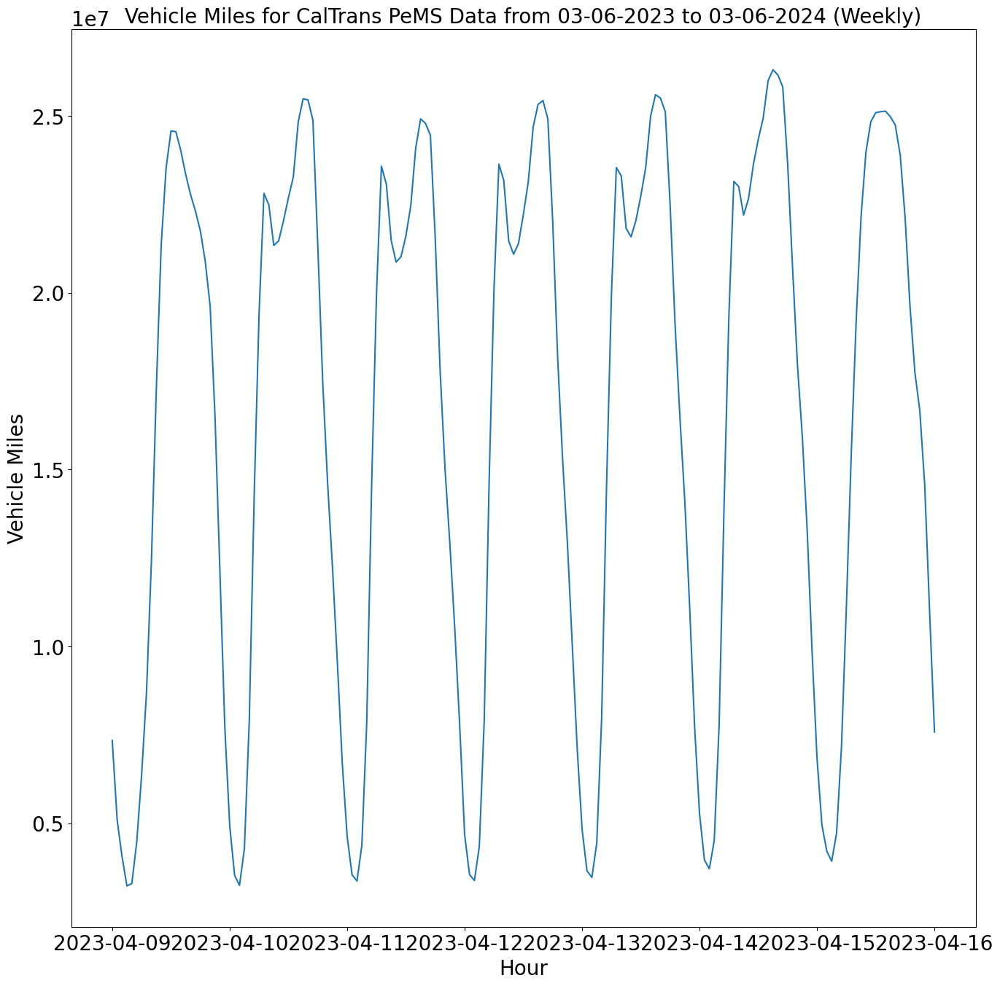

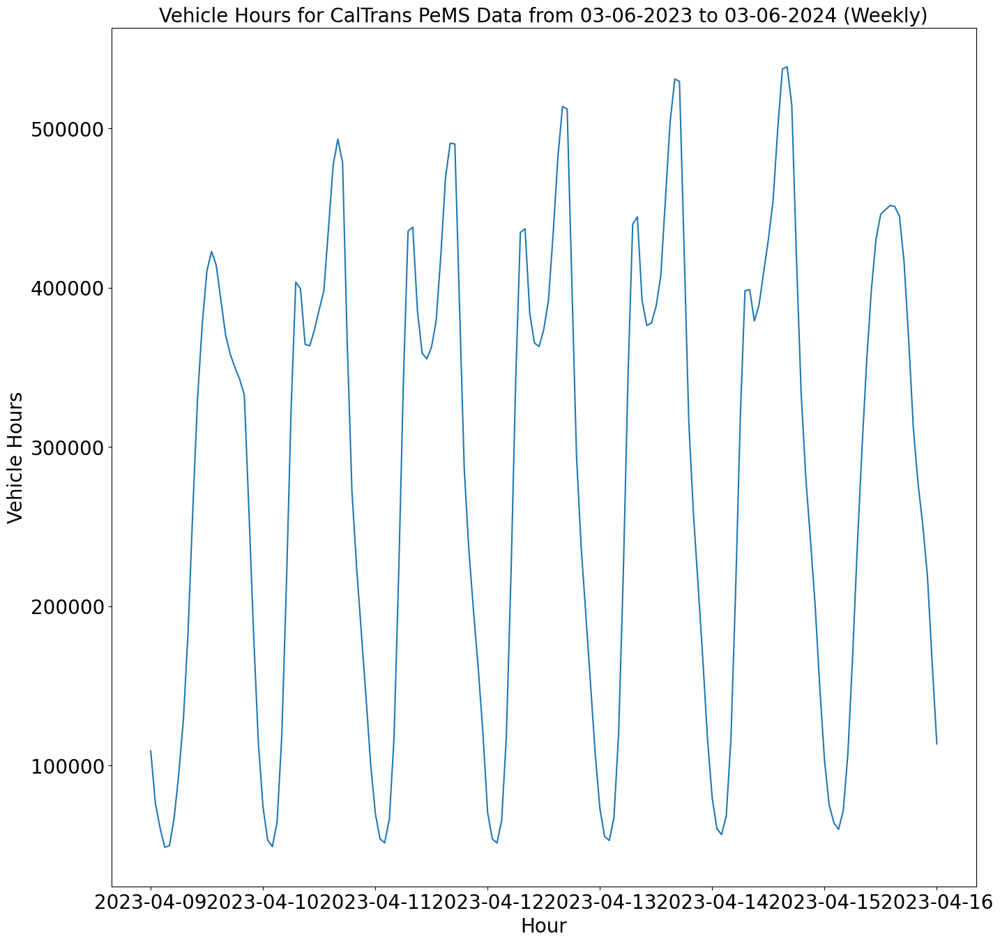

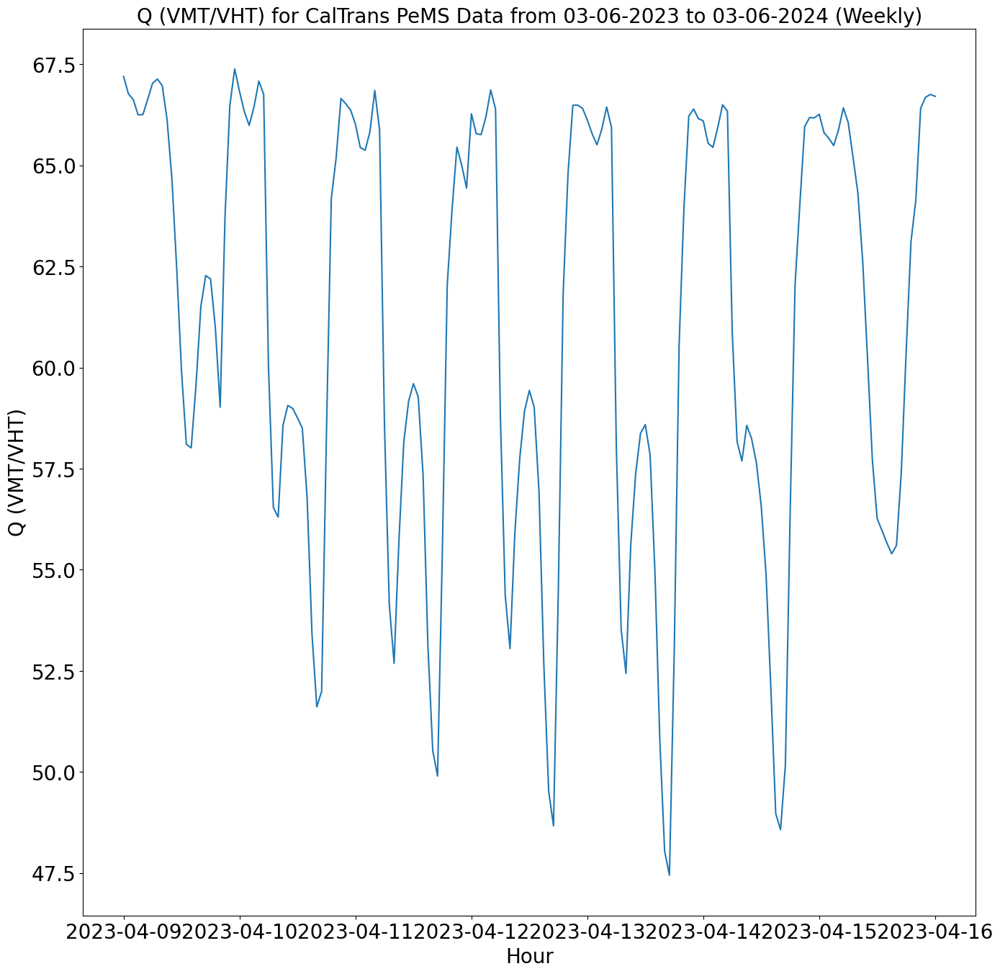

In [ ]:
plot_veh_mi_hrs(weekly_df, 0, weekly_df.shape[0], "Weekly", title_name)
plot_veh_mi_hrs_Q(weekly_df['VMT (Veh-Miles)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Vehicle Miles')
plot_veh_mi_hrs_Q(weekly_df['VHT (Veh-Hours)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Vehicle Hours')
plot_veh_mi_hrs_Q(weekly_df['Q (VMT/VHT)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Q (VMT/VHT)')

### Monthly Plots (Seasonality)

In [ ]:
monthly_df = df.query("Hour >= '2023-05-01' \
                       and Hour <= '2023-06-01'")

monthly_df

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-05-01 00:00:00,5026912.3,75439.4,66.635104,431709,52.5
2023-05-01 01:00:00,3701062.9,55985.2,66.107880,431704,52.5
2023-05-01 02:00:00,3414046.6,51859.2,65.832998,431698,52.5
2023-05-01 03:00:00,4413611.8,66772.5,66.099244,431704,52.4
2023-05-01 04:00:00,8122783.4,122095.1,66.528332,431719,52.4
...,...,...,...,...,...
2023-05-31 20:00:00,15473197.3,238845.5,64.783290,431647,48.7
2023-05-31 21:00:00,13272015.7,199268.5,66.603681,431741,48.7
2023-05-31 22:00:00,10321713.0,154610.6,66.759414,431748,48.5


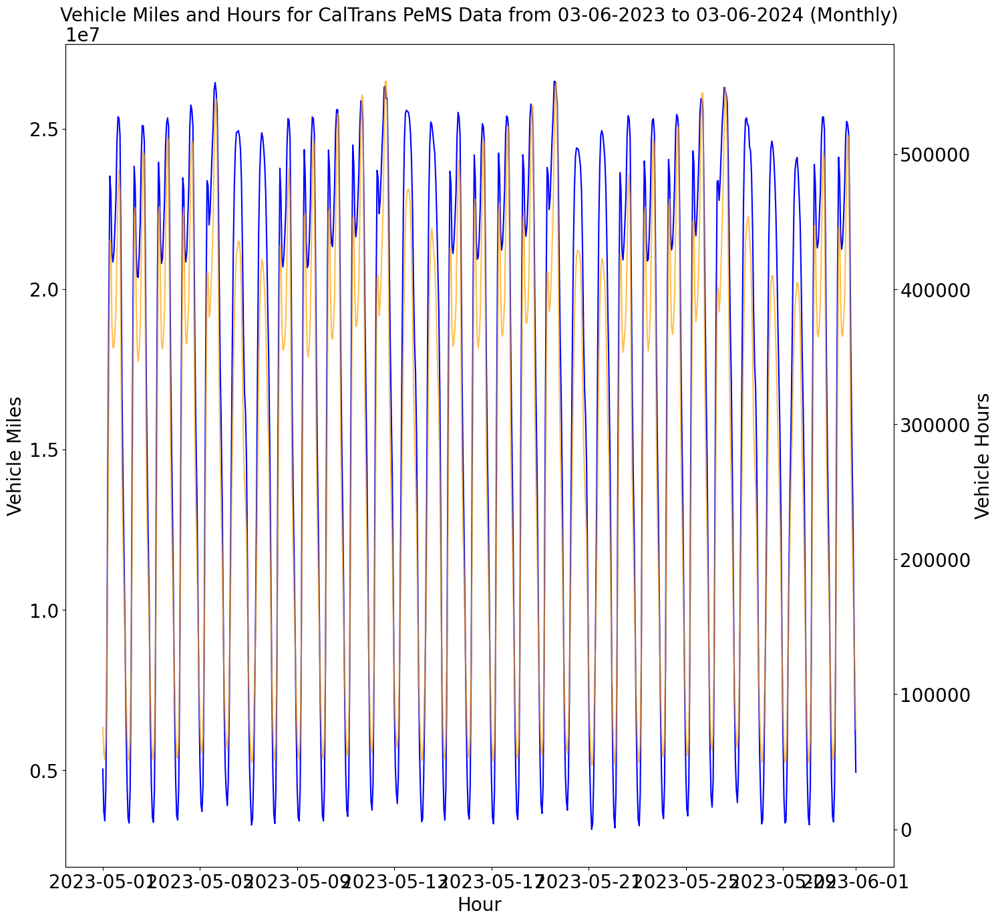

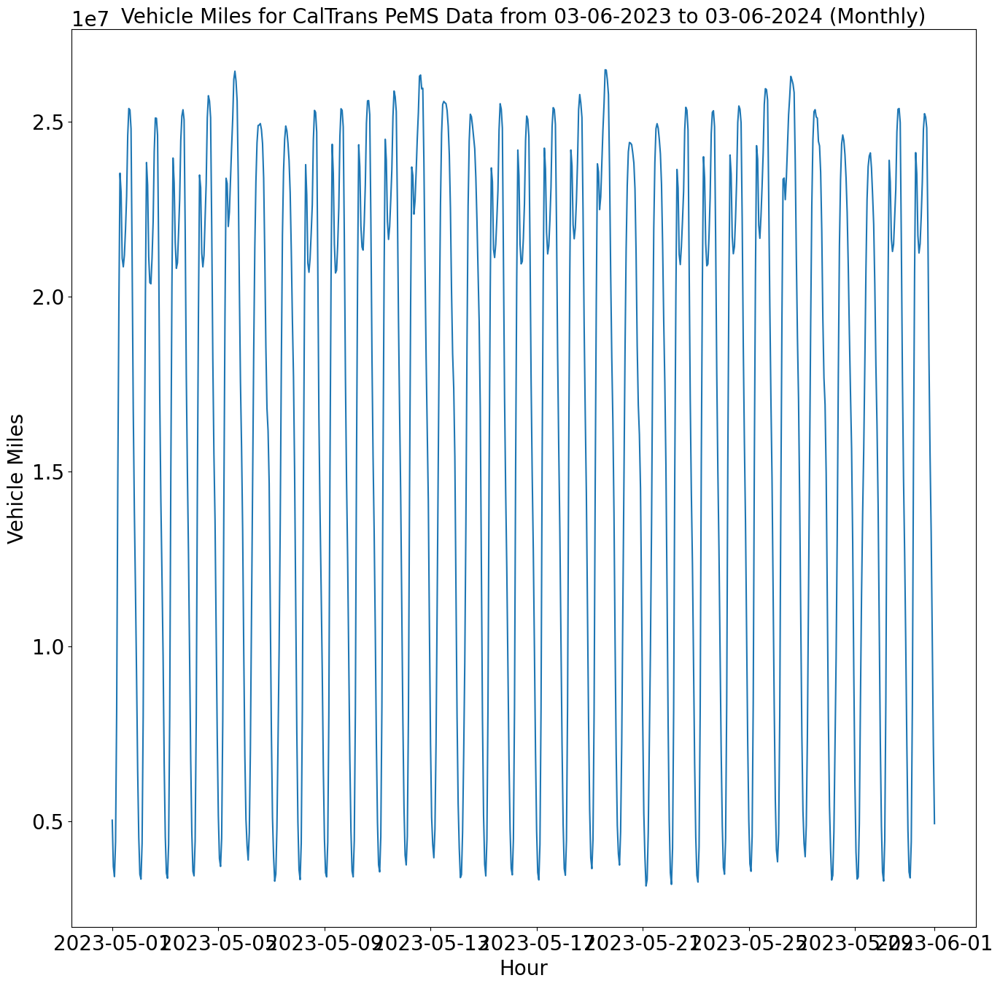

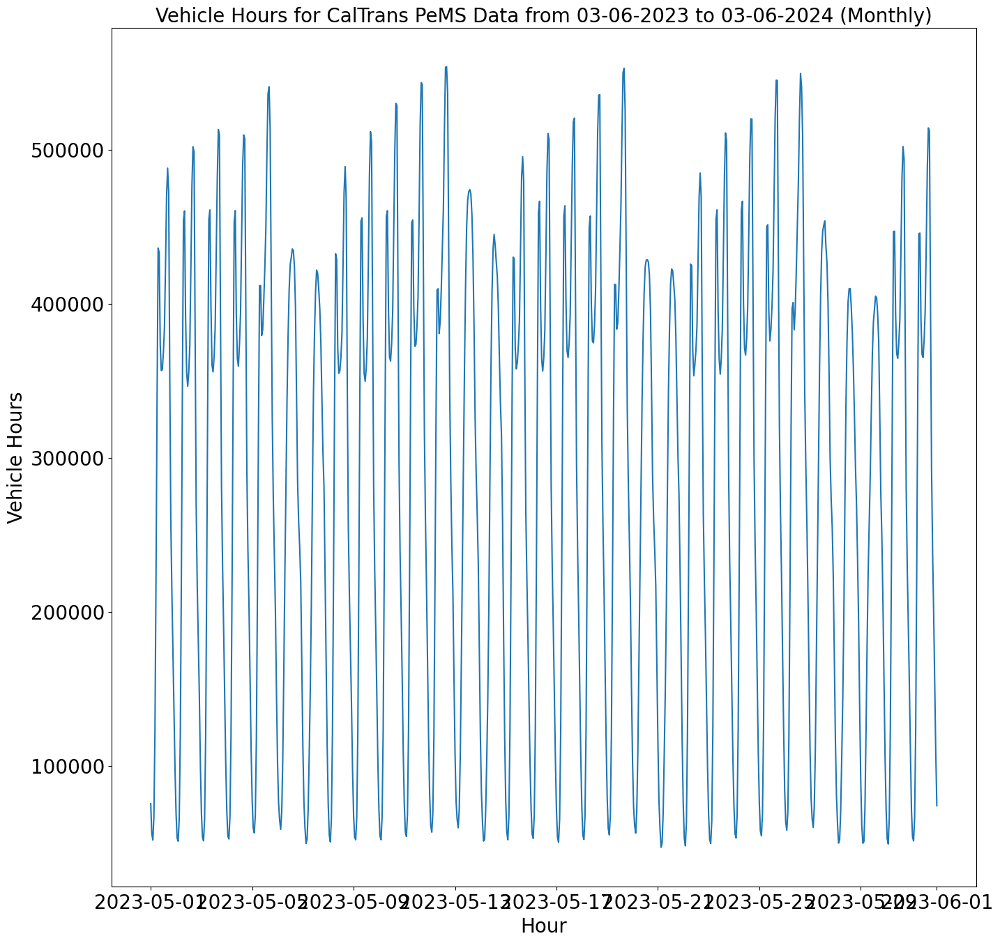

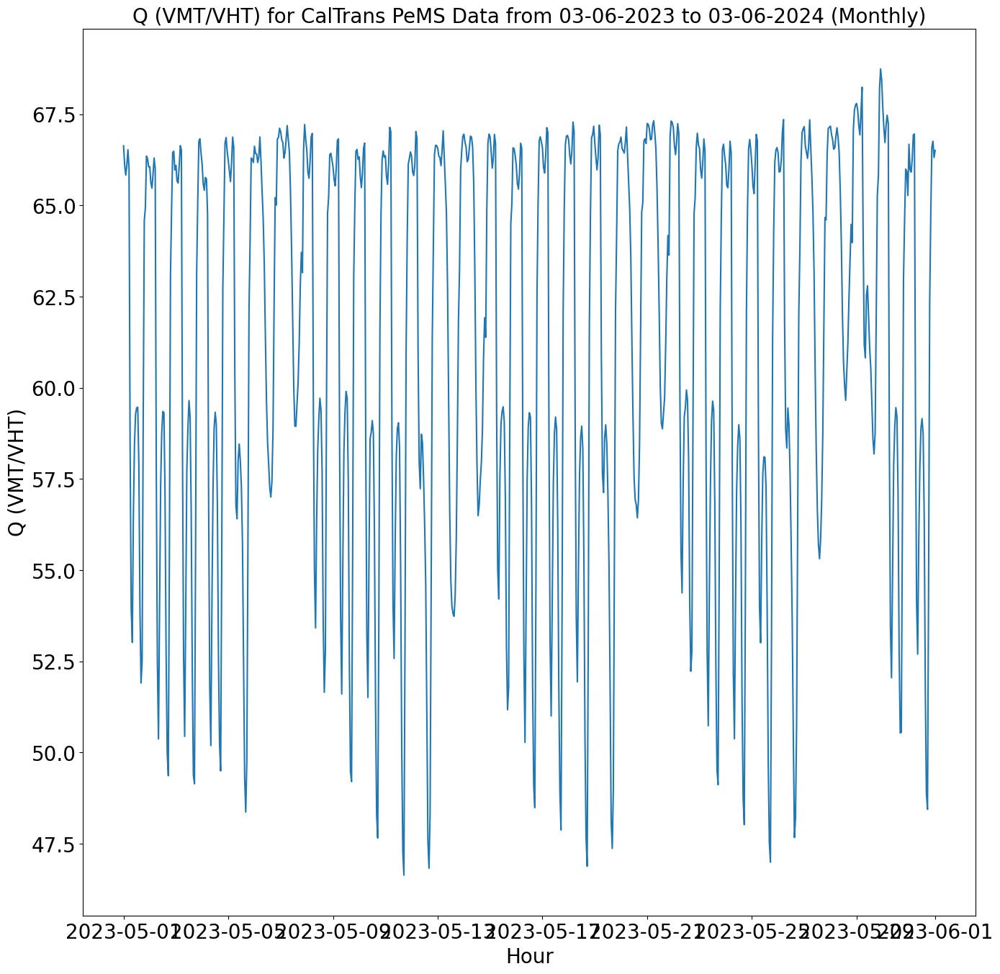

In [ ]:
plot_veh_mi_hrs(monthly_df, 0, monthly_df.shape[0], "Monthly", title_name)
plot_veh_mi_hrs_Q(monthly_df['VMT (Veh-Miles)'], 0, monthly_df.shape[0],
                  "Monthly", title_name, 'Vehicle Miles')
plot_veh_mi_hrs_Q(monthly_df['VHT (Veh-Hours)'], 0, monthly_df.shape[0],
                  "Monthly", title_name, 'Vehicle Hours')
plot_veh_mi_hrs_Q(monthly_df['Q (VMT/VHT)'], 0, monthly_df.shape[0], "Monthly",
                  title_name, 'Q (VMT/VHT)')

# Normalization Process

In [ ]:
def get_scaler(scaler):
    scalers = {
        "minmax": MinMaxScaler,
        "standard": StandardScaler,
        "maxabs": MaxAbsScaler,
        "robust": RobustScaler,
    }
    return scalers.get(scaler.lower())()

def normalize_data(df):
    scaler_type = 'minmax'
    #scaler_type = input("Enter a scaler type (minmax,standard, maxabs, robust): ")
    if (scaler_type != 'minmax') and (scaler_type != 'standard') and (scaler_type != 'maxabs') and (scaler_type != 'robust'):
      runtime.unassign()

    scaler = get_scaler(scaler_type)
    normalized_data_vmt = scaler.fit_transform(df['VMT (Veh-Miles)'].
                                               values.reshape(-1,1))
    df['vmt_norm'] = normalized_data_vmt
    normalized_data_vht = scaler.fit_transform(df['VHT (Veh-Hours)'].
                                               values.reshape(-1,1))
    df['vht_norm'] = normalized_data_vht
    normalized_data_Q = scaler.fit_transform(df['Q (VMT/VHT)'].
                                               values.reshape(-1,1))
    df['Q_norm'] = normalized_data_Q
    return df, scaler

df_norm, scaler = normalize_data(df)
df_norm_mon, scaler = normalize_data(monthly_df)
df_norm_wk, scaler = normalize_data(weekly_df)
df_norm_day, scaler = normalize_data(monthly_df)


In [ ]:
df_norm

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
Hour,,,,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342
...,...,...,...,...,...,...,...,...
2024-03-06 07:00:00,24603494.5,463279.8,53.107203,443975,54.1,0.901642,0.773489,0.397474
2024-03-06 08:00:00,23952196.6,470345.1,50.924729,443974,54.2,0.874690,0.786497,0.315210
2024-03-06 09:00:00,22128475.5,404745.4,54.672581,444146,53.0,0.799220,0.665724,0.456477


## Plot VMT, VHT, Q Normalized based on Trend and Seasonality.

Now after normalization we can observe that the data range on y-axis is 0.0 - 1.0.

### Yearly Plots (Trend)

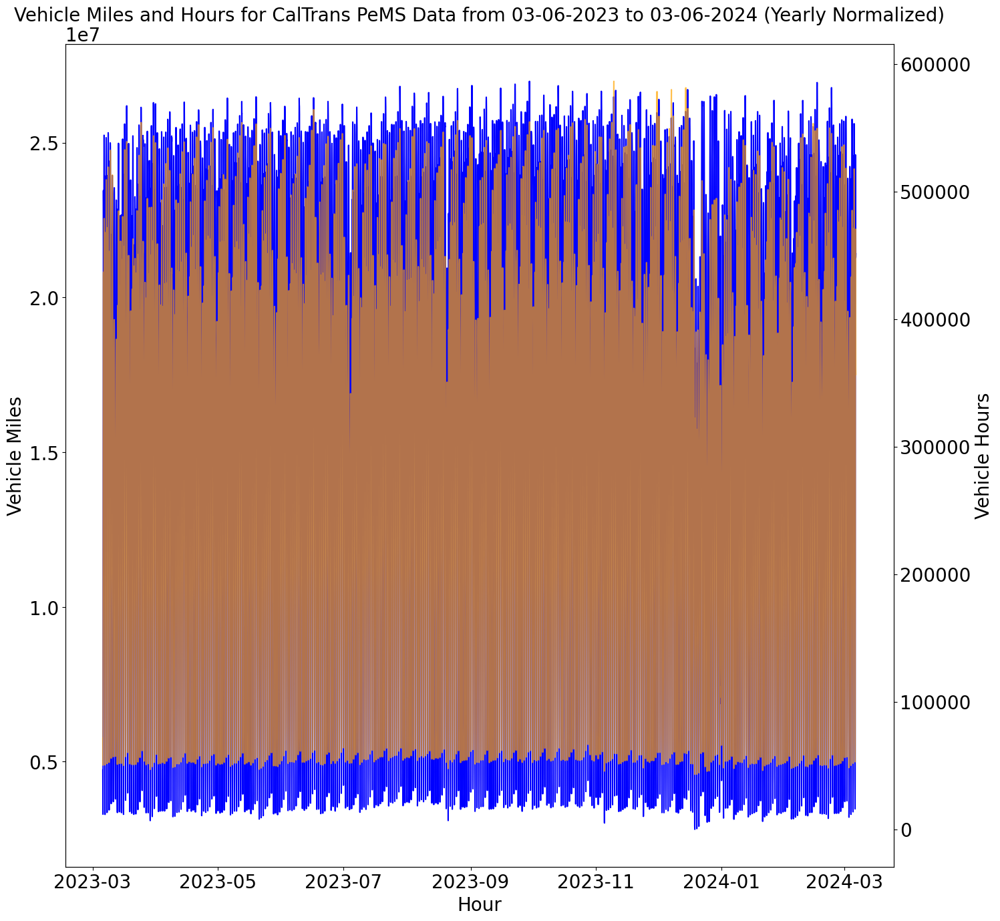

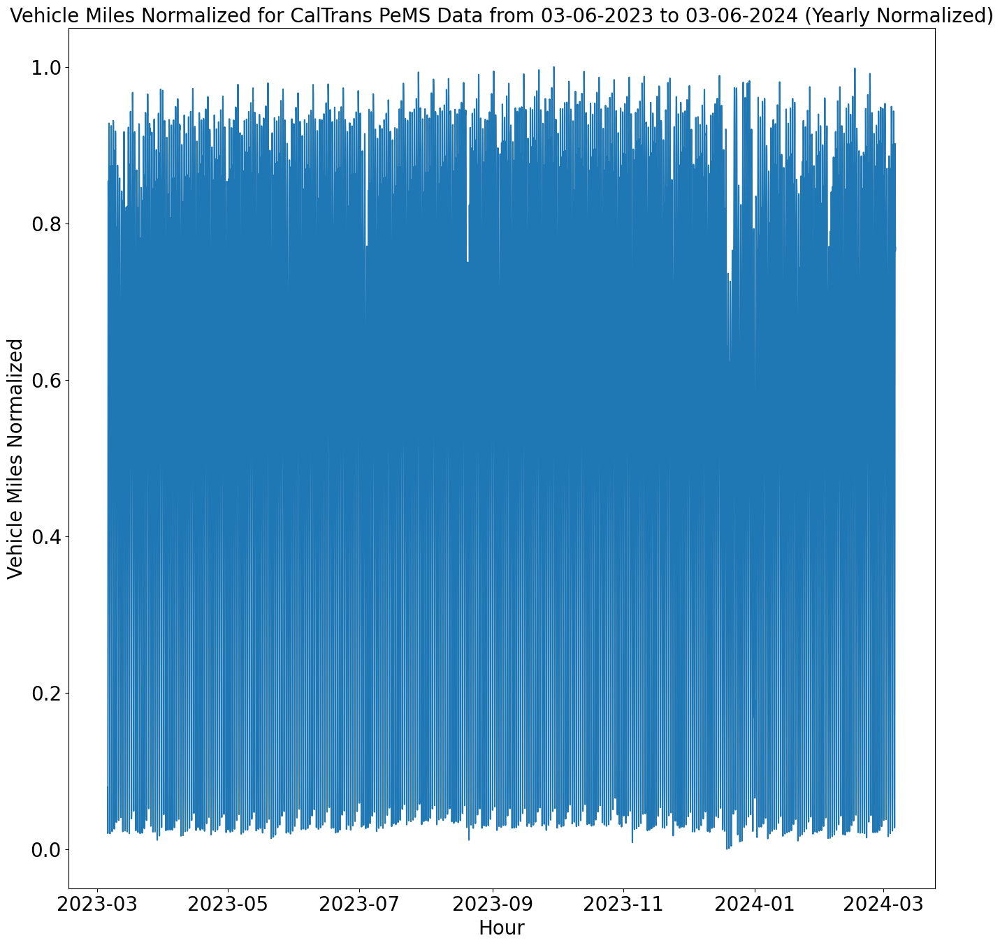

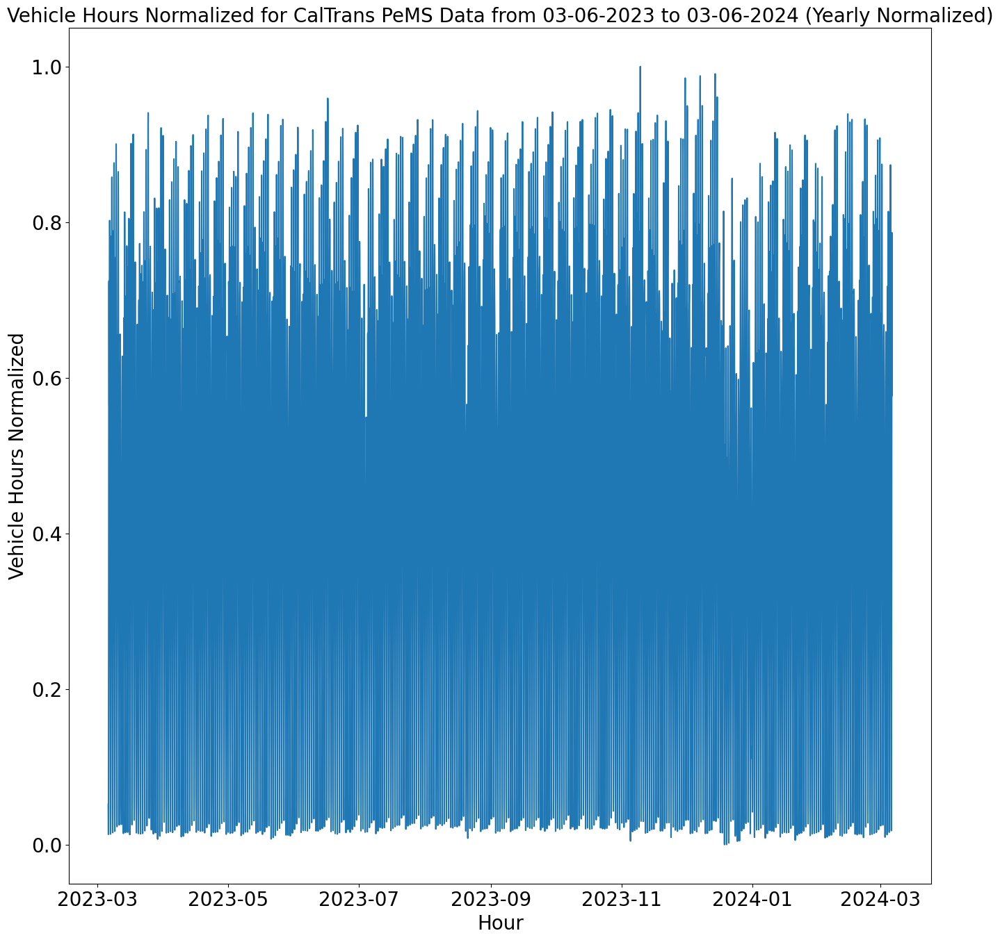

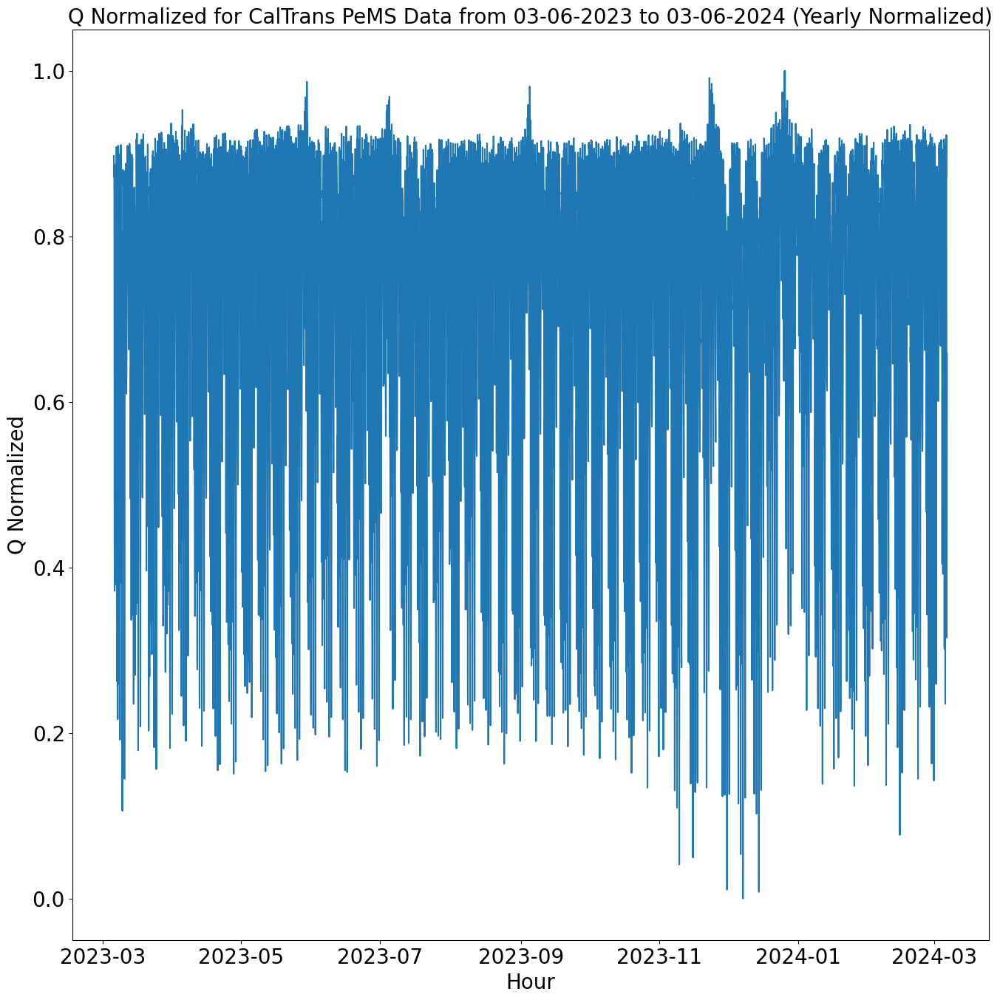

In [ ]:
plot_veh_mi_hrs(df_norm, 0, df_norm.shape[0], 'Yearly Normalized', title_name)
plot_veh_mi_hrs_Q(df_norm['vmt_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Vehicle Miles Normalized')
plot_veh_mi_hrs_Q(df_norm['vht_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Vehicle Hours Normalized')
plot_veh_mi_hrs_Q(df_norm['Q_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Q Normalized')

### Daily Plots (Seasonality)

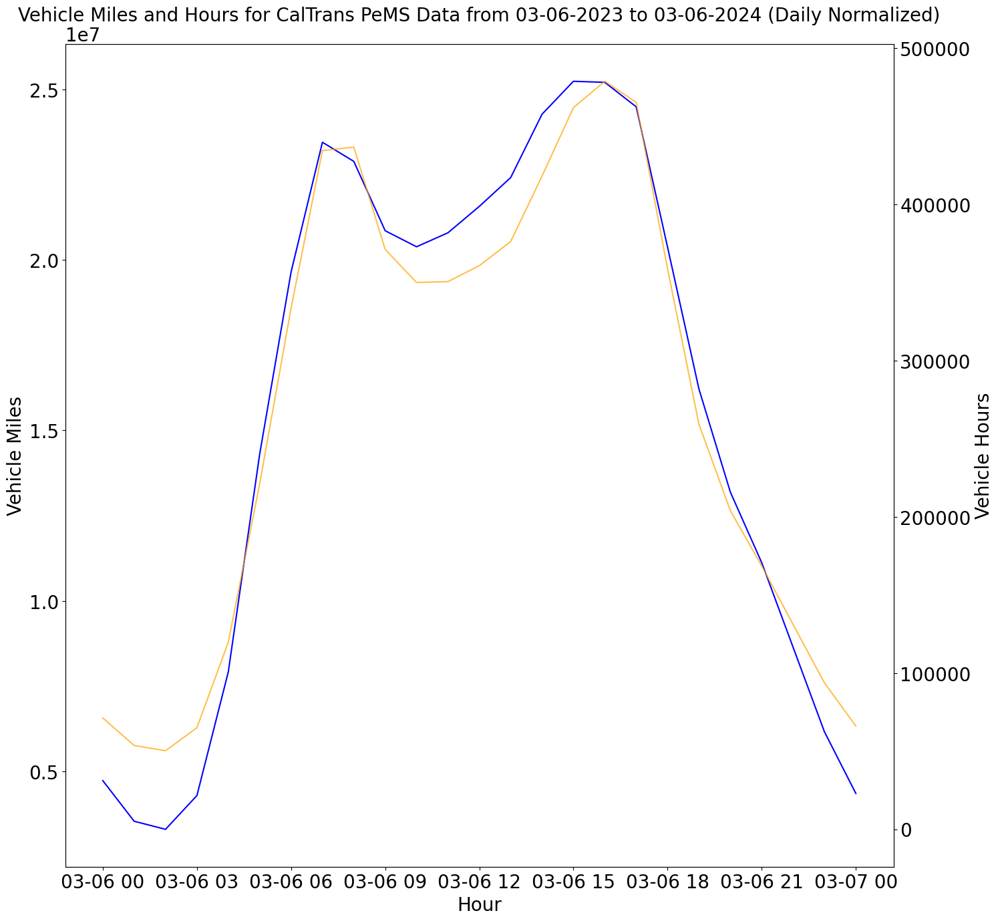

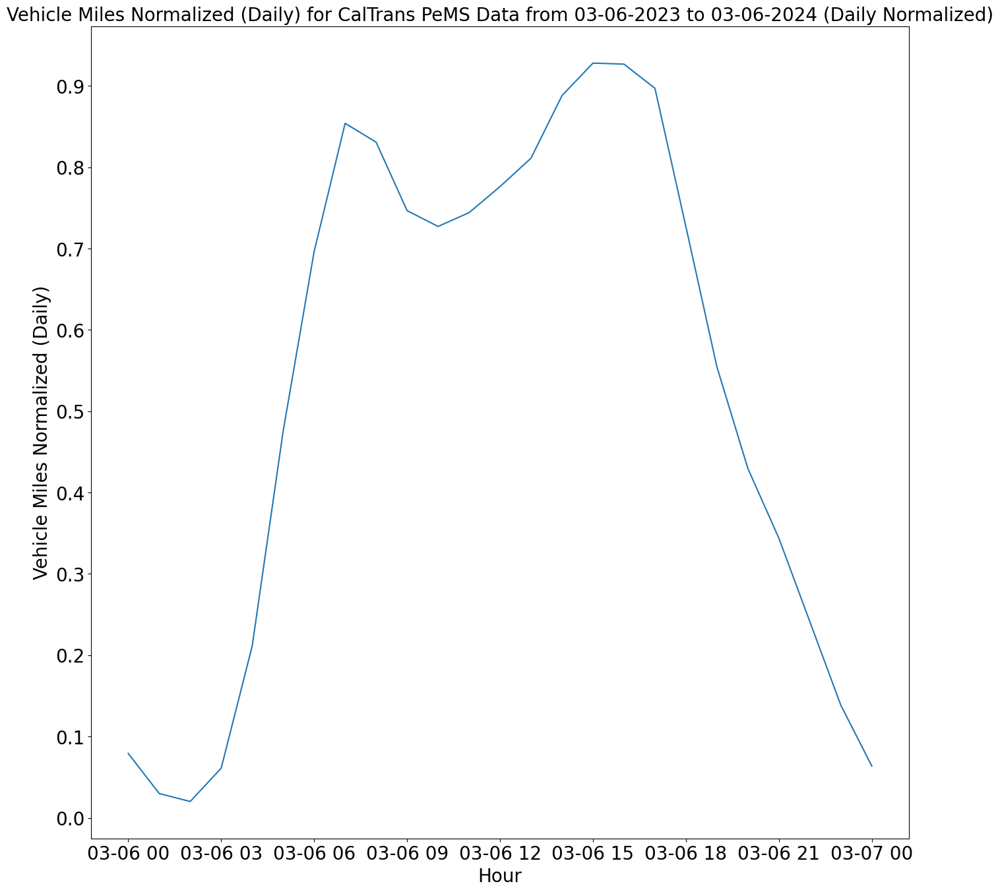

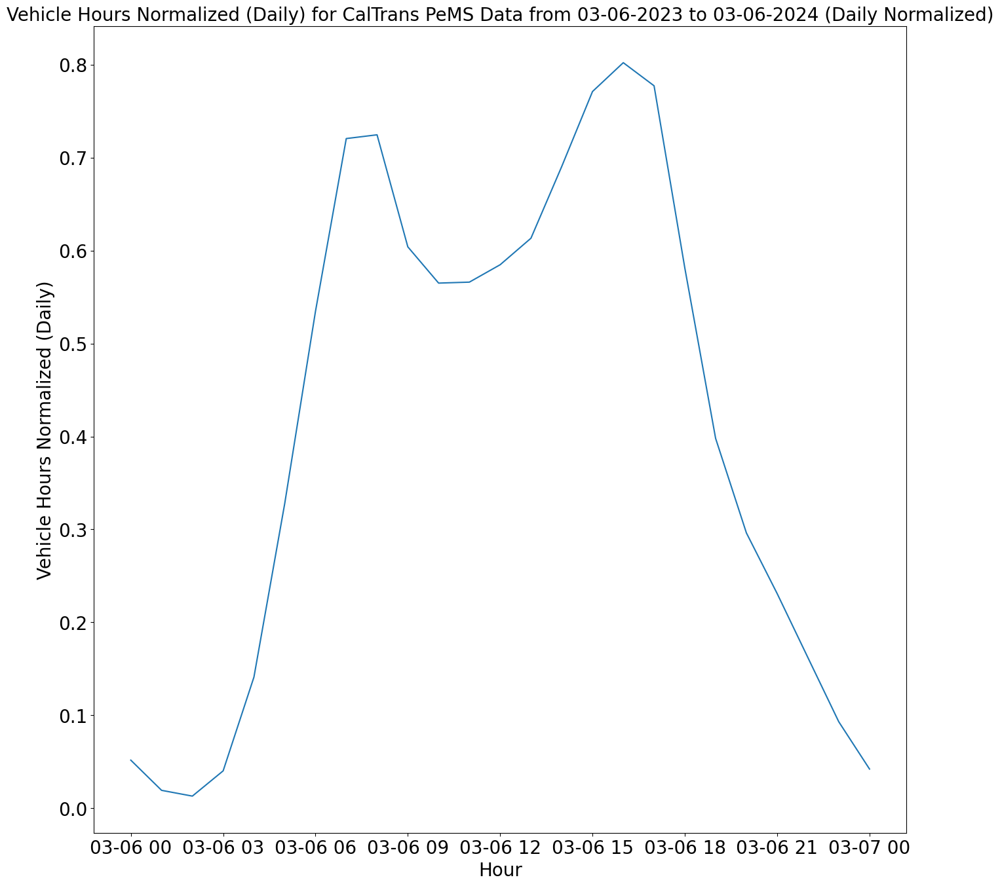

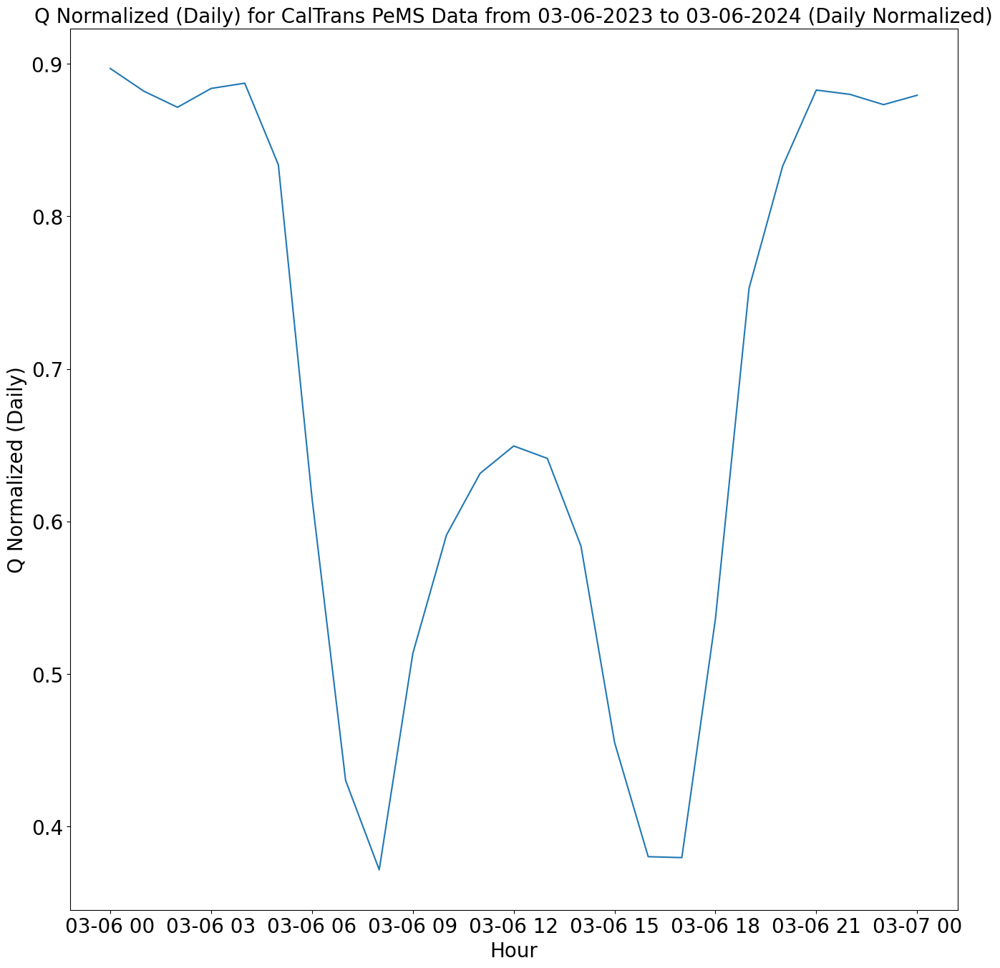

In [ ]:
plot_veh_mi_hrs(df_norm, 0, 25, 'Daily Normalized', title_name)
plot_veh_mi_hrs_Q(df_norm['vmt_norm'], 0, 25, 'Daily Normalized', title_name,
                  'Vehicle Miles Normalized (Daily)')
plot_veh_mi_hrs_Q(df_norm['vht_norm'], 0, 25, 'Daily Normalized', title_name,
                  'Vehicle Hours Normalized (Daily)')
plot_veh_mi_hrs_Q(df_norm['Q_norm'], 0, 25, 'Daily Normalized', title_name,
                  'Q Normalized (Daily)')

### Weekly Plots (Seasonality)

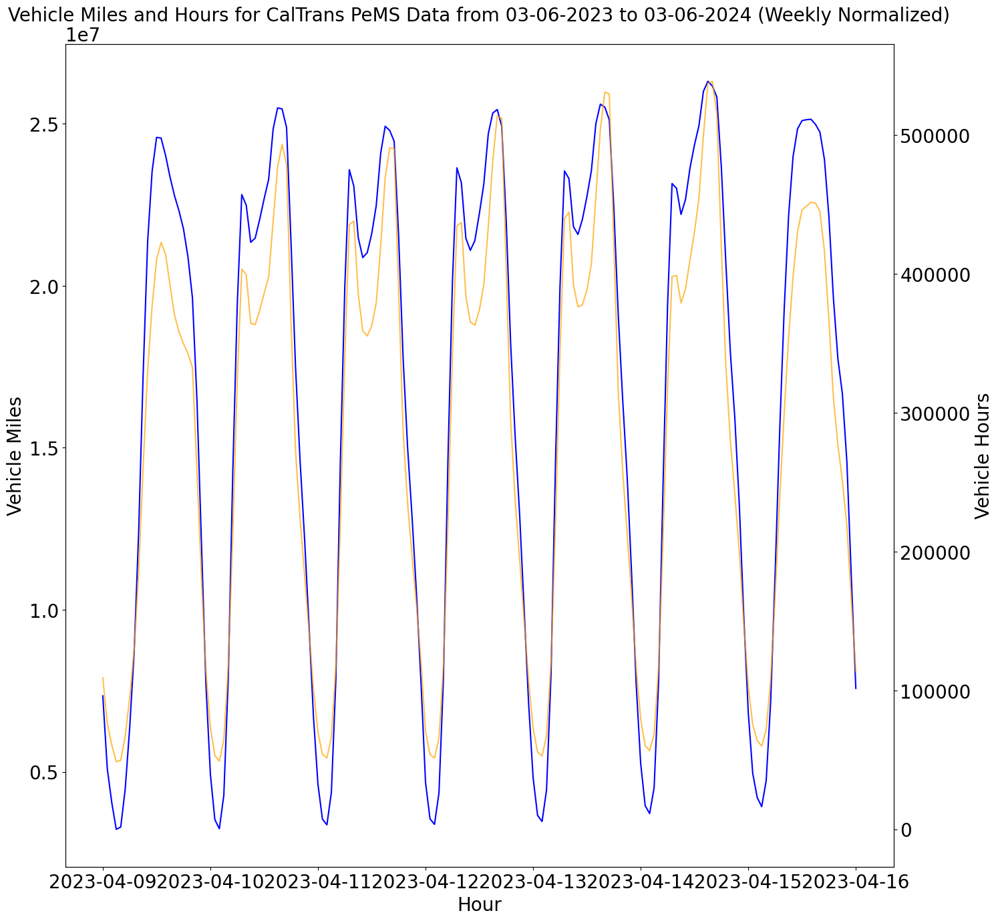

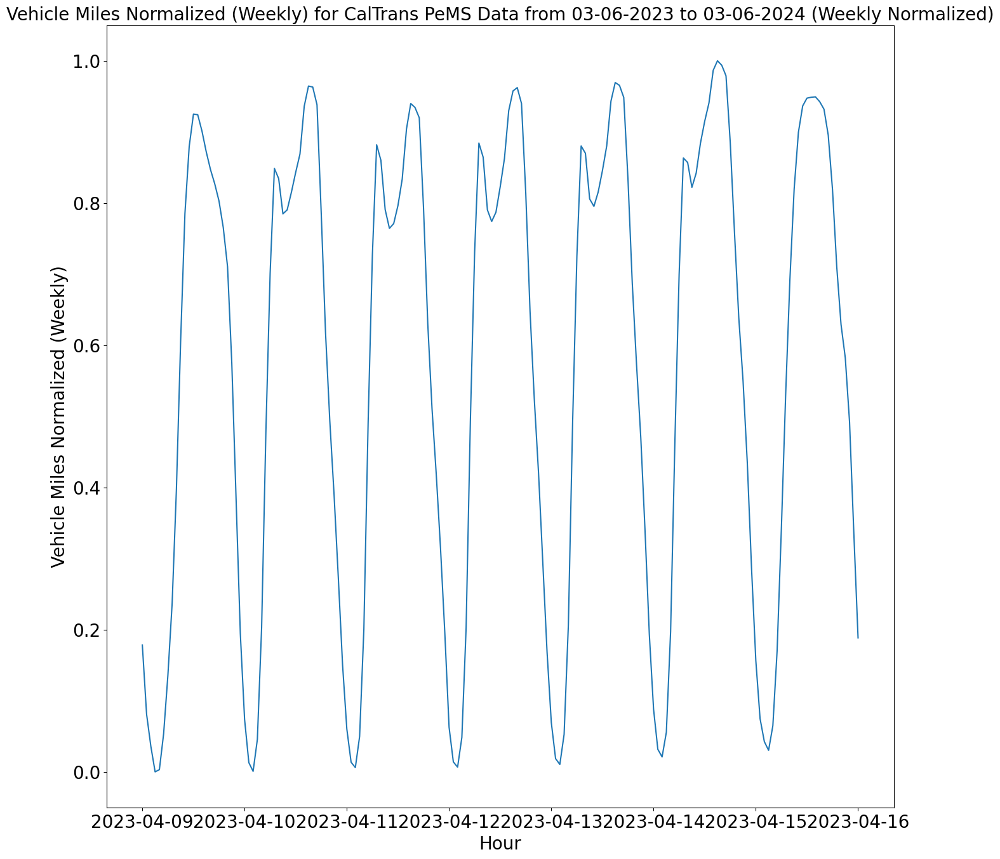

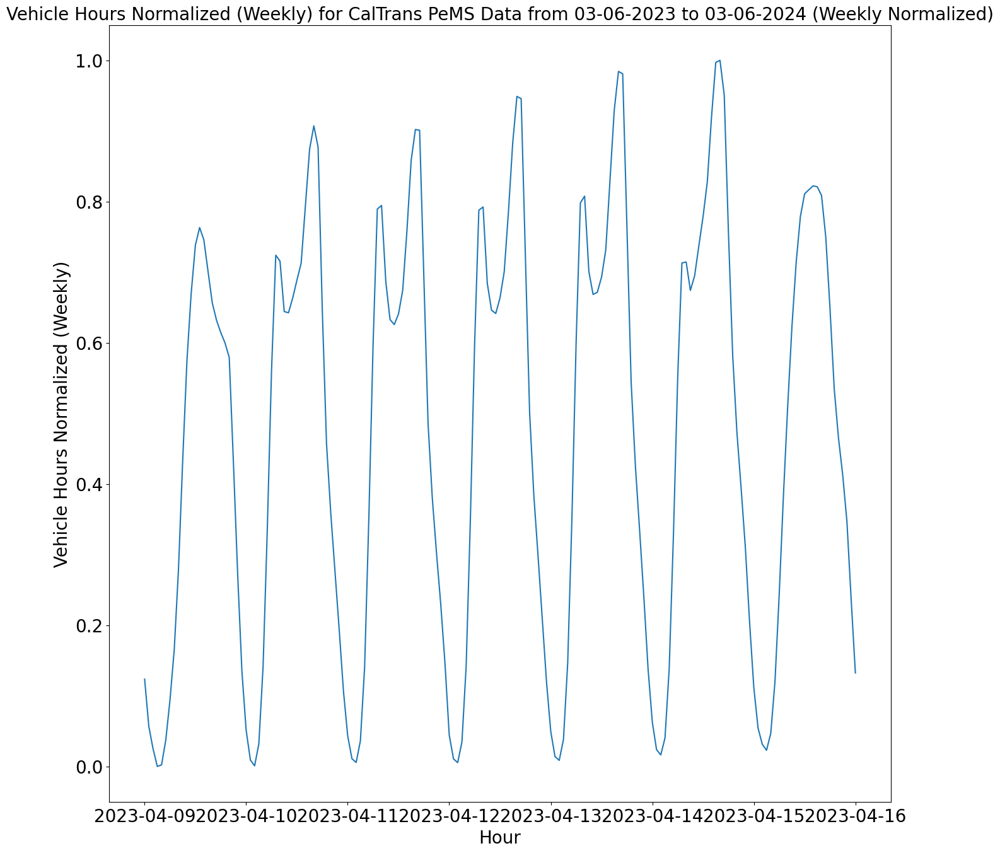

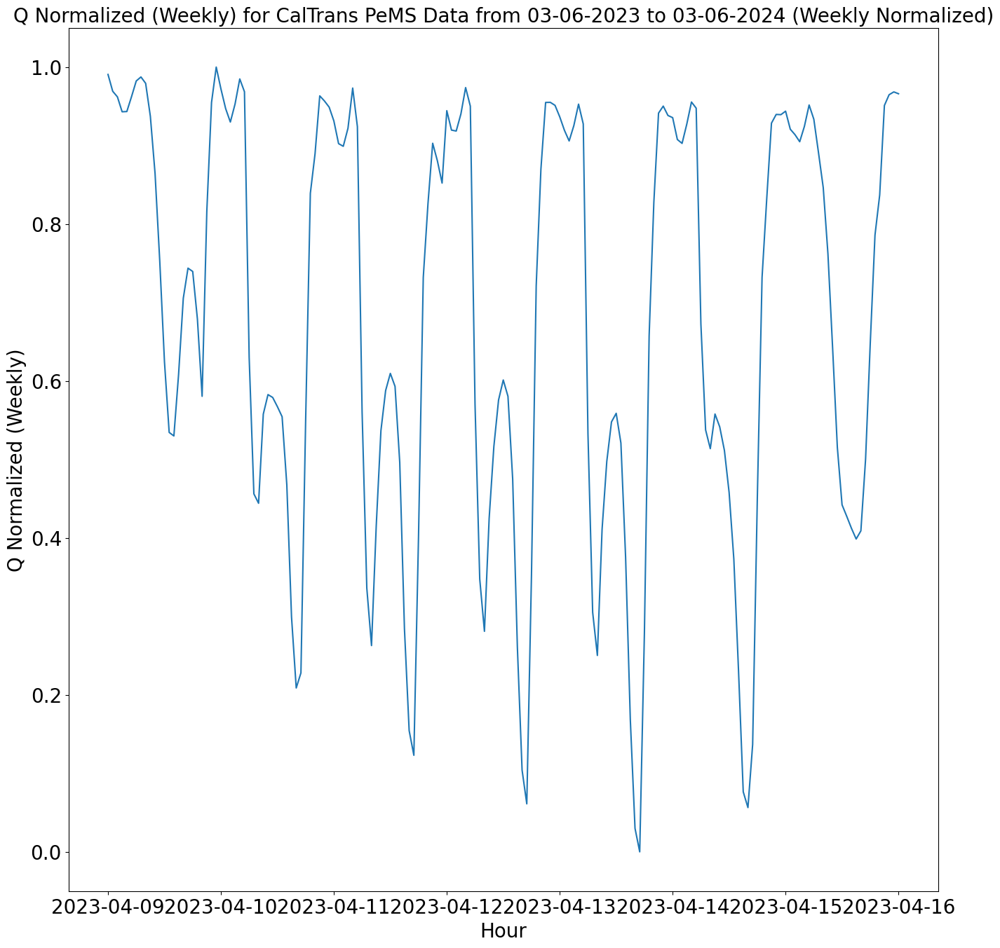

In [ ]:
plot_veh_mi_hrs(df_norm_wk, 0, df_norm_wk.shape[0], 'Weekly Normalized',
                title_name)
plot_veh_mi_hrs_Q(df_norm_wk['vmt_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name,
                  'Vehicle Miles Normalized (Weekly)')
plot_veh_mi_hrs_Q(df_norm_wk['vht_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name,
                  'Vehicle Hours Normalized (Weekly)')
plot_veh_mi_hrs_Q(df_norm_wk['Q_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name, 'Q Normalized (Weekly)')

### Monthly Plots (Seasonality)

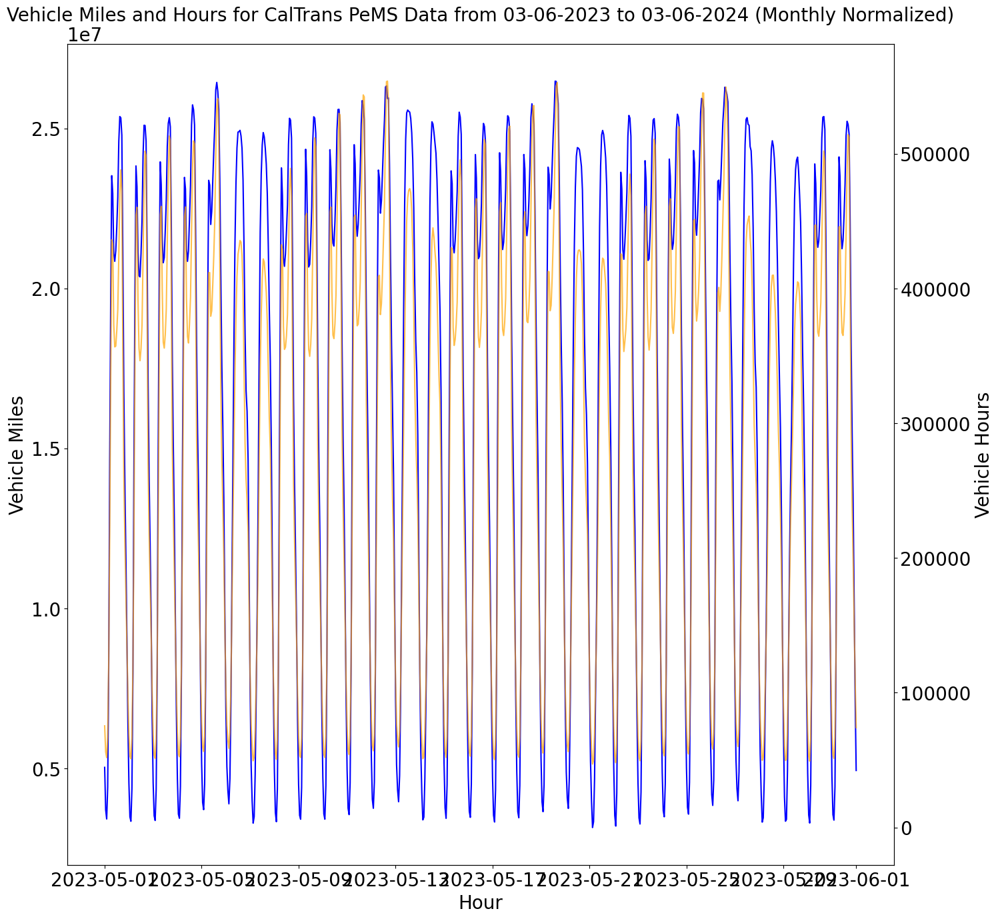

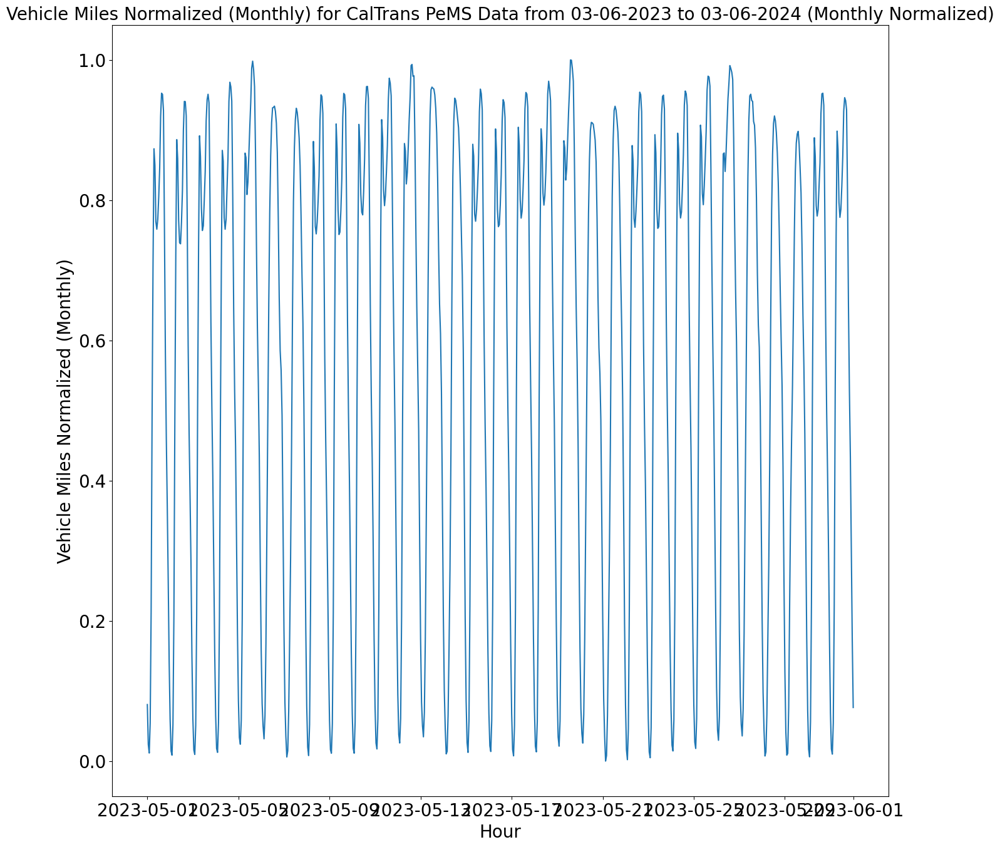

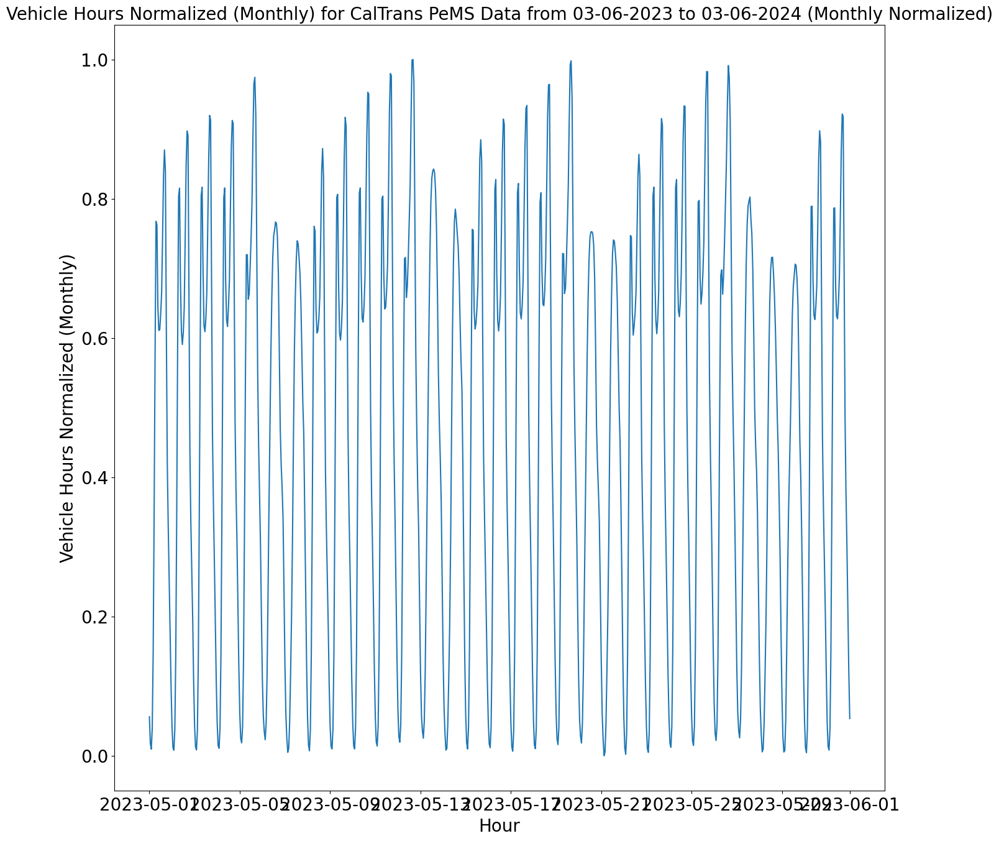

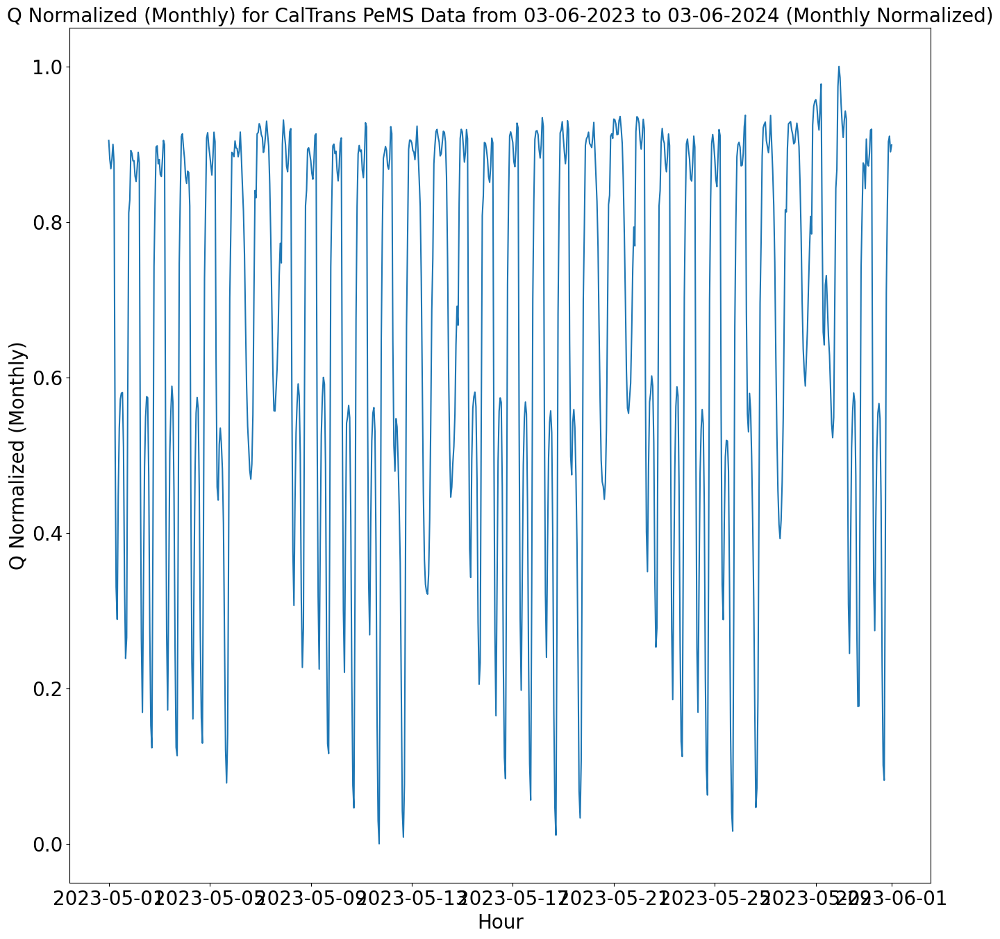

In [ ]:
plot_veh_mi_hrs(df_norm_mon, 0, df_norm_mon.shape[0], 'Monthly Normalized',
                title_name)
plot_veh_mi_hrs_Q(df_norm_mon['vmt_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Vehicle Miles Normalized (Monthly)')
plot_veh_mi_hrs_Q(df_norm_mon['vht_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Vehicle Hours Normalized (Monthly)')
plot_veh_mi_hrs_Q(df_norm_mon['Q_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Q Normalized (Monthly)')

# Let's observe train and test data on the graph

## Split into Train/Test Data.

In [ ]:
# Parameters
#n_folds = 5
#horizon = 1   # one-step ahead forecasting

# Compute fold boundaries
#total_len = len(df)
#fold_size = int((total_len * 0.2) / n_folds)   # test region = last 20%

# Rolling-origin expanding window
#train_end = int(total_len * 0.8) + n_folds * fold_size
#test_start = train_end
#test_end = test_start + fold_size

#if test_end > total_len:
#    test_end = total_len

#print(f"Train: 0 → {train_end}")
#print(f"Test : {test_start} → {test_end}")

#print("Total length:", total_len)
#print("Fold size:", fold_size)
test_size = 0.2 # Set Split rate to 4:1 (80 % Training 20 % Test).
split_pos = int(df.shape[0]*(1 - test_size))
df = df.reset_index()
df

,Hour,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
0,2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
1,2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2,2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
3,2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
4,2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342
...,...,...,...,...,...,...,...,...,...
8790,2024-03-06 07:00:00,24603494.5,463279.8,53.107203,443975,54.1,0.901642,0.773489,0.397474
8791,2024-03-06 08:00:00,23952196.6,470345.1,50.924729,443974,54.2,0.874690,0.786497,0.315210
8792,2024-03-06 09:00:00,22128475.5,404745.4,54.672581,444146,53.0,0.799220,0.665724,0.456477
8793,2024-03-06 10:00:00,21287942.9,362457.5,58.732246,443929,49.3,0.764437,0.587870,0.609496


In [ ]:
# 2019-02-06 will be the date seperation. Dates past this will be the test set.
split_date = str(df.Hour[split_pos])
#split_date = split_date[:10]
#DOM_train = df_norm.loc[df_norm.index <= split_date].copy()
DOM_train = df.loc[df_norm.index <= split_date].copy()
#DOM_test = df_norm.loc[df_norm.index > split_date].copy()
DOM_test = df.loc[df_norm.index > split_date].copy()
split_date

'2023-12-24 05:00:00'

## Plot Train/Test Split Graphs.

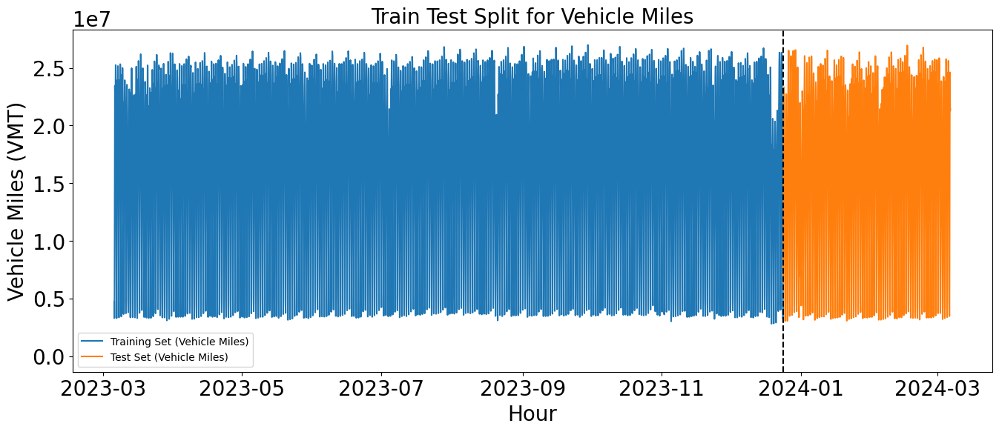

In [ ]:
# Vehicle Miles
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['VMT (Veh-Miles)'],
         label='Training Set (Vehicle Miles)')
plt.plot(DOM_test['Hour'], DOM_test['VMT (Veh-Miles)'],
         label='Testing Set (Vehicle Miles)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Vehicle Miles)', 'Test Set (Vehicle Miles)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour", fontsize = 20)
plt.ylabel("Vehicle Miles (VMT)", fontsize = 20)
plt.title("Train Test Split for Vehicle Miles", fontsize = 20)
plt.show()

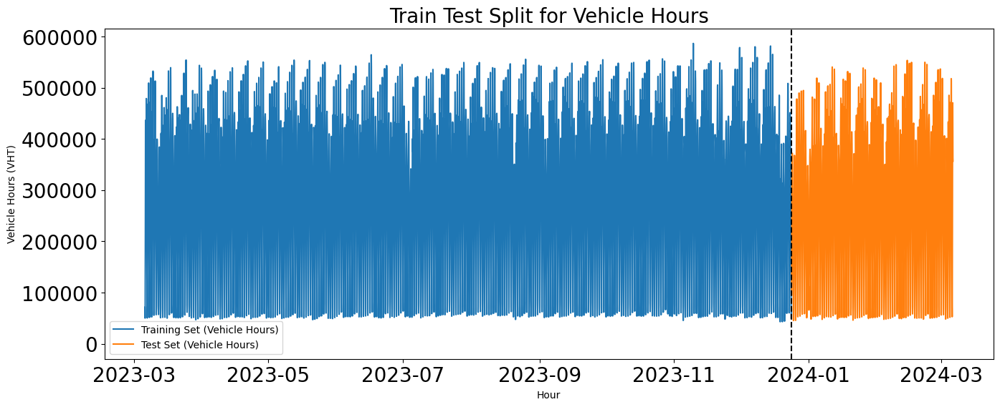

In [ ]:
# Vehicle Miles
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['VHT (Veh-Hours)'],
         label='Training Set (Vehicle Hours)')
plt.plot(DOM_test['Hour'], DOM_test['VHT (Veh-Hours)'],
         label='Testing Set (Vehicle Hours)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Vehicle Hours)', 'Test Set (Vehicle Hours)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour")
plt.ylabel("Vehicle Hours (VHT)")
plt.title("Train Test Split for Vehicle Hours", fontsize = 20)
plt.show()

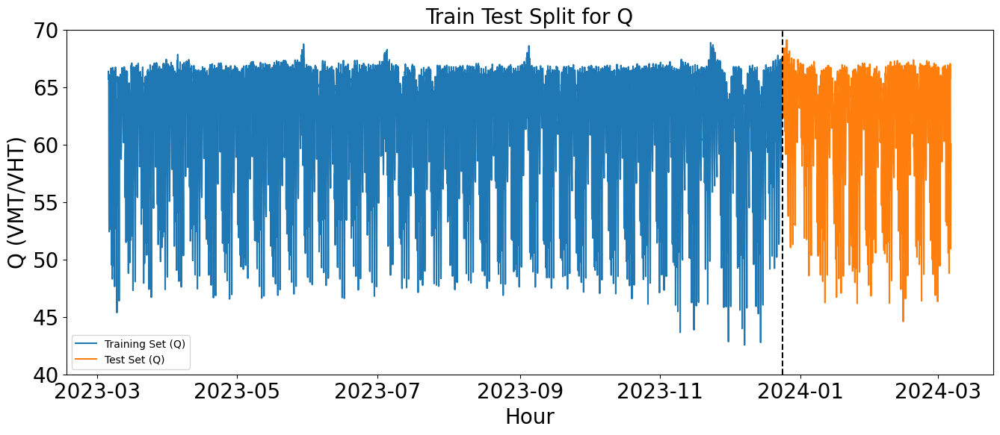

In [ ]:
# Q is the sum of VMT divided by the sum of VHT or space mean
# speeds/harmonic mean of speeds on the freeway.
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['Q (VMT/VHT)'],
         label='Training Set (Vehicle Hours)')
plt.plot(DOM_test['Hour'], DOM_test['Q (VMT/VHT)'],
         label='Testing Set (Vehicle Hours)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Q)', 'Test Set (Q)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour", fontsize = 20)
plt.ylabel("Q (VMT/VHT)", fontsize = 20)
plt.ylim([40, 70])
plt.title("Train Test Split for Q", fontsize = 20)
plt.show()

In [ ]:
# We index the Datetime column after transformation
df.set_index('Hour', inplace=True)
df.head()

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
Hour,,,,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342


# Prepare Data for Training the Models.

* With the following function block, let's set our data set as training and test data set in a model appropriate way

In [ ]:
def load_data(data, seq_len):
    X_train = []
    y_train = []

    for i in range(seq_len, len(data)):
        X_train.append(data.iloc[i-seq_len : i, 0])
        y_train.append(data.iloc[i, 0])

    # last days are going to be used in test
    X_test = X_train[split_pos:]
    y_test = y_train[split_pos:]

    # first  days are going to be used in training
    X_train = X_train[:split_pos]
    y_train = y_train[:split_pos]

    # convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    X_test = np.array(X_test)
    y_test = np.array(y_test)

    # reshape data for input into (samples, timesteps = seq_len, features = 1).
    X_train = np.reshape(X_train, (split_pos, seq_len, 1))
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))

    return [X_train, y_train, X_test, y_test]

* The **seq_len** parameter determines how far back the model will look at historical data, helping the model to capture time dependencies. This will be the timesteps we will use.
* We should note that if **seq_len** is too large, the model can become complex and prone to overlearning. For purposes of this implementation, **seq_len** will be fixed to 20 for all models.

In [ ]:
df_vht = df_norm.copy()
df_vht = df_vht.drop(columns = ['VMT (Veh-Miles)', 'VHT (Veh-Hours)',
                                'Q (VMT/VHT)', '# Lane Points', '% Observed',
                                'vmt_norm', 'Q_norm'])
#df_vht = df.copy()
#df_vht = df_vht.drop(columns = ['VMT (Veh-Miles)', '# Lane Points',
#                                '% Observed', 'vmt_norm', 'vht_norm'])

df_vmt = df_norm.copy()
df_vmt = df_vmt.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                                'Q (VMT/VHT)', '# Lane Points', '% Observed',
                                'vht_norm', 'Q_norm'])
#df_vmt = df.copy()
#df_vmt = df_vmt.drop(columns = ['VHT (Veh-Hours)','# Lane Points',
#                                '% Observed', 'vmt_norm', 'vht_norm'])

df_Q = df_norm.copy()
df_Q = df_Q.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                            'Q (VMT/VHT)', '# Lane Points', '% Observed',
                            'vmt_norm', 'vht_norm'])

#df_Q = df_norm.copy()
#df_Q = df_Q.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
#                            '# Lane Points', '% Observed', 'vmt_norm',
#                            'vht_norm', 'Q_norm'])

In [ ]:
df_norm2 = df_norm.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                                   '# Lane Points', '% Observed',])
df_norm2

,Q (VMT/VHT),vmt_norm,vht_norm,Q_norm
Hour,,,,
2023-03-06 00:00:00,66.359379,0.079266,0.051819,0.896983
2023-03-06 01:00:00,65.964212,0.029970,0.019358,0.882088
2023-03-06 02:00:00,65.684314,0.020192,0.013156,0.871538
2023-03-06 03:00:00,66.012154,0.061179,0.040319,0.883895
2023-03-06 04:00:00,66.103598,0.211209,0.141126,0.887342
...,...,...,...,...
2024-03-06 07:00:00,53.107203,0.901642,0.773489,0.397474
2024-03-06 08:00:00,50.924729,0.874690,0.786497,0.315210
2024-03-06 09:00:00,54.672581,0.799220,0.665724,0.456477


In [ ]:
df_vht

,vht_norm
Hour,
2023-03-06 00:00:00,0.051819
2023-03-06 01:00:00,0.019358
2023-03-06 02:00:00,0.013156
2023-03-06 03:00:00,0.040319
2023-03-06 04:00:00,0.141126
...,...
2024-03-06 07:00:00,0.773489
2024-03-06 08:00:00,0.786497
2024-03-06 09:00:00,0.665724


In [ ]:
df_vmt

,vmt_norm
Hour,
2023-03-06 00:00:00,0.079266
2023-03-06 01:00:00,0.029970
2023-03-06 02:00:00,0.020192
2023-03-06 03:00:00,0.061179
2023-03-06 04:00:00,0.211209
...,...
2024-03-06 07:00:00,0.901642
2024-03-06 08:00:00,0.874690
2024-03-06 09:00:00,0.799220


In [ ]:
df_Q

,Q_norm
Hour,
2023-03-06 00:00:00,0.896983
2023-03-06 01:00:00,0.882088
2023-03-06 02:00:00,0.871538
2023-03-06 03:00:00,0.883895
2023-03-06 04:00:00,0.887342
...,...
2024-03-06 07:00:00,0.397474
2024-03-06 08:00:00,0.315210
2024-03-06 09:00:00,0.456477


In [ ]:
a = int(input("Enter a number (Odd Number for Vehicle Hours,\
Even Number for Vehicle Miles\Odd Number divisible by 3 for Q (Space Mean/\
Harmonic Speed)): "))

feature = ""
selected_df = ""
feature_norm = ""
feature_field = ""

if a % 2 == 0:
    feature = 'Vehicle Miles Traveled'
    selected_df = df_vmt
    feature_norm = 'vmt_norm'
    feature_field = 'VMT (Veh-Miles)'

elif a % 3 == 0:
    feature = 'Efficiency (Q)'
    selected_df = df_Q
    feature_norm = 'Q_norm'
    feature_field = 'Q (VMT/VHT)'

else:
    feature = 'Vehicle Hours Traveled'
    selected_df = df_vht
    feature_norm = 'vht_norm'
    feature_field = 'VHT (Veh-Hours)'

print("You've chosen: {0}/{1}/{2}".format(feature, feature_norm, feature_field))

Enter a number (Odd Number for Vehicle Hours,Even Number for Vehicle Miles\Odd Number divisible by 3 for Q (Space Mean/Harmonic Speed)): 3
You've chosen: Efficiency (Q)/Q_norm/Q (VMT/VHT)


In [ ]:
seq_len = 20
#seq_len = 6*24*30

# Let's create train, test data
#X_train, y_train, X_test, y_test = load_data(df_vht, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_vmt, seq_len)
X_train, y_train, X_test, y_test = load_data(selected_df, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_norm2, seq_len)


print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)

X_train.shape =  (7036, 20, 1)
y_train.shape =  (7036,)
X_test.shape =  (1739, 20, 1)
y_test.shape =  (1739,)


In [ ]:
X_train

array([[[0.89698319],
        [0.88208833],
        [0.87153823],
        ...,
        [0.3795464 ],
        [0.53618808],
        [0.75291884]],

       [[0.88208833],
        [0.87153823],
        [0.88389539],
        ...,
        [0.53618808],
        [0.75291884],
        [0.83297667]],

       [[0.87153823],
        [0.88389539],
        [0.88734215],
        ...,
        [0.75291884],
        [0.83297667],
        [0.88284357]],

       ...,

       [[0.90815155],
        [0.89846576],
        [0.90487378],
        ...,
        [0.84631315],
        [0.86101689],
        [0.95386939]],

       [[0.89846576],
        [0.90487378],
        [0.91890749],
        ...,
        [0.86101689],
        [0.95386939],
        [0.96329094]],

       [[0.90487378],
        [0.91890749],
        [0.9199068 ],
        ...,
        [0.95386939],
        [0.96329094],
        [0.96826151]]])

In [ ]:
X_test

array([[[0.91890749],
        [0.9199068 ],
        [0.92844702],
        ...,
        [0.96329094],
        [0.96826151],
        [0.96781635]],

       [[0.9199068 ],
        [0.92844702],
        [0.9259517 ],
        ...,
        [0.96826151],
        [0.96781635],
        [0.9741406 ]],

       [[0.92844702],
        [0.9259517 ],
        [0.89934155],
        ...,
        [0.96781635],
        [0.9741406 ],
        [0.95280242]],

       ...,

       [[0.64968194],
        [0.55970156],
        [0.37723423],
        ...,
        [0.61105245],
        [0.39747358],
        [0.31521033]],

       [[0.55970156],
        [0.37723423],
        [0.2574696 ],
        ...,
        [0.39747358],
        [0.31521033],
        [0.4564768 ]],

       [[0.37723423],
        [0.2574696 ],
        [0.23532842],
        ...,
        [0.31521033],
        [0.4564768 ],
        [0.60949634]]])

In [ ]:
y_train

array([0.83297667, 0.88284357, 0.88000964, ..., 0.96329094, 0.96826151,
       0.96781635])

In [ ]:
y_test

array([0.9741406 , 0.95280242, 0.91950719, ..., 0.4564768 , 0.60949634,
       0.65818159])

## Essential Variables.

In [ ]:
epochs = 10
batch_size = 32
#loss = 'MAE'
loss = 'MSE'
activations = ['tanh', 'relu']
units = [32, 64]
filters = [32, 64]
kernel = [3, 5]
a = input("Enter the number of filters: ")
b = input("Enter the number of units: ")
c = input("Enter the number of kernels: ")
d = input("Select an activation index: ")
if not (a.isdigit()):
  a = random.randint(0, 3)
if not (b.isdigit()):
  b = random.randint(0, 2)
if not (c.isdigit()):
  c = random.randint(0, 2)
if not (d.isdigit()):
  d = random.randint(0, 2)
unit = units[int(a) % 3]
filter = filters[int(b) % 4]
kernel = kernel[int(c) % 3]
activation = activations[int(d) % 3]


Enter the number of filters: 0
Enter the number of units: 0
Enter the number of kernels: 0
Select an activation index: 0


## Training Loss vs. Epochs Plot

Plotting Accuracy and Validation Accuracy vs Epochs. Code taken from https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/.

In [ ]:
def plot_training_loss(model, model_name):
    model.history.keys()
    plt.plot(model.history['loss'])
    plt.title('Training Loss vs. Epochs for {0}'.format(model_name))
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.show()

In [ ]:
@keras.saving.register_keras_serializable()
class LIFNeuron(tf.keras.layers.Layer):
    def __init__(self, threshold=0.5, leak_rate=0.001, **kwargs):
        super(LIFNeuron, self).__init__(**kwargs)
        self.threshold = threshold
        self.leak_rate = leak_rate

    def build(self, input_shape):
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),  # Shape based on input features
            initializer='zeros',
            trainable=False
        )

    def call(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size = input_shape[0]
        seq_len = input_shape[1]
        num_features = input_shape[2]

        # Initialize batch of membrane potentials
        batch_membrane_potential = tf.tile(
            tf.expand_dims(self.membrane_potential, axis=0),
            [batch_size, 1]
        )

        # Initialize output tensor
        outputs = tf.TensorArray(dtype=tf.float32, size=seq_len)

        # Iterate over time steps using tf.while_loop
        t = tf.constant(0)
        while_condition = lambda t, outputs, batch_membrane_potential: tf.less(t, seq_len)

        def while_body(t, outputs, batch_membrane_potential):
            current_input = inputs[:, t, :]
            batch_membrane_potential = batch_membrane_potential * (1 - self.leak_rate) + current_input
            spikes = tf.cast(batch_membrane_potential >= self.threshold, dtype=tf.float32)
            batch_membrane_potential = batch_membrane_potential * (1 - spikes)
            outputs = outputs.write(t, spikes)
            t = tf.add(t, 1)
            return t, outputs, batch_membrane_potential

        _, outputs, _ = tf.while_loop(while_condition, while_body, [t, outputs, batch_membrane_potential])

        outputs = outputs.stack()  # Stack the outputs from the TensorArray
        outputs = tf.transpose(outputs, [1, 0, 2])  # Reshape to (batch_size, seq_len, num_features)

        return outputs

In [ ]:
'''class LIFNeuron(tf.keras.layers.Layer):
    def __init__(self, threshold=0.5, leak_rate=0.001, **kwargs):
        super(LIFNeuron, self).__init__(**kwargs)
        self.threshold = threshold
        self.leak_rate = leak_rate

    def build(self, input_shape):
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),  # Shape based on input features
            initializer='zeros',
            trainable=False
        )

    def call(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size = input_shape[0]
        seq_len = input_shape[1]
        num_features = input_shape[2]

        # Initialize batch of membrane potentials
        batch_membrane_potential = tf.tile(
            tf.expand_dims(self.membrane_potential, axis=0),
            [batch_size, 1]
        )

        # Initialize output tensor
        outputs = tf.TensorArray(dtype=tf.float32, size=seq_len)

        # Iterate over time steps using tf.while_loop
        t = tf.constant(0)
        while_condition = lambda t, outputs, batch_membrane_potential: tf.less(t, seq_len)

        def while_body(t, outputs, batch_membrane_potential):
            current_input = inputs[:, t, :]
            batch_membrane_potential = batch_membrane_potential * (1 - self.leak_rate) + current_input
            spikes = tf.cast(batch_membrane_potential >= self.threshold, dtype=tf.float32)
            batch_membrane_potential = batch_membrane_potential * (1 - spikes)
            outputs = outputs.write(t, spikes)
            t = tf.add(t, 1)
            return t, outputs, batch_membrane_potential

        _, outputs, _ = tf.while_loop(while_condition, while_body, [t, outputs, batch_membrane_potential])

        outputs = outputs.stack()  # Stack the outputs from the TensorArray
        outputs = tf.transpose(outputs, [1, 0, 2])  # Reshape to (batch_size, seq_len, num_features)

        return outputs'''

"class LIFNeuron(tf.keras.layers.Layer):\n    def __init__(self, threshold=0.5, leak_rate=0.001, **kwargs):\n        super(LIFNeuron, self).__init__(**kwargs)\n        self.threshold = threshold\n        self.leak_rate = leak_rate\n\n    def build(self, input_shape):\n        self.membrane_potential = self.add_weight(\n            name='membrane_potential',\n            shape=(input_shape[-1],),  # Shape based on input features\n            initializer='zeros',\n            trainable=False\n        )\n\n    def call(self, inputs):\n        input_shape = tf.shape(inputs)\n        batch_size = input_shape[0]\n        seq_len = input_shape[1]\n        num_features = input_shape[2]\n\n        # Initialize batch of membrane potentials\n        batch_membrane_potential = tf.tile(\n            tf.expand_dims(self.membrane_potential, axis=0),\n            [batch_size, 1]\n        )\n\n        # Initialize output tensor\n        outputs = tf.TensorArray(dtype=tf.float32, size=seq_len)\n\n      

## New LIF Class using Refractory Period

In [ ]:
@keras.saving.register_keras_serializable()
class LIFNeuronV3(tf.keras.layers.Layer):
  def __init__(self, threshold=1.0, leak_rate=0.05, refractory_period=5, **kwargs):
      super(LIFNeuronV3 , self).__init__(**kwargs)
      self.threshold = threshold
      self.leak_rate = leak_rate
      self.refractory_period = refractory_period
      self.membrane_potential = None
      self.return_sequences = True # Flag to return output sequence

  def build(self, input_shape):
    self.num_neurons = input_shape[-1]  # Store the number of neurons
    self.membrane_potential = self.add_weight(
          name='membrane_potential',
          #shape=(input_shape[0], input_shape[-1]),
          #shape=(None, self.num_neurons),
          #shape=(input_shape[1], input_shape[-1]),
          #shape=(seq_len, num_features),  # Use Python integers
          shape=(1, self.num_neurons),
          initializer='zeros',
          trainable=False

      )

    self.refractory_counter = self.add_weight(
            name='refractory_counter',
            shape = (),
            #shape=(self.num_neurons,),
            #shape=(1, self.num_neurons),
            initializer='zeros',
            trainable=False,
            dtype=tf.int32  # Ensure refractory_counter is an integer type
        )


  def call(self, inputs):
      input_shape = tf.shape(inputs)
      inputs = tf.reshape(inputs, (input_shape[0], input_shape[1], input_shape[2]))

      # Replace for loop with tf.while_loop
      def while_body(t, sample_outputs_ta, membrane_potential, refractory_counter, sample):
          current_input = tf.gather(sample, t, axis=0)  # Get input at time step t
          membrane_potential = membrane_potential * (1 - self.leak_rate) + current_input

          # Check refractory period
          spikes = tf.cond(
              refractory_counter > 0,
              lambda: tf.zeros_like(membrane_potential),
              lambda: tf.cast(membrane_potential >= self.threshold, dtype=tf.float32)
          )

          # Reset potential and update refractory counter
          reset_condition = tf.reduce_any(spikes > 0)
          membrane_potential = tf.cond(reset_condition,
                                      lambda: membrane_potential * (1 - spikes),
                                      lambda: membrane_potential)

          refractory_counter = tf.cond(reset_condition,
                                      #lambda: self.refractory_period,
                                      lambda: tf.constant(self.refractory_period, dtype=tf.int32),
                                      lambda: tf.maximum(0, refractory_counter - 1))

          # Reshape spikes before writing to TensorArray
          spikes = tf.reshape(spikes, (1, self.num_neurons))  # Shape as (1, num_neurons)
          sample_outputs_ta = sample_outputs_ta.write(t, spikes)

          return tf.add(t, 1), sample_outputs_ta, membrane_potential, refractory_counter, sample

      # Initialize loop variables
      t = tf.constant(0)
      max_time_steps = input_shape[1]

      # Execute the loop for each sample in the batch using tf.map_fn
      def process_sample(sample):
          # Initialize TensorArray inside process_sample
          sample_outputs_ta = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)

          _, sample_outputs_ta, _, _, _ = tf.while_loop(
              lambda t, *_: tf.less(t, max_time_steps),
              while_body,
              [t, sample_outputs_ta, self.membrane_potential, self.refractory_counter, sample]
          )
          sample_outputs = sample_outputs_ta.stack()
          return sample_outputs

      # Use tf.map_fn to process each sample in the batch
      outputs = tf.map_fn(process_sample, inputs, dtype=tf.float32)

      return outputs

## Create SpikingActivation Class.

Due to the depreciation of keras_spiking.SpikingActivation, a custom SpikingActivation class is provided below prior to creating the model.

In [ ]:
@keras.saving.register_keras_serializable()
class SpikingActivationCell(tf.keras.layers.Layer):
    def __init__(self, activation='tanh', threshold=1.0, **kwargs):
        super(SpikingActivationCell, self).__init__(**kwargs)
        self.activation = activation
        self.threshold = threshold
        self.state_size = 1  # State to store membrane potential

    def build(self, input_shape):
        # The membrane_potential should have the shape of the input features.
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),  # Match the input feature shape
            initializer='zeros',
            trainable=False
        )
        super(SpikingActivationCell, self).build(input_shape)

    def call(self, inputs, states):
        prev_membrane_potential = states[0]

        # Apply activation function
        activated_input = tf.keras.activations.get(self.activation)(inputs)

        # Update membrane potential
        membrane_potential = prev_membrane_potential + activated_input

        # Generate spikes based on threshold
        spikes = tf.cast(membrane_potential >= self.threshold, dtype=tf.float32)

        # Reset membrane potential after spike
        membrane_potential = membrane_potential - spikes * self.threshold

        # Return the spikes and the updated membrane potential as the new state
        return spikes, [membrane_potential]

@keras.saving.register_keras_serializable()
class SpikingActivationLayer(tf.keras.layers.RNN):
    def __init__(self, activation='tanh', threshold=1.0, **kwargs):
        cell = SpikingActivationCell(activation=activation, threshold=threshold)
        super(SpikingActivationLayer, self).__init__(cell, **kwargs)


## sMAPE Function

In [ ]:
def symmetric_mean_absolute_percentage_error(y_true, y_pred):
    # Ensure y_true and y_pred are numpy arrays
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    # Calculate the absolute difference between true and predicted values
    abs_diff = np.abs(y_true - y_pred)

    # Calculate the sum of absolute true and predicted values, divided by 2
    # Add a small epsilon to the denominator to avoid division by zero
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
    epsilon = np.finfo(np.float64).eps # Smallest positive floating-point number

    # Calculate sMAPE
    # Handle cases where denominator might be zero by setting those to zero error
    smape = np.mean(np.where(denominator == 0, 0, abs_diff / denominator)) * 100

    return smape

## Confidence Intervals for MAE and RMSE using Bootstrapping

In [ ]:
def calculate_bootstrap_ci(y_true, y_pred, metric_func, n_bootstraps=1000,
                           confidence_level=0.95):
    bootstrap_metrics = []
    n_samples = len(y_true)

    for _ in range(n_bootstraps):
        # Bootstrap resampling with replacement
        indices = np.random.choice(n_samples, n_samples, replace=True)
        y_true_sample = y_true[indices]
        y_pred_sample = y_pred[indices]

        # Calculate the metric for the bootstrapped sample
        metric_value = metric_func(y_true_sample, y_pred_sample)
        bootstrap_metrics.append(metric_value)

    # Calculate the confidence interval
    lower_bound = np.percentile(bootstrap_metrics, (1 - confidence_level) / 2
                                * 100)
    upper_bound = np.percentile(bootstrap_metrics, (1 + confidence_level) / 2
                                * 100)

    return lower_bound, upper_bound

In [ ]:
def perform_statistical_tests(y_true, y_pred, model_name):
    print(f"\n--- Statistical Tests for {model_name} ---")

    # Ensure y_pred is flattened if it's a 2D array
    if y_pred.ndim > 1:
        y_pred = y_pred.flatten()

    # Calculate differences for paired tests
    differences = y_true - y_pred

    # Paired t-test
    try:
        t_statistic, p_value_t = scipy.stats.ttest_rel(y_true, y_pred)
        print(f"Paired t-test: t-statistic = {t_statistic:.4f}, p-value = {p_value_t:.4f}")
        if p_value_t < 0.05:
            print("(Result is statistically significant: there is a significant difference between actual and predicted values)")
        else:
            print("(Result is not statistically significant: no significant difference found)")
    except Exception as e:
        print(f"Paired t-test could not be performed: {e}")

    # Wilcoxon signed-rank test (non-parametric alternative to paired t-test)
    try:
        # The Wilcoxon test expects non-zero differences
        non_zero_differences = differences[differences != 0]
        if len(non_zero_differences) > 0:
            wilcoxon_statistic, p_value_wilcoxon = scipy.stats.wilcoxon(non_zero_differences)
            print(f"Wilcoxon Signed-Rank Test: statistic = \
            {wilcoxon_statistic:.4f}, p-value = {p_value_wilcoxon:.4f}")
            if p_value_wilcoxon < 0.05:
                print("(Result is statistically significant: there is a significant difference between actual and predicted values)")
            else:
                print("(Result is not statistically significant: no significant difference found)")
        else:
            print("Wilcoxon Signed-Rank Test skipped: All differences are zero.")
    except Exception as e:
        print(f"Wilcoxon Signed-Rank Test could not be performed: {e}")

## Diebold-Mariano Test Functions

In [ ]:
from statsmodels.stats.api import DescrStatsW

def diebold_mariano_test(y_true, y_pred1, y_pred2, h=1, power=2):
    # Ensure inputs are numpy arrays
    y_true = np.array(y_true).flatten()
    y_pred1 = np.array(y_pred1).flatten()
    y_pred2 = np.array(y_pred2).flatten()

    # Calculate loss differentials
    # L(y_true, y_pred) = |y_true - y_pred|^power
    loss1 = np.abs(y_true - y_pred1)**power
    loss2 = np.abs(y_true - y_pred2)**power

    d_t = loss1 - loss2

    # DM statistic calculation
    # Reference: Diebold, F. X., & Mariano, R. S. (1995).
    # "Comparing Predictive Accuracy." Journal of Business & Economic Statistics, 13(3), 253-263.

    n = len(d_t)
    # For h-step ahead forecasts, we need to account for serial correlation
    # up to h-1 lags. The formula for the variance of the sample mean of d_t
    # involves an autocovariance function.

    # For a simple case (h=1), the variance can be estimated using a simple variance.
    # For h > 1, a more robust estimator like Newey-West or a similar HAC estimator is needed.
    # statsmodels.stats.sandwich_covariance.HAC for more advanced usage.
    # For simplicity, here we'll use a basic approach or rely on DescrStatsW for a variance estimate.

    # For non-overlapping, one-step ahead, we can simply test if the mean of d_t is different from zero.
    mean_d = np.mean(d_t)
    std_d = np.std(d_t, ddof=1) # sample standard deviation

    if std_d == 0:
        dm_statistic = 0.0 # If all differences are the same, no variance
        p_value = 1.0
    else:
        dm_statistic = mean_d / (std_d / np.sqrt(n))
        # Two-sided p-value from standard normal distribution (as n is large)
        p_value = 2 * (1 - scipy.stats.norm.cdf(np.abs(dm_statistic)))

    # More robust way using statsmodels if needed, for simplicity sticking to the above.
    # dm_test_res = DescrStatsW(d_t)
    # dm_statistic_robust = dm_test_res.tconfint_mean()[0] # This is not directly the statistic.
    # dm_statistic_robust = dm_test_res.tstat
    # p_value_robust = dm_test_res.pvalue

    return dm_statistic, p_value

# DM test with different powers (MAE or MSE based loss)
def diebold_mariano_mae(y_true, y_pred1, y_pred2, h=1):
    return diebold_mariano_test(y_true, y_pred1, y_pred2, h=h, power=1)

def diebold_mariano_mse(y_true, y_pred1, y_pred2, h=1):
    return diebold_mariano_test(y_true, y_pred1, y_pred2, h=h, power=2)

## Spike Sparsity
Spike sparsity refers to the proportion of 'silent' (non-spiking) events in a neuron's activity over a given time. It's often expressed as 1 - spike density, where spike density is the proportion of actual spikes relative to the total possible spike events. In energy-efficient SNNs, higher sparsity (lower density) can indicate lower energy consumption as neurons are active less frequently.

In [ ]:
def compute_spike_sparsity(spikes):
    """
    spikes: np.array of 0/1 with shape (T, N) or (B, T, N)
    returns: sparsity in [0, 1]
    """
    spikes = np.asarray(spikes)
    total_events = np.prod(spikes.shape)
    total_spikes = np.count_nonzero(spikes)
    density = total_spikes / total_events
    sparsity = 1.0 - density
    return sparsity, density

## Measure ANN Energy

In [ ]:
def measure_ann_energy(model, X_test, model_name_str=None):
    # Define general power estimates (in Watts) - these are NOT specific to Colab
    # Use these values for a rough conceptual energy estimation only.
    # Adjust these based on your research or assumptions for typical hardware.
    general_cpu_power_watts = 80 # Example general CPU power under load
    general_gpu_power_watts = 200 # Example general GPU power under load

    print("Measuring inference time and estimating energy on CPU (for ANN)...")
    with tf.device('/CPU:0'):
        # Warm-up pass to ensure operations are ready
        _ = model.predict(X_test[:1], verbose=0)
        start_time_cpu = time.time()
        _ = model.predict(X_test, verbose=0)
        end_time_cpu = time.time()
        cpu_inference_time = end_time_cpu - start_time_cpu
        estimated_cpu_energy = general_cpu_power_watts * cpu_inference_time
        estimated_cpu_energy_uJ = estimated_cpu_energy * 1e6 # Convert to microjoules

    print(f"  CPU Inference Time: {cpu_inference_time:.4f} seconds")
    print(f"  Estimated CPU Energy: {estimated_cpu_energy:.4f} Joules ({estimated_cpu_energy_uJ:.4f} \u00B5J)")

    gpu_inference_time = None
    estimated_gpu_energy_J = None
    estimated_gpu_energy_uJ = None

    if tf.config.list_physical_devices('GPU'):
        print("\nMeasuring inference time and estimating energy on GPU (for ANN)...")
        with tf.device('/GPU:0'):
            _ = model.predict(X_test[:1], verbose=0) # Warm-up
            start_time_gpu = time.time()
            _ = model.predict(X_test, verbose=0)
            end_time_gpu = time.time()
            gpu_inference_time = end_time_gpu - start_time_gpu
            estimated_gpu_energy_J = general_gpu_power_watts * gpu_inference_time
            estimated_gpu_energy_uJ = estimated_gpu_energy_J * 1e6 # Convert to microjoules

        print(f"GPU Inference Time: {gpu_inference_time:.4f} seconds")
        print(f"Estimated GPU Energy: {estimated_gpu_energy_J:.4f} Joules ({estimated_gpu_energy_uJ:.4f} \u00B5J)")
    else:
        print("\nNo GPU available. GPU measurements skipped.")

    return {
        'model_name': model_name_str if model_name_str else (model.name if hasattr(model, 'name') else 'ANN Model'),
        'cpu_inference_time_s': cpu_inference_time,
        'estimated_cpu_energy_J': estimated_cpu_energy,
        'estimated_cpu_energy_uJ': estimated_cpu_energy_uJ,
        'gpu_inference_time_s': gpu_inference_time,
        'estimated_gpu_energy_J': estimated_gpu_energy_J,
        'estimated_gpu_energy_uJ': estimated_gpu_energy_uJ,
        'snn_spike_energy_uJ': None
    }

## Measure SNN Energy

In [ ]:
def measure_snn_energy(model, X_test, model_name_str=None,
                       total_spikes=0):
    # Define general power estimates (in Watts) - these are NOT specific to Colab
    # Use these values for a rough conceptual energy estimation only.
    # Adjust these based on your research or assumptions for typical hardware.
    general_cpu_power_watts = 80  # Example general CPU power under load
    general_gpu_power_watts = 200 # Example general GPU power under load

    # Conceptual energy per spike for a digital SNN neuron in microjoules
    conceptual_energy_per_spike_uJ = 0.001 # 1 nJ per spike, converted to microjoules

    print("Measuring inference time and estimating energy on CPU (for SNN)...")
    with tf.device('/CPU:0'):
        _ = model.predict(X_test[:1], verbose=0) # Warm-up
        start_time_cpu = time.time()
        predictions = model.predict(X_test, verbose=0)
        end_time_cpu = time.time()
        cpu_inference_time = end_time_cpu - start_time_cpu
        estimated_cpu_energy = general_cpu_power_watts * cpu_inference_time
        estimated_cpu_energy_uJ = estimated_cpu_energy * 1e6 # Convert to microjoules

    print(f"CPU Inference Time: {cpu_inference_time:.4f} seconds")
    print(f"Estimated CPU Energy: {estimated_cpu_energy:.4f} Joules ({estimated_cpu_energy_uJ:.4f} \u00B5J)")

    gpu_inference_time = None
    estimated_gpu_energy_J = None
    estimated_gpu_energy_uJ = None

    if tf.config.list_physical_devices('GPU'):
        print("\nMeasuring inference time and estimating energy on GPU (for SNN)...")
        with tf.device('/GPU:0'):
            _ = model.predict(X_test[:1], verbose=0) # Warm-up
            start_time_gpu = time.time()
            predictions_gpu = model.predict(X_test, verbose=0)
            end_time_gpu = time.time()
            gpu_inference_time = end_time_gpu - start_time_gpu
            estimated_gpu_energy_J = general_gpu_power_watts * gpu_inference_time
            estimated_gpu_energy_uJ = estimated_gpu_energy_J * 1e6 # Convert to microjoules

        print(f"GPU Inference Time: {gpu_inference_time:.4f} seconds")
        print(f"Estimated GPU Energy: {estimated_gpu_energy_J:.4f} Joules ({estimated_gpu_energy_uJ:.4f} \u00B5J)")
    else:
        print("\nNo GPU available. GPU measurements skipped.")

    total_spikes = total_spikes
    snn_spike_sparsity = None
    snn_spike_density = None

    # Attempt to extract spikes from LIFNeuronV3 layer for SNN models
    if isinstance(model, tf.keras.Sequential):
        lif_layer_index = -1
        for i, layer in enumerate(model.layers):
            if isinstance(layer, LIFNeuronV3):
                lif_layer_index = i
                break

        if lif_layer_index != -1:
            # Create a functional model to extract spikes from the LIF layer
            spike_extractor_model = tf.keras.Model(inputs=model.inputs, outputs=model.layers[lif_layer_index].output)

            # Predict spikes using the extracted model
            # The output of LIFNeuronV3 is (batch_size, timesteps, num_features)
            predicted_spikes = spike_extractor_model.predict(X_test, verbose=0)

            # Calculate total spikes and sparsity
            total_spikes = np.count_nonzero(predicted_spikes)
            snn_spike_sparsity, snn_spike_density = compute_spike_sparsity(predicted_spikes)

            print(f"Estimated total spikes: {total_spikes:.0f}")
            print(f"Estimated SNN Spike Density: {snn_spike_density:.4f}")
            print(f"Estimated SNN Spike Sparsity: {snn_spike_sparsity:.4f}")

    estimated_snn_spike_energy_uJ = total_spikes * conceptual_energy_per_spike_uJ
    if total_spikes > 0:
        print(f"Estimated SNN Spike Energy: {estimated_snn_spike_energy_uJ:.4f} \u00B5J")
    else:
        print("No spiking layers detected or spike energy estimation skipped.")

    return {
        'model_name': model_name_str if model_name_str else model.name if hasattr(model, 'name') else 'SNN Model',
        'cpu_inference_time_s': cpu_inference_time,
        'estimated_cpu_energy_J': estimated_cpu_energy,
        'estimated_cpu_energy_uJ': estimated_cpu_energy_uJ,
        'gpu_inference_time_s': gpu_inference_time,
        'estimated_gpu_energy_J': estimated_gpu_energy_J,
        'estimated_gpu_energy_uJ': estimated_gpu_energy_uJ,
        'snn_spike_energy_uJ': estimated_snn_spike_energy_uJ,
        'snn_spike_sparsity': snn_spike_sparsity,
        'snn_spike_density': snn_spike_density # Added spike density to the return
    }

## Get ANN and SNN Parameter Counts and Memory Footprint

In [ ]:
def get_ann_params_and_memory(model, bytes_per_param=4):
    """
    model: Keras ANN model
    bytes_per_param: 4 for float32, 2 for float16, etc.
    """
    param_count = model.count_params()
    memory_bytes = param_count * bytes_per_param
    return {
        "param_count": param_count,
        "memory_bytes": memory_bytes,
        "memory_kb": memory_bytes / 1024,
        "memory_mb": memory_bytes / (1024**2)
    }

def get_snn_params_and_memory(processes, bytes_per_param=2):
    """
    processes: list of Lava processes (dense, lif, dense2, lif2)
    bytes_per_param: 2 for int16, 1 for int8, etc.
    """
    total_params = 0

    for p in processes:
        # Dense layers
        if hasattr(p, "weights") and p.weights is not None:
            total_params += p.weights.size

        # Bias (if exists)
        if hasattr(p, "bias") and p.bias is not None:
            total_params += p.bias.size

        # Any other trainable parameters
        if hasattr(p, "w") and p.w is not None:
            total_params += p.w.size

    memory_bytes = total_params * bytes_per_param

    return {
        "param_count": total_params,
        "memory_bytes": memory_bytes,
        "memory_kb": memory_bytes / 1024,
        "memory_mb": memory_bytes / (1024**2)
    }

# LSTM model

## Create LSTM Model.

In [ ]:
lstm_model = Sequential()

#lstm_model.add(LSTM(unit,activation=activation,return_sequences=True,
#                    input_shape=(X_train.shape[1],1)))
#lstm_model.add(Dropout(0.5))

lstm_model.add(LSTM(unit,activation=activation,return_sequences=True,
                    input_shape=(seq_len,1)))
lstm_model.add(Dropout(0.5))

#lstm_model.add(LSTM(unit,activation="sigmoid",return_sequences=True))
#lstm_model.add(Dropout(0.5))

lstm_model.add(LSTM(unit,activation=activation,return_sequences=False))
lstm_model.add(Dropout(0.5))

lstm_model.add(Dense(1))

lstm_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 20, 32)         │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 20, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 32)             │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,705 (49.63 KB)

 Trainable params: 12,705 (49.63 KB)

 Non-trainable params: 0 (0.00 B)

## Train LSTM Model.

GPU is not available. Training will use CPU.
Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - loss: 0.0726
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0441
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0357
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0332
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0302
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0273
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 0.0248
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.0220
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0182
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0149


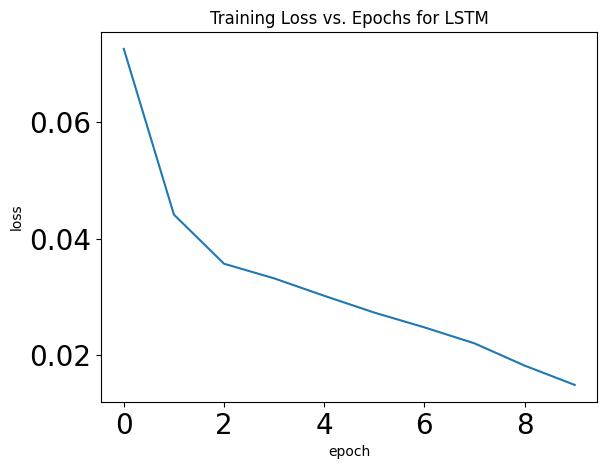

In [ ]:
if device == 'cuda':
   # Configure TensorFlow to use the GPU if available
   tf.config.set_visible_devices(tf.config.list_physical_devices('GPU'), 'GPU')
   # Model training will automatically use the GPU if configured and available
   print("GPU is available and configured for TensorFlow.")
else:
   print("GPU is not available. Training will use CPU.")
lstm_model.compile(optimizer="adam",loss=loss)
lstm_epochs = lstm_model.fit(X_train, y_train, epochs=epochs,
                             batch_size=batch_size)
plot_training_loss(lstm_epochs, "LSTM")

## Evaluate LSTM model using MAE, RMSE, R^2, MAPE, sMAPE.

In [ ]:
print("LSTM Predictions for Training Set")
lstm_pred_train = lstm_model.predict(X_train)
print("LSTM Predictions for Testing Set")
lstm_pred_test = lstm_model.predict(X_test)
lstm_mae = mean_absolute_error(y_test,lstm_pred_test)
print("MAE of LSTM model = ",lstm_mae)
lstm_rmse =  mean_squared_error(y_test,lstm_pred_test) ** 0.5
print("RMSE of LSTM model = ",lstm_rmse)
lstm_r2_score = r2_score(y_test, lstm_pred_test)
print("R^2 Score of LSTM model = ",lstm_r2_score)
lstm_mape_score = mean_absolute_percentage_error(y_test,lstm_pred_test)
print("MAPE Score of LSTM model = {0} %".format(lstm_mape_score))
lstm_smape_score = 100* symmetric_mean_absolute_percentage_error(y_test,
                                                                 lstm_pred_test)
print("sMAPE Score of LSTM model = {0} %".format(lstm_smape_score))

# Add new lines for param and memory
lstm_params_memory = get_ann_params_and_memory(lstm_model)
print(f"LSTM Model Parameter Count: {lstm_params_memory['param_count']}")
print(f"LSTM Model Memory Footprint: {lstm_params_memory['memory_mb']:.4f} MB")

LSTM Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step
LSTM Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
MAE of LSTM model =  0.0696496101948471
RMSE of LSTM model =  0.09151504465914127
R^2 Score of LSTM model =  0.7930011301530298
MAPE Score of LSTM model = 0.14198148702187385 %
sMAPE Score of LSTM model = 3059.50659720795 %
LSTM Model Parameter Count: 12705
LSTM Model Memory Footprint: 0.0485 MB


## Statistical Tests

In [ ]:
perform_statistical_tests(y_test, lstm_pred_test, "LSTM")


--- Statistical Tests for LSTM ---
Paired t-test: t-statistic = 0.6527, p-value = 0.5140
(Result is not statistically significant: no significant difference found)
Wilcoxon Signed-Rank Test: statistic =             628859.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


## Calculate 95% Confidence Intervals for LSTM MAE and RMSE

In [ ]:
lstm_mae_ci_lower, lstm_mae_ci_upper = calculate_bootstrap_ci(y_test, lstm_pred_test.flatten(), mean_absolute_error)
print(f"LSTM MAE 95% CI: [{lstm_mae_ci_lower:.4f}, {lstm_mae_ci_upper:.4f}]")

lstm_rmse_ci_lower, lstm_rmse_ci_upper = calculate_bootstrap_ci(y_test, lstm_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"LSTM RMSE 95% CI: [{lstm_rmse_ci_lower:.4f}, {lstm_rmse_ci_upper:.4f}]")

LSTM MAE 95% CI: [0.0672, 0.0725]
LSTM RMSE 95% CI: [0.0881, 0.0950]


## LSTM Ablation Study

In [ ]:
def run_ablation_study(model_builder_func, params, model_name, bytes_per_param=4):
    print(f"Running ablation for {model_name} with params: {params}")
    model = model_builder_func(**params)
    model.compile(optimizer='adam', loss=loss)
    # Suppress verbose output for fitting during ablation
    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    # Parameter count
    param_count = model.count_params()
    memory_bytes = param_count * bytes_per_param
    memory_kb = memory_bytes / 1024
    memory_mb = memory_bytes / (1024**2)

    # Inference time measurement
    # Warm-up run
    _ = model.predict(X_test[:1], verbose=0)
    start_time_inference = time.time()
    preds = model.predict(X_test, verbose=0)
    end_time_inference = time.time()
    inference_time = end_time_inference - start_time_inference

    mae = mean_absolute_error(y_test, preds)
    rmse = np.sqrt(mean_squared_error(y_test, preds))

    # FLOPs calculation: This is a placeholder as direct FLOPs counting in Keras
    # without external libraries (like `keras-flops` or `tfmot`) is complex.
    # For a rough estimation or comparison, one might assume FLOPs are proportional
    # to parameter count, or use a general heuristic.
    # A common heuristic is ~2 FLOPs per parameter for a Dense layer (multiply-add).
    # This is highly model-dependent.
    conceptual_flops_per_param = 2 # This is a very rough estimate
    estimated_flops = param_count * conceptual_flops_per_param # Very rough proxy for computational operations

    # Energy proxy (conceptual: time spent * conceptual FLOPs)
    energy_proxy = inference_time * estimated_flops

    # Spike sparsity (optional, only relevant for SNNs)
    # This would require modifying LIFNeuronV3 to return spike counts or a custom callback.
    spike_sparsity = None # Not applicable for LSTM directly without specific SNN conversion

    return mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, spike_sparsity

def build_lstm_model_for_ablation(activation='tanh', units=32):
    model = Sequential()
    model.add(LSTM(units, activation=activation, return_sequences=True,
                    input_shape=(X_train.shape[1], 1)))
    model.add(Dropout(0.5))
    model.add(LSTM(units, activation=activation, return_sequences=False))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    return model

print("Starting LSTM Ablation Studies...")

# Ablation 1: Activation
results_lstm_activation = {}
for act_name in ['tanh', 'relu']:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_lstm_model_for_ablation, {'activation': act_name, 'units': unit}, f'LSTM (Activation: {act_name})'
    )
    results_lstm_activation[act_name] = {'MAE': mae, 'RMSE': rmse, 'Params': param_count,
                                           'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb, 'Memory_MB': memory_mb,
                                           'Inference_Time': inference_time, 'Estimated_FLOPs': estimated_flops,
                                           'Energy_Proxy': energy_proxy}
print("LSTM Activation Ablation Results:", results_lstm_activation)

# Ablation 2: Units
results_lstm_units = {}
for u in [32, 64]:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_lstm_model_for_ablation, {'units': u, 'activation': activation}, f'LSTM (Units: {u})'
    )
    results_lstm_units[f'{u}_units'] = {'MAE': mae, 'RMSE': rmse, 'Params': param_count,
                                           'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb, 'Memory_MB': memory_mb,
                                           'Inference_Time': inference_time, 'Estimated_FLOPs': estimated_flops,
                                           'Energy_Proxy': energy_proxy}
print("LSTM Units Ablation Results:", results_lstm_units)

Starting LSTM Ablation Studies...
Running ablation for LSTM (Activation: tanh) with params: {'activation': 'tanh', 'units': 32}
Running ablation for LSTM (Activation: relu) with params: {'activation': 'relu', 'units': 32}
LSTM Activation Ablation Results: {'tanh': {'MAE': 0.0646509398996747, 'RMSE': np.float64(0.07974167009577285), 'Params': 12705, 'Memory_Bytes': 50820, 'Memory_KB': 49.62890625, 'Memory_MB': 0.048465728759765625, 'Inference_Time': 0.5781135559082031, 'Estimated_FLOPs': 25410, 'Energy_Proxy': 14689.865455627441}, 'relu': {'MAE': 0.08586363492400426, 'RMSE': np.float64(0.11933103081545574), 'Params': 12705, 'Memory_Bytes': 50820, 'Memory_KB': 49.62890625, 'Memory_MB': 0.048465728759765625, 'Inference_Time': 0.5337848663330078, 'Estimated_FLOPs': 25410, 'Energy_Proxy': 13563.473453521729}}
Running ablation for LSTM (Units: 32) with params: {'units': 32, 'activation': 'tanh'}
Running ablation for LSTM (Units: 64) with params: {'units': 64, 'activation': 'tanh'}
LSTM Units

In [ ]:
def run_ablation_study(model_builder_func, params, model_name, bytes_per_param=4):
    print(f"Running ablation for {model_name} with params: {params}")
    model = model_builder_func(**params)
    model.compile(optimizer='adam', loss=loss)
    # Suppress verbose output for fitting during ablation
    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    # Parameter count
    param_count = model.count_params()
    memory_bytes = param_count * bytes_per_param
    memory_kb = memory_bytes / 1024
    memory_mb = memory_bytes / (1024**2)

    # Inference time measurement
    # Warm-up run
    _ = model.predict(X_test[:1], verbose=0)
    start_time_inference = time.time()
    preds = model.predict(X_test, verbose=0)
    end_time_inference = time.time()
    inference_time = end_time_inference - start_time_inference

    mae = mean_absolute_error(y_test, preds)
    rmse = np.sqrt(mean_squared_error(y_test, preds))

    # FLOPs calculation: This is a placeholder as direct FLOPs counting in Keras
    # without external libraries (like `keras-flops` or `tfmot`) is complex.
    # For a rough estimation or comparison, one might assume FLOPs are proportional
    # to parameter count, or use a general heuristic.
    # A common heuristic is ~2 FLOPs per parameter for a Dense layer (multiply-add).
    # This is highly model-dependent.
    conceptual_flops_per_param = 2 # This is a very rough estimate
    estimated_flops = param_count * conceptual_flops_per_param # Very rough proxy for computational operations

    # Energy proxy (conceptual: time spent * conceptual FLOPs)
    energy_proxy = inference_time * estimated_flops

    # Spike sparsity (optional, only relevant for SNNs)
    # This would require modifying LIFNeuronV3 to return spike counts or a custom callback.
    spike_sparsity = None # Not applicable for LSTM directly without specific SNN conversion

    return mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, spike_sparsity

def build_lstm_model_for_ablation(activation='tanh', units=32):
    model = Sequential()
    model.add(LSTM(units, activation=activation, return_sequences=True,
                    input_shape=(X_train.shape[1], 1)))
    model.add(Dropout(0.5))
    model.add(LSTM(units, activation=activation, return_sequences=False))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    return model

print("Starting LSTM Ablation Studies...")

# Ablation 1: Activation
results_lstm_activation = {}
for act_name in ['tanh', 'relu']:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_lstm_model_for_ablation, {'activation': act_name, 'units': unit}, f'LSTM (Activation: {act_name})'
    )
    results_lstm_activation[act_name] = {'MAE': mae, 'RMSE': rmse, 'Params': param_count,
                                           'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb, 'Memory_MB': memory_mb,
                                           'Inference_Time': inference_time, 'Estimated_FLOPs': estimated_flops,
                                           'Energy_Proxy': energy_proxy}
print("LSTM Activation Ablation Results:", results_lstm_activation)

# Ablation 2: Units
results_lstm_units = {}
for u in [32, 64]:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_lstm_model_for_ablation, {'units': u, 'activation': activation}, f'LSTM (Units: {u})'
    )
    results_lstm_units[f'{u}_units'] = {'MAE': mae, 'RMSE': rmse, 'Params': param_count,
                                           'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb, 'Memory_MB': memory_mb,
                                           'Inference_Time': inference_time, 'Estimated_FLOPs': estimated_flops,
                                           'Energy_Proxy': energy_proxy}
print("LSTM Units Ablation Results:", results_lstm_units)

Starting LSTM Ablation Studies...
Running ablation for LSTM (Activation: tanh) with params: {'activation': 'tanh', 'units': 32}
Running ablation for LSTM (Activation: relu) with params: {'activation': 'relu', 'units': 32}
LSTM Activation Ablation Results: {'tanh': {'MAE': 0.057354016183921414, 'RMSE': np.float64(0.07471373530311334), 'Params': 12705, 'Memory_Bytes': 50820, 'Memory_KB': 49.62890625, 'Memory_MB': 0.048465728759765625, 'Inference_Time': 0.580176591873169, 'Estimated_FLOPs': 25410, 'Energy_Proxy': 14742.287199497223}, 'relu': {'MAE': 0.12373079719973556, 'RMSE': np.float64(0.14025077132153627), 'Params': 12705, 'Memory_Bytes': 50820, 'Memory_KB': 49.62890625, 'Memory_MB': 0.048465728759765625, 'Inference_Time': 0.5621607303619385, 'Estimated_FLOPs': 25410, 'Energy_Proxy': 14284.504158496857}}
Running ablation for LSTM (Units: 32) with params: {'units': 32, 'activation': 'tanh'}
Running ablation for LSTM (Units: 64) with params: {'units': 64, 'activation': 'tanh'}
LSTM Unit

## Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
lstm_predictions_inv_train = scaler.inverse_transform(lstm_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
lstm_predictions_inv_test = scaler.inverse_transform(lstm_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
lstm_predictions_inv_train = lstm_predictions_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
lstm_predictions_inv_test = lstm_predictions_inv_test.flatten()

## Show Actual and Predicted y values as Dataframes.

### With Training Dates.

In [ ]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_LSTM_train = pd.DataFrame({"Date":first_6169_index_dates,
                                   'Actual': y_train_inverse,
                                   'Predicted': lstm_predictions_inv_train})
results_LSTM_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,65.503960
1,2023-03-06 01:00:00,66.153566,66.138054
2,2023-03-06 02:00:00,66.090926,65.826942
3,2023-03-06 03:00:00,65.942371,65.187309
4,2023-03-06 04:00:00,66.077982,64.984108
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,63.455471
7032,2023-12-24 01:00:00,67.723487,64.049850
7033,2023-12-24 02:00:00,67.931737,65.343697
7034,2023-12-24 03:00:00,68.041604,65.965897


### With Testing Dates.


In [ ]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_LSTM_test = pd.DataFrame({"Date":last_6169_index_dates,
                             'Actual': y_test_inverse,
                             'Predicted': lstm_predictions_inv_test})
results_LSTM_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,66.165932
1,2023-12-25 02:00:00,67.699903,66.111427
2,2023-12-25 03:00:00,66.963961,65.718338
3,2023-12-25 04:00:00,67.132987,65.063324
4,2023-12-25 05:00:00,67.516792,64.694641
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,60.703270
1735,2024-03-06 08:00:00,53.606866,58.171612
1736,2024-03-06 09:00:00,56.729354,56.806221
1737,2024-03-06 10:00:00,60.111626,57.259583


## Plotting Predictions for PeMS Dataset Output made by LSTM Model.

### Only Test Data.


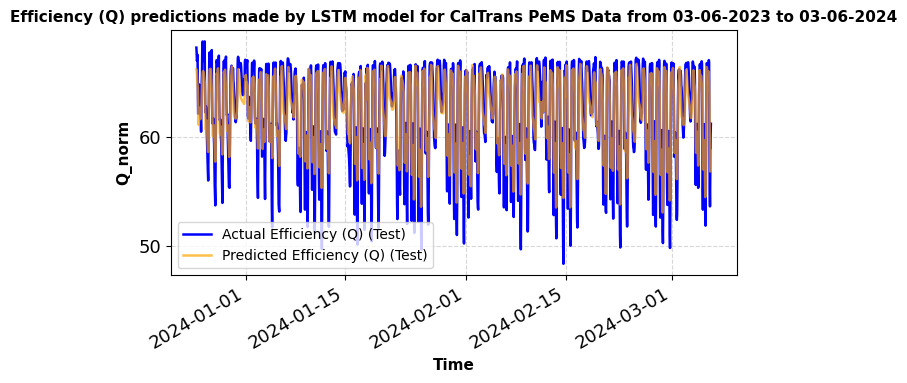

In [ ]:
# Create figure sized for IEEE 2-column layout
fig_LIF_SNN_test = plt.figure(figsize=(6.5, 3.5))  # 6.5in width fits one column in IEEE

# Plot test data
plt.plot(results_LSTM_test['Date'], results_LSTM_test['Actual'],
         color='blue', label=f'Actual {feature} (Test)', linewidth=1.8)
plt.plot(results_LSTM_test['Date'], results_LSTM_test['Predicted'],
         color='orange', label=f'Predicted {feature} (Test)', alpha=0.7,
         linewidth=1.8)

# Formatting
plt.title("{0} predictions made by LSTM model for {1}".
          format(feature, title_name), fontsize=11, fontweight='bold')
plt.xlabel('Time', fontsize=11,fontweight='bold')
plt.ylabel(feature_norm, fontsize=11,fontweight='bold')
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(fontsize=10, loc='best')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
fig_LIF_SNN_test.autofmt_xdate()    # Auto-fix overlapping date labels
# Export for Appendix
plt.show()


### Training and Testing Data combined.

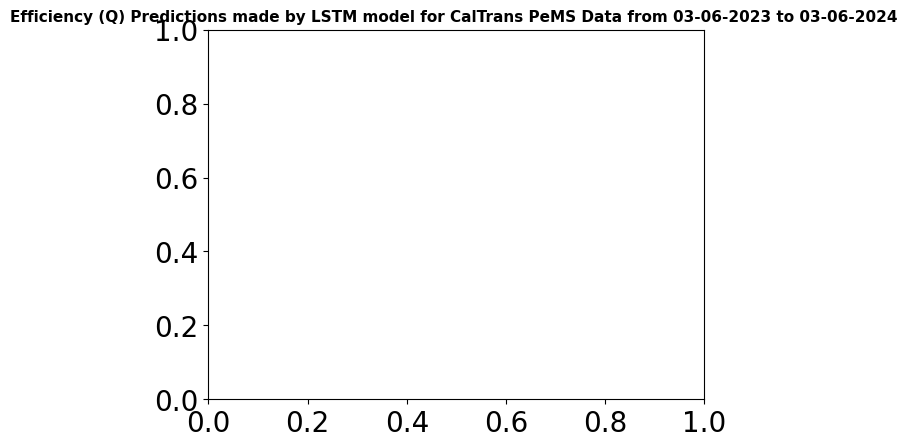

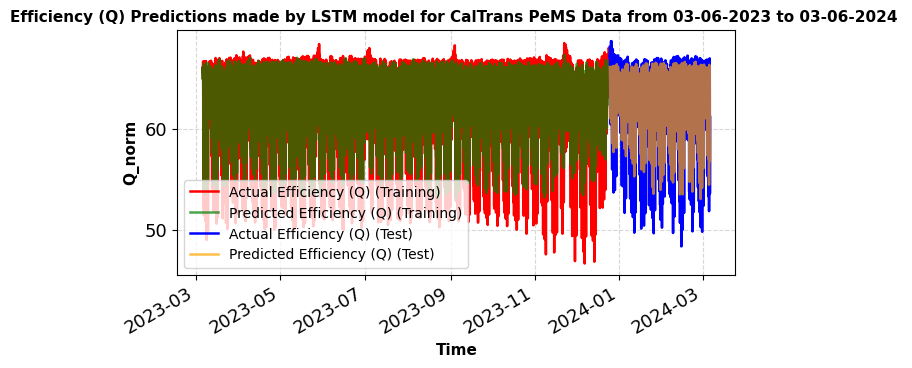

In [ ]:

plt.title("{0} Predictions made by LSTM model for {1} ".
          format(feature, title_name), fontsize=11,fontweight='bold')

# Create figure sized for IEEE 2-column layout
fig_LIF_SNN = plt.figure(figsize=(6.5, 3.5))  # 6.5in width fits one column in IEEE

# Plot training data
plt.plot(results_LSTM_train['Date'], results_LSTM_train['Actual'],
         color='red', label=f'Actual {feature} (Training)', linewidth=1.8)
plt.plot(results_LSTM_train['Date'], results_LSTM_train['Predicted'],
         color='green', label=f'Predicted {feature} (Training)', alpha=0.7,
         linewidth=1.8)

# Plot test data
plt.plot(results_LSTM_test['Date'], results_LSTM_test['Actual'],
         color='blue', label=f'Actual {feature} (Test)', linewidth=1.8)
plt.plot(results_LSTM_test['Date'], results_LSTM_test['Predicted'],
         color='orange', label=f'Predicted {feature} (Test)', alpha=0.7,
         linewidth=1.8)

# Formatting
plt.title("{0} Predictions made by LSTM model for {1} ".
          format(feature, title_name), fontsize=11, fontweight='bold')
plt.xlabel('Time', fontsize=11,fontweight='bold')
plt.ylabel(feature_norm, fontsize=11,fontweight='bold')
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(fontsize=10, loc='best')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
fig_LIF_SNN.autofmt_xdate()    # Auto-fix overlapping date labels
plt.show() # Export for Appendix


## Combine Actual and Predicted Results for Train and Test Cases for LSTM.

In [ ]:
results_LSTM = [results_LSTM_train, results_LSTM_test]
results_LSTM = pd.concat(results_LSTM)
display(results_LSTM)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,65.503960
1,2023-03-06 01:00:00,66.153566,66.138054
2,2023-03-06 02:00:00,66.090926,65.826942
3,2023-03-06 03:00:00,65.942371,65.187309
4,2023-03-06 04:00:00,66.077982,64.984108
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,60.703270
1735,2024-03-06 08:00:00,53.606866,58.171612
1736,2024-03-06 09:00:00,56.729354,56.806221
1737,2024-03-06 10:00:00,60.111626,57.259583


## Plotting Residuals for Actual and Predicted Results for LSTM.

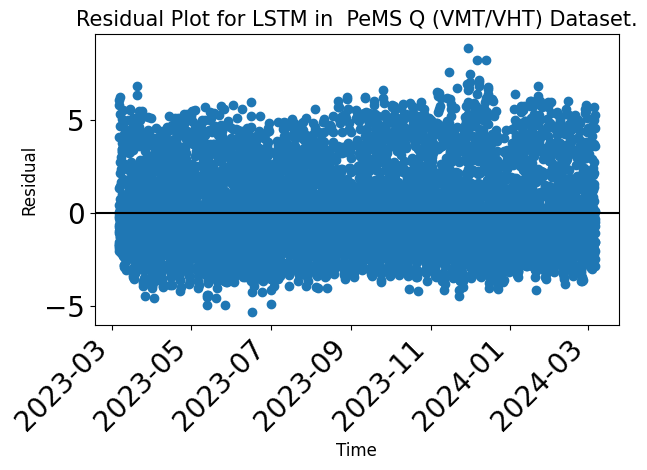

In [ ]:
actual_arr_LSTM = np.array(results_LSTM['Actual'])
predicted_arr_LSTM = np.array(results_LSTM['Predicted'])
residuals_LSTM = predicted_arr_LSTM - actual_arr_LSTM
plt.scatter(results_LSTM['Date'], residuals_LSTM)
plt.axhline(y=0, color = 'black')
plt.title("Residual Plot for LSTM in  PeMS {} Dataset.".format(feature_field),
          fontsize = 15)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=5)
plt.locator_params(axis='y', nbins=5)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

From the residual plots for the LSTM model, it can be concluded that the LSTM model is a good fit.

## Energy Consumption

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()
execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")
lstm_energy_results = measure_ann_energy(lstm_model, X_test, 'LSTM Model')

Model execution time: 5.054473876953125e-05 seconds
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2986 seconds
  Estimated CPU Energy: 23.8894 Joules (23889427.1851 µJ)

No GPU available. GPU measurements skipped.


# Δt-Scaled LIF SNN

## Create New SNN and LIF Class

### Spiking Activation Layer

In [ ]:
@keras.saving.register_keras_serializable()
class SpikingActivationCell2(tf.keras.layers.Layer):
    def __init__(self, units, threshold=1.0, dt=1.0, spiking_aware_training=False, **kwargs):
        super().__init__(**kwargs)
        self.units = units
        self.threshold = threshold
        self.dt = dt
        self.spiking_aware_training = spiking_aware_training
        self.state_size = units

    def get_initial_state(self, inputs=None, batch_size=None, dtype=None):
        return [tf.zeros((batch_size, self.units), dtype=dtype or tf.float32)]

    def call(self, inputs, states, training=None):
        prev_v = states[0]

        # Always use tanh for stability
        I = tf.math.tanh(inputs)

        # Membrane update
        v = prev_v + self.dt * I

        # Surrogate gradient spike
        if training and self.spiking_aware_training:
            @tf.custom_gradient
            def spike_fn(x):
                spike = tf.where(x >= self.threshold, 1.0, 0.0)
                def grad(dy):
                    # finite window surrogate
                    return dy * tf.where(tf.abs(x - self.threshold) < 0.5, 1.0, 0.0)
                return spike, grad
            spikes = spike_fn(v)
        else:
            spikes = tf.cast(v >= self.threshold, tf.float32)

        # Reset
        v = tf.where(spikes > 0, v - self.threshold, v)

        return spikes, [v]

@keras.saving.register_keras_serializable()
class SpikingActivationLayer2(tf.keras.layers.RNN):
    def __init__(self, units, activation='tanh', threshold=1.0, dt=1.0,
                 spiking_aware_training=False, **kwargs):
        cell = SpikingActivationCell2(units=units, threshold=threshold, dt=dt,
                                     spiking_aware_training=spiking_aware_training)
        super(SpikingActivationLayer2, self).__init__(cell, **kwargs)
        self.return_sequences = kwargs.get('return_sequences', False)
        self.units = units # Keep units attribute on the layer as well

    def call(self, inputs, initial_state=None, training=None, **kwargs):
        return super(SpikingActivationLayer2, self).call(
            inputs, initial_state=initial_state, training=training, **kwargs
        )

    def compute_output_shape(self, input_shape):
        # input_shape will be (batch_size, timesteps, features_from_prev_layer)
        if self.return_sequences:
            # If return_sequences is True, the output shape includes the time dimension
            # The last dimension will be self.units
            return (input_shape[0], input_shape[1], self.units)
        else:
            # If return_sequences is False, the output shape is (batch_size, self.units)
            return (input_shape[0], self.units)

    def build(self, input_shape):
        super(SpikingActivationLayer2, self).build(input_shape)

### Create Model

In [ ]:
spiking_LIFv3_model = tf.keras.Sequential(
    [
        # Add temporal dimension to model. For this dataset, the input_shape is
        # passed into the model.
        tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                input_shape=(None, X_train.shape[1])),
        # Keras' TimeDistributed wrapper allows Dense layer to operate on
        # temporal data.
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(128)),
        #tf.keras.layers.Dense(64, activation='tanh'),
        #LIFNeuronV3(threshold=1.25, leak_rate=0.06, refractory_period=5),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        LIFNeuronV3(threshold=0.5, leak_rate=0.01, refractory_period=275),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Reshape((-1, 128)),  # Reshape to (batch_size, time_steps, features)

        #tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(64)),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        #LIFNeuronV3(threshold=0.5, leak_rate=0.01, refractory_period=5),


        #tf.keras.layers.Dropout(0.01),  # Added dropout
        # Use tf.keras.layers.Permute to swap the time_steps and num_neurons dimensions
        #tf.keras.layers.Permute((2, 1)),  # Now shape is (batch_size, num_neurons, time_steps)
        #tf.keras.layers.Reshape((-1, 64)),  # Reshape to (batch_size, time_steps, num_neurons)
        # GlobalAveragePooling1D: Averages spiking output over time. Used for
        # determining the spiking rate of neuron.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        #SpikingActivation(activation=tf.keras.activations.tanh, dt = 100,
        #                  spiking_aware_training=True),
        tf.keras.layers.GlobalAveragePooling1D(),
        #tf.keras.layers.GlobalAveragePooling1D(data_format='channels_last'),
        #tf.keras.layers.Dense(future),
        #tf.keras.layers.Flatten(),  # Add Flatten layer
        #tf.keras.layers.Reshape((batch_size, 1)),  # Reshape to (batch_size, 1)
        #tf.keras.layers.Lambda(lambda x: x[:, -1]),
        tf.keras.layers.Dense(1),
        #tf.keras.layers.Dense(1, input_shape=(X_train.shape[1] * 64, )),

    ]

)

spiking_LIFv3_model.summary()

Instructions for updating:
Use fn_output_signature instead


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape (Reshape)               │ (None, None, 20)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, None, 128)      │         2,688 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lif_neuron_v3 (LIFNeuronV3)     │ (None, None, 1, 128)   │           129 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, None, 1, 128)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, None, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,946 (11.51 KB)

 Trainable params: 2,817 (11.00 KB)

 Non-trainable params: 129 (516.00 B)

## Training Δt-Scaled LIF SNN Model.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.5474
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.1008
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0649
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0471
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0396
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0339
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0312
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0298
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0287
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0276


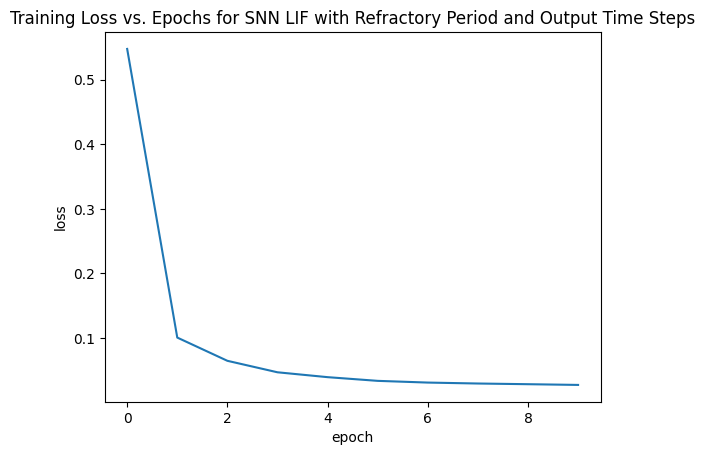

In [ ]:
# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
spiking_LIFv3_model.compile(optimizer='adam', loss=loss)
spiking_LIFv3_model.compile(optimizer=optimizer, loss=loss)
spiking_LIFv3_model_epochs = spiking_LIFv3_model.fit(X_train,y_train,epochs=epochs,
                                                 batch_size=batch_size)
plot_training_loss(spiking_LIFv3_model_epochs, "SNN LIF with Refractory Period and Output Time Steps")

## Evaluating Δt-Scaled LIF SNN Model using MAE, RMSE, R2, MAPE, and sMAPE.

In [ ]:
print("SNN v3 Predictions for Training Set")
spiking_LIFv3_model_pred_train = spiking_LIFv3_model.predict(X_train)
print("SNN v3 Predictions for Training Set")
spiking_LIFv3_model_pred_test = spiking_LIFv3_model.predict(X_test)
print(spiking_LIFv3_model_pred_test.shape)

# Reshape the model predictions if necessary
#spiking_LIFv3_model_pred_test = spiking_LIFv3_model_pred_test.reshape(y_test.shape)

spiking_LIFv3_model_mae = mean_absolute_error(y_test, spiking_LIFv3_model_pred_test)
print("MAE of SNN v3model = ",spiking_LIFv3_model_mae)
spiking_LIFv3_model_rmse =  mean_squared_error(y_test, spiking_LIFv3_model_pred_test) ** 0.5
print("RMSE of SNN v3  model = ", spiking_LIFv3_model_rmse)
spiking_LIFv3_model_r2_score = r2_score(y_test, spiking_LIFv3_model_pred_test)
print("R2 Score of SNN v3 model = ", spiking_LIFv3_model_r2_score)
spiking_LIFv3_model_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                                    spiking_LIFv3_model_pred_test)
print("MAPE Score of SNN v3 model = {0} %".format(spiking_LIFv3_model_mape_score))
spiking_LIFv3_model_smape_score = 100*symmetric_mean_absolute_percentage_error(y_test,
                                                                 spiking_LIFv3_model_pred_test)
print("sMAPE Score of SNN v3 model = {0} %".format(spiking_LIFv3_model_smape_score))

# Add new lines for param and memory
snn_params_memory = get_ann_params_and_memory(spiking_LIFv3_model)
print(f"Δt-Scaled LIF SNN Model Parameter Count: {snn_params_memory['param_count']}")
print(f"Δt-Scaled LIF SNN Model Memory Footprint: {snn_params_memory['memory_mb']:.4f} MB")

SNN v3 Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
SNN v3 Predictions for Training Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
(1739, 1)
MAE of SNN v3model =  0.10646629971868564
RMSE of SNN v3  model =  0.1364930233987273
R2 Score of SNN v3 model =  0.539527297302804
MAPE Score of SNN v3 model = 20.233312544965457 %
sMAPE Score of SNN v3 model = 3053.663358011643 %
Δt-Scaled LIF SNN Model Parameter Count: 2946
Δt-Scaled LIF SNN Model Memory Footprint: 0.0112 MB


## Statistical Tests

In [ ]:
perform_statistical_tests(y_test, spiking_LIFv3_model_pred_test, "Δt-Scaled LIF SNN")


--- Statistical Tests for Δt-Scaled LIF SNN ---
Paired t-test: t-statistic = 4.2133, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             602576.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


## Calculate 95% Confidence Intervals for Δt-Scaled LIF SNN MAE and RMSE

In [ ]:
lifsnnv3_mae_ci_lower, lifsnnv3_mae_ci_upper = calculate_bootstrap_ci(y_test, spiking_LIFv3_model_pred_test.flatten(), mean_absolute_error)
print(f"Δt-Scaled LIF SNN MAE 95% CI: [{lifsnnv3_mae_ci_lower:.4f}, {lifsnnv3_mae_ci_upper:.4f}]")

lifsnnv3_rmse_ci_lower, lifsnnv3_rmse_ci_upper = calculate_bootstrap_ci(y_test, spiking_LIFv3_model_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"Δt-Scaled LIF SNN RMSE 95% CI: [{lifsnnv3_rmse_ci_lower:.4f}, {lifsnnv3_rmse_ci_upper:.4f}]")

Δt-Scaled LIF SNN MAE 95% CI: [0.1021, 0.1104]
Δt-Scaled LIF SNN RMSE 95% CI: [0.1319, 0.1414]


## Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
spiking_LIFv3_model_inv_train = scaler.inverse_transform(spiking_LIFv3_model_pred_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
spiking_LIFv3_model_inv_test = scaler.inverse_transform(spiking_LIFv3_model_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
spiking_LIFv3_model_inv_train = spiking_LIFv3_model_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
spiking_LIFv3_model_inv_test = spiking_LIFv3_model_inv_test.flatten()

## Show Actual and Predicted y values as Dataframes.

### With Training Dates.

In [ ]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_SNN_LIFv3_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': spiking_LIFv3_model_inv_train})
results_SNN_LIFv3_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,63.539963
1,2023-03-06 01:00:00,66.153566,67.399689
2,2023-03-06 02:00:00,66.090926,62.970806
3,2023-03-06 03:00:00,65.942371,61.826565
4,2023-03-06 04:00:00,66.077982,61.720329
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,63.533886
7032,2023-12-24 01:00:00,67.723487,62.568829
7033,2023-12-24 02:00:00,67.931737,65.522758
7034,2023-12-24 03:00:00,68.041604,65.530525


### With Testing Dates.

In [ ]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_SNN_LIFv3_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': spiking_LIFv3_model_inv_test})
results_SNN_LIFv3_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,66.229019
1,2023-12-25 02:00:00,67.699903,65.691360
2,2023-12-25 03:00:00,66.963961,65.691360
3,2023-12-25 04:00:00,67.132987,65.691360
4,2023-12-25 05:00:00,67.516792,65.691360
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,62.218613
1735,2024-03-06 08:00:00,53.606866,59.716034
1736,2024-03-06 09:00:00,56.729354,54.866356
1737,2024-03-06 10:00:00,60.111626,60.360851


## Plotting Predictions for PeMS Dataset Output made by Δt-Scaled LIF SNN Model.

### Only Testing Data.

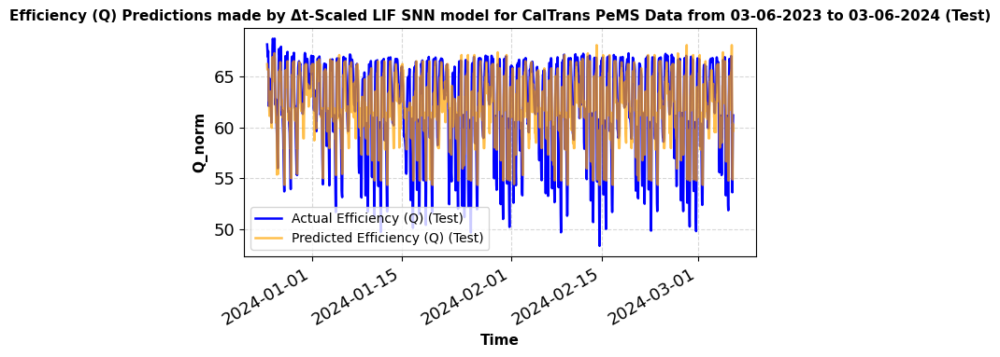

In [ ]:
# Create figure sized for IEEE 2-column layout
fig_LIF_SNN_test = plt.figure(figsize=(6.5, 3.5))  # 6.5in width fits one column in IEEE

# Plot test data
plt.plot(results_SNN_LIFv3_test['Date'], results_SNN_LIFv3_test['Actual'],
         color='blue', label=f'Actual {feature} (Test)', linewidth=1.8)
plt.plot(results_SNN_LIFv3_test['Date'], results_SNN_LIFv3_test['Predicted'],
         color='orange', label=f'Predicted {feature} (Test)', alpha=0.7,
         linewidth=1.8)

# Formatting
plt.title("{0} Predictions made by Δt-Scaled LIF SNN model for {1} (Test)".
          format(feature, title_name), fontsize = 11, fontweight= 'bold')
plt.xlabel('Time', fontsize=11,fontweight='bold')
plt.ylabel(feature_norm, fontsize=11,fontweight='bold')
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(fontsize=10, loc='best')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
fig_LIF_SNN_test.autofmt_xdate()    # Auto-fix overlapping date labels
# Export for Appendix
plt.show()

### Training and Testing Data combined.

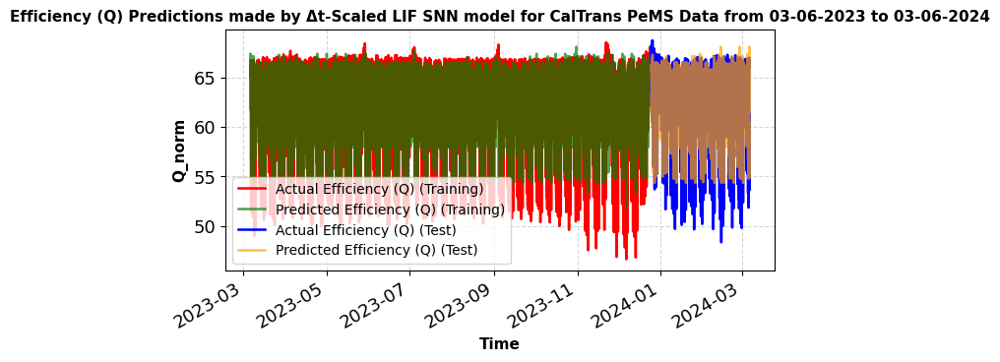

In [ ]:
# Create figure sized for IEEE 2-column layout
fig_LIF_SNN = plt.figure(figsize=(6.5, 3.5))  # 6.5in width fits one column in IEEE

# Plot training data
plt.plot(results_SNN_LIFv3_train['Date'], results_SNN_LIFv3_train['Actual'],
         color='red', label=f'Actual {feature} (Training)', linewidth=1.8)
plt.plot(results_SNN_LIFv3_train['Date'], results_SNN_LIFv3_train['Predicted'],
         color='green', label=f'Predicted {feature} (Training)', alpha=0.7,
         linewidth=1.8)

# Plot test data
plt.plot(results_SNN_LIFv3_test['Date'], results_SNN_LIFv3_test['Actual'],
         color='blue', label=f'Actual {feature} (Test)', linewidth=1.8)
plt.plot(results_SNN_LIFv3_test['Date'], results_SNN_LIFv3_test['Predicted'],
         color='orange', label=f'Predicted {feature} (Test)', alpha=0.7,
         linewidth=1.8)

# Formatting
plt.title("{0} Predictions made by Δt-Scaled LIF SNN model for {1}".
          format(feature, title_name), fontsize = 11, fontweight='bold')
plt.xlabel('Time', fontsize=11,fontweight='bold')
plt.ylabel(feature_norm, fontsize=11,fontweight='bold')
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(fontsize=10, loc='best')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
fig_LIF_SNN.autofmt_xdate()    # Auto-fix overlapping date labels
plt.show() # Export for Appendix

## Combine Actual and Predicted Results for Train and Test Cases for Δt-Scaled LIF SNN Model.

In [ ]:
results_SNN_LIFv3 = [results_SNN_LIFv3_train, results_SNN_LIFv3_test]
results_SNN_LIFv3 = pd.concat(results_SNN_LIFv3)
display(results_SNN_LIFv3)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,63.539963
1,2023-03-06 01:00:00,66.153566,67.399689
2,2023-03-06 02:00:00,66.090926,62.970806
3,2023-03-06 03:00:00,65.942371,61.826565
4,2023-03-06 04:00:00,66.077982,61.720329
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,62.218613
1735,2024-03-06 08:00:00,53.606866,59.716034
1736,2024-03-06 09:00:00,56.729354,54.866356
1737,2024-03-06 10:00:00,60.111626,60.360851


## Plot Output Spikes
Code taken from https://pythontic.com/visualization/charts/spikerasterplot#:~:text=A%20Spike%20raster%20plot%20is%20a%20plot%20used,potential%20from%20a%20neuron%20at%20a%20specified%20position.

In [ ]:
def check_output(seq_model, X_train, X_test, y_train, y_test, modify_dt=0.1):
    """
    This code is used to show the plot of the output spikes for the
    SpikingActivation Layer.
    """

    # Repeat the outputs for n_steps.
    n_steps = 10
    train_sequences = np.tile(X_train[:, None], (1, n_steps, 1, 1))
    test_sequences = np.tile(X_test[:, None], (1, n_steps, 1, 1))

    # Rebuild the model with the functional API to access the output of
    # intermediate layers.
    # Corrected line: Use seq_model.input_shape instead of seq_model.layers[0].input_shape
    inp = x = tf.keras.Input(batch_shape=seq_model.input_shape)
    has_global_average_pooling = False
    # Obtain list of layers to create a spike matrix.
    spikes_dict = {}
    layer_names = []

    # Initialize spike_layer to None
    spike_layer = None

    print("length of seq_model.layers: ", len(seq_model.layers))
    for layer in seq_model.layers:
        print("layer type: ", type(layer))
        print("layer name: ", layer.name)
        if "_1" in layer.name:
          layer_new_name = str(layer.name).replace("_1", "")
          print("layer new name: ", layer_new_name)
          layer_names.append(layer_new_name)
        else:
          layer_names.append(str(layer.name))
        if isinstance(layer, tf.keras.layers.GlobalAveragePooling1D):
            # Remove the pooling so that we can see the model's output over
            # time.
            has_global_average_pooling = True
            continue

        if isinstance(layer, (keras_spiking.SpikingActivation,
                              keras_spiking.Lowpass, SpikingActivationLayer)):

            cfg = layer.get_config()
            # Update dt, if specified
            if modify_dt is not None:
                cfg["dt"] = modify_dt
            # Return the full time series for visualization
            cfg["return_sequences"] = True

            layer = type(layer)(**cfg)

        if isinstance(layer, (keras_spiking.SpikingActivation, SpikingActivationLayer)):
            # save this layer so we can access it later
            spike_layer = layer

        x = layer(x)

    # Initialize spikes_dict with layer names as keys
    for layer_name in layer_names:
        spikes_dict[layer_name] = np.array([]) # Initialize as empty array

    layer_names.append("Output")
    spikes_dict["Output"] = np.array([])

    # Check if a spiking layer was found before proceeding
    if spike_layer is None:
        print("Error: No SpikingActivation or compatible layer found in the model for spike plotting.")
        return

    # Take a look at Spiking Activation Layer.
    func_model = tf.keras.Model(inp, [x, spike_layer.output])

    # Copy weights to new model
    func_model.set_weights(seq_model.get_weights())

    # Run model
    output, spikes = func_model.predict(test_sequences)
    spikes = np.transpose(spikes, (0, 2, 1))
    print("spikes.shape: ", spikes.shape)

    # Iterate through layer list
    for i in range(spikes.shape[0]):
      for j in range(len(layer_names)):
        # Append spike data for each layer, handling potential empty arrays
        if spikes_dict[layer_names[j]].size == 0:
            spikes_dict[layer_names[j]] = spikes[i][j]
        else:
            spikes_dict[layer_names[j]] = np.concatenate((spikes_dict[layer_names[j]],
                                                    spikes[i][j]), axis = 0)

    print("spikes_dict: ", spikes_dict)

    if has_global_average_pooling:
        # Check test accuracy using average output over all timesteps
        predictions = np.argmax(output.mean(axis=1), axis=-1)
    else:
        # Check test accuracy using output from only the last timestep
        predictions = np.argmax(output[:, -1], axis=-1)

    #print("spike_layer.dt: ", spike_layer.dt)
    # Evaluate Test Data
    seq_model_mae = mean_absolute_error(y_test, spiking_LIFv3_model)
    print("MAE of seq_model = ", seq_model_mae)
    seq_model_rmse = mean_absolute_error(y_test, spiking_LIFv3_model)**0.5
    print("RMSE of seq_model = ", seq_model_rmse)
    seq_model_mape = 100*mean_absolute_percentage_error(y_test, spiking_LIFv3_model)
    print("MAPE of seq_model = ", seq_model_mape)

    # Start Output Spike Plot.
    num_neurons = 10
    # Use spike_layer.name to dynamically get the correct key
    print("spikes for spiking_activation: ", spikes_dict[spike_layer.name])
    spikes_matrix = spikes_dict[spike_layer.name]*20*modify_dt
    print("spikes_matrix.shape: ", spikes_matrix.shape)
    spikes_matrix = spikes_matrix.reshape(spikes.shape[0], n_steps)
    print("spikes_matrix.shape: ", spikes_matrix.shape)
    neurons = np.random.choice(spikes_matrix.shape[1], num_neurons, replace=True)
    print("neurons: ", neurons)
    print("neurons.shape: ", neurons.shape)

    fig, ax = plt.subplots(figsize=(14, 12), facecolor="#00FFFF")
    color = cm.get_cmap('tab10')(0)
    timesteps = np.arange(n_steps)
    print("timesteps shape: ", timesteps.shape)
    print("timesteps: {0}".format(timesteps))
    for i in range(num_neurons):
      print("i: ", i)
      indices = np.where(spikes_matrix[:, i] != 0)
      list_of_indices = [list(row) for row in zip(*indices)]
      print("list of indices: ", list_of_indices)
      flat_list = []
      for row in list_of_indices:
          flat_list.extend(row)
      print("flat_list: ", flat_list)
      #print("spike matrix where shape: ", len(np.where(spikes_matrix[:, i] != 0)))
      #output_spikes_list = list((np.where(spikes_matrix[:, i] != 0)))
      #print("output_spikes_list: ", output_spikes_list)
      #print(timesteps[np.where(spikes_matrix[:, i] != 0)])
      for t in flat_list:
        #if (t < n_steps):
        ax.plot([t, t], [i+0.5, i+1.5], color=color)
          #ax.eventplot([t,], [i + 0.5, i + 0.5])
        #ax.eventplot([t, t], lineoffsets=[i+0.5, i+1.5], linelengths=1, colors=color)

    ax.set_ylim(0.5, num_neurons+0.5)
    #ax.set_yticks(list(range(1, num_neurons+1, int(np.ceil(num_neurons/50)))))
    ax.set_yticks(list(range(1, num_neurons + 1)))  # Adjust y-axis ticks
    #ax.set_xticks(list(range(1, n_steps+1, 10)))
    ax.set_ylabel("Neuron Index", fontsize = 15)
    ax.set_xlabel("Time in $ms$", fontsize = 15)
    ax.set_title("Dense Spiking Activation Layer Spikes Plot", fontsize = 15)

In [ ]:
check_output(spiking_LIFv3_model, X_train, X_test, y_train, y_test)

length of seq_model.layers:  7
layer type:  <class 'keras.src.layers.reshaping.reshape.Reshape'>
layer name:  reshape
layer type:  <class 'keras.src.layers.rnn.time_distributed.TimeDistributed'>
layer name:  time_distributed
layer type:  <class '__main__.LIFNeuronV3'>
layer name:  lif_neuron_v3
layer type:  <class 'keras.src.layers.regularization.dropout.Dropout'>
layer name:  dropout_18
layer new name:  dropout8
layer type:  <class 'keras.src.layers.reshaping.reshape.Reshape'>
layer name:  reshape_1
layer new name:  reshape
layer type:  <class 'keras.src.layers.pooling.global_average_pooling1d.GlobalAveragePooling1D'>
layer name:  global_average_pooling1d
layer type:  <class 'keras.src.layers.core.dense.Dense'>
layer name:  dense_10
layer new name:  dense0
Error: No SpikingActivation or compatible layer found in the model for spike plotting.


## Energy Consumption

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()
execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")
spiking_LIFv3_energy_results = measure_snn_energy(spiking_LIFv3_model, X_test,
                                                  model_name_str='Δt-Scaled LIF SNN Model')
print(f"spiking_LIFv3_energy_results: {spiking_LIFv3_energy_results}" )

Model execution time: 6.079673767089844e-05 seconds
Measuring inference time and estimating energy on CPU (for SNN)...
CPU Inference Time: 0.6976 seconds
Estimated CPU Energy: 55.8045 Joules (55804462.4329 µJ)

No GPU available. GPU measurements skipped.
Estimated total spikes: 20005
Estimated SNN Spike Density: 0.0899
Estimated SNN Spike Sparsity: 0.9101
Estimated SNN Spike Energy: 20.0050 µJ
spiking_LIFv3_energy_results: {'model_name': 'Δt-Scaled LIF SNN Model', 'cpu_inference_time_s': 0.6975557804107666, 'estimated_cpu_energy_J': 55.80446243286133, 'estimated_cpu_energy_uJ': 55804462.43286133, 'gpu_inference_time_s': None, 'estimated_gpu_energy_J': None, 'estimated_gpu_energy_uJ': None, 'snn_spike_energy_uJ': 20.005, 'snn_spike_sparsity': np.float64(0.9101270485911443), 'snn_spike_density': np.float64(0.08987295140885566)}


In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()
execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")
spiking_LIFv3_energy_results = measure_snn_energy(spiking_LIFv3_model, X_test,
                                                  model_name_str='\u0394t-Scaled LIF SNN Model')
print(f"spiking_LIFv3_energy_results: {spiking_LIFv3_energy_results}" )

Model execution time: 6.723403930664062e-05 seconds
Measuring inference time and estimating energy on CPU (for SNN)...
CPU Inference Time: 0.4543 seconds
Estimated CPU Energy: 36.3424 Joules (36342411.0413 µJ)

No GPU available. GPU measurements skipped.
Estimated total spikes: 20005
Estimated SNN Spike Density: 0.0899
Estimated SNN Spike Sparsity: 0.9101
Estimated SNN Spike Energy: 20.0050 µJ
spiking_LIFv3_energy_results: {'model_name': 'Δt-Scaled LIF SNN Model', 'cpu_inference_time_s': 0.45428013801574707, 'estimated_cpu_energy_J': 36.342411041259766, 'estimated_cpu_energy_uJ': 36342411.041259766, 'gpu_inference_time_s': None, 'estimated_gpu_energy_J': None, 'estimated_gpu_energy_uJ': None, 'snn_spike_energy_uJ': 20.005, 'snn_spike_sparsity': np.float64(0.9101270485911443), 'snn_spike_density': np.float64(0.08987295140885566)}


## Δt-Scaled LIF SNN Ablation Study

In [ ]:
def build_lif_snn_v3_model_for_ablation(threshold=0.5, leak_rate=0.01,
                                        refractory_period=275, units=128,
                                        activation='tanh'):
    model = tf.keras.Sequential(
        [
            tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                    input_shape=(None, X_train.shape[1])),
            tf.keras.layers.TimeDistributed(tf.keras.layers.
                                            Dense(units, activation=activation)),
            LIFNeuronV3(threshold=threshold, leak_rate=leak_rate,
                        refractory_period=refractory_period),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Reshape((-1, units)),
            tf.keras.layers.GlobalAveragePooling1D(),
            tf.keras.layers.Dense(1),
        ]
    )
    return model

print("Starting Δt-Scaled LIF SNN Ablation Studies...")

# Ablation 1: Threshold
results_lif_snn_v3_threshold = {}
for th in [0.5, 1.0]:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_lif_snn_v3_model_for_ablation,
        {'threshold': th, 'leak_rate': 0.01, 'refractory_period': 275,
         'units': 128, 'activation': 'tanh'},
        f'Δt-Scaled LIF SNN (Threshold: {th})'
    )
    # Note: Spike sparsity is not directly calculable with the current LIFNeuronV3 implementation.
    # It would require modifying LIFNeuronV3 to return spike counts or using a custom callback.
    results_lif_snn_v3_threshold[f'threshold_{th}'] = {'MAE': mae, 'RMSE': rmse, 'Params': param_count,
                                                        'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb, 'Memory_MB': memory_mb,
                                                        'Inference_Time': inference_time, 'Estimated_FLOPs': estimated_flops,
                                                        'Energy_Proxy': energy_proxy, 'Spike_Sparsity': None}
print("Δt-Scaled LIF SNN Threshold Ablation Results:", results_lif_snn_v3_threshold)

# Ablation 2: Leak Rate
results_lif_snn_v3_leak_rate = {}
for lr in [0.01, 0.05]:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_lif_snn_v3_model_for_ablation,
        {'threshold': 0.5, 'leak_rate': lr, 'refractory_period': 275, 'units': 128, 'activation': 'tanh'},
        f'Δt-Scaled LIF SNN (Leak Rate: {lr})'
    )
    results_lif_snn_v3_leak_rate[f'leak_rate_{lr}'] = {'MAE': mae, 'RMSE': rmse, 'Params': param_count,
                                                       'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb, 'Memory_MB': memory_mb,
                                                       'Inference_Time': inference_time, 'Estimated_FLOPs': estimated_flops,
                                                       'Energy_Proxy': energy_proxy, 'Spike_Sparsity': None}
print("Δt-Scaled LIF SNN Leak Rate Ablation Results:", results_lif_snn_v3_leak_rate)

# Ablation 3: Refractory Period
results_lif_snn_v3_refractory_period = {}
for rp in [100, 275]:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_lif_snn_v3_model_for_ablation,
        {'threshold': 0.5, 'leak_rate': 0.01, 'refractory_period': rp, 'units': 128, 'activation': 'tanh'},
        f'Δt-Scaled LIF SNN (Refractory Period: {rp})'
    )
    results_lif_snn_v3_refractory_period[f'refractory_{rp}'] = {
        'MAE': mae, 'RMSE': rmse, 'Params': param_count,
        'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb,
        'Memory_MB': memory_mb,'Inference_Time': inference_time,
        'Estimated_FLOPs': estimated_flops,
      'Energy_Proxy': energy_proxy, 'Spike_Sparsity': None}

print("Δt-Scaled LIF SNN Refractory Period Ablation Results:",
      results_lif_snn_v3_refractory_period)

# Ablation 4: Units in TimeDistributed Dense layer
results_lif_snn_v3_units = {}
for u in [64, 128]:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_lif_snn_v3_model_for_ablation,
        {'threshold': 0.5, 'leak_rate': 0.01, 'refractory_period': 275,
         'units': u, 'activation': 'tanh'}, f'Δt-Scaled LIF SNN (Units: {u})'
    )
    results_lif_snn_v3_units[f'{u}_units'] = {
        'MAE': mae, 'RMSE': rmse, 'Params': param_count,
        'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb,
        'Memory_MB': memory_mb, 'Inference_Time': inference_time,
        'Estimated_FLOPs': estimated_flops, 'Energy_Proxy': energy_proxy,
        'Spike_Sparsity': None}

print("Δt-Scaled LIF SNN Units Ablation Results:", results_lif_snn_v3_units)

# Ablation 5: Activation of TimeDistributed Dense layer
results_lif_snn_v3_activation = {}
for act_name in ['tanh', 'relu']:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_lif_snn_v3_model_for_ablation,
        {'threshold': 0.5, 'leak_rate': 0.01, 'refractory_period': 275, 'units': 128, 'activation': act_name},
        f'Δt-Scaled LIF SNN (Activation: {act_name})'
    )
    results_lif_snn_v3_activation[act_name] = {
        'MAE': mae, 'RMSE': rmse, 'Params': param_count,
        'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb, 'Memory_MB': memory_mb,
        'Inference_Time': inference_time, 'Estimated_FLOPs': estimated_flops,
        'Energy_Proxy': energy_proxy, 'Spike_Sparsity': None}
print("Δt-Scaled LIF SNN Activation Ablation Results:", results_lif_snn_v3_activation)

Starting Δt-Scaled LIF SNN Ablation Studies...
Running ablation for Δt-Scaled LIF SNN (Threshold: 0.5) with params: {'threshold': 0.5, 'leak_rate': 0.01, 'refractory_period': 275, 'units': 128, 'activation': 'tanh'}
Running ablation for Δt-Scaled LIF SNN (Threshold: 1.0) with params: {'threshold': 1.0, 'leak_rate': 0.01, 'refractory_period': 275, 'units': 128, 'activation': 'tanh'}
Δt-Scaled LIF SNN Threshold Ablation Results: {'threshold_0.5': {'MAE': 0.10805515418362008, 'RMSE': np.float64(0.13452446245583682), 'Params': 2946, 'Memory_Bytes': 11784, 'Memory_KB': 11.5078125, 'Memory_MB': 0.01123809814453125, 'Inference_Time': 0.49982357025146484, 'Estimated_FLOPs': 5892, 'Energy_Proxy': 2944.960475921631, 'Spike_Sparsity': None}, 'threshold_1.0': {'MAE': 0.17186996327395548, 'RMSE': np.float64(0.201576794380698), 'Params': 2946, 'Memory_Bytes': 11784, 'Memory_KB': 11.5078125, 'Memory_MB': 0.01123809814453125, 'Inference_Time': 0.523402214050293, 'Estimated_FLOPs': 5892, 'Energy_Proxy'

## Plotting Residuals for Actual and Predicted Results for Δt-Scaled LIF SNN.

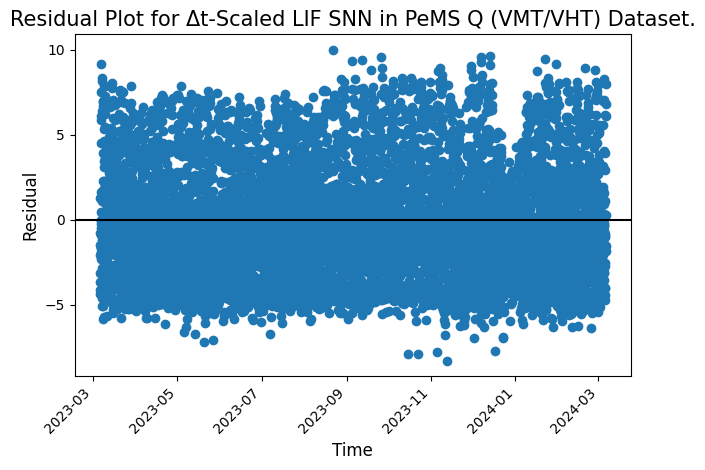

In [ ]:
actual_arr_LIFSNNV3 = np.array(results_SNN_LIFv3['Actual'])
predicted_arr_LIFSNNV3 = np.array(results_SNN_LIFv3['Predicted'])
residuals_LIFSNNV3 = predicted_arr_LIFSNNV3 - actual_arr_LIFSNNV3
plt.scatter(results_SNN_LIFv3['Date'], residuals_LIFSNNV3)
plt.axhline(y=0, color = 'black')
plt.title("Residual Plot for Δt-Scaled LIF SNN in PeMS {} Dataset.".format(feature_field),
          fontsize = 15)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=5)
plt.locator_params(axis='y', nbins=5)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# CNN-LSTM model

## Create CNN-LSTM Model.


In [ ]:
cnn_lstm_model = Sequential()

cnn_lstm_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))

cnn_lstm_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))

#cnn_lstm_model.add(Conv1D(filters=60, kernel_size=2, activation='relu',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_lstm_model.add(MaxPooling1D(pool_size=2))

#cnn_lstm_model.add(LSTM(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_lstm_model.add(Dropout(0.5))

#cnn_lstm_model.add(LSTM(64,activation="tanh",return_sequences=True))
#cnn_lstm_model.add(Dropout(0.8))

#cnn_lstm_model.add(LSTM(64, activation="tanh",return_sequences=True))
#cnn_lstm_model.add(Dropout(0.8))

cnn_lstm_model.add(LSTM(unit, activation=activation,return_sequences=False))
cnn_lstm_model.add(Dropout(0.1))

cnn_lstm_model.add(Dense(1))
cnn_lstm_model.compile(optimizer='adam', loss='mse')
cnn_lstm_model.summary()

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 18, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 7, 32)          │         3,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_18 (LSTM)                  │ (None, 32)             │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,585 (45.25 KB)

 Trainable params: 11,585 (45.25 KB)

 Non-trainable params: 0 (0.00 B)

## Train CNN-LSTM Model.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0612
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0331
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0216
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0164
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0144
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0131
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0121
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0114
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0106
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0103


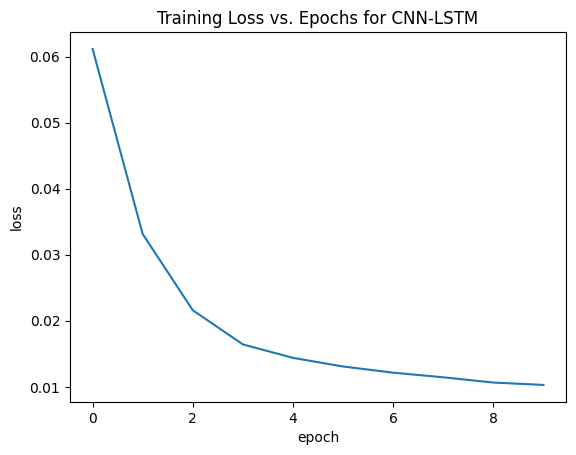

In [ ]:
cnn_lstm_model.compile(optimizer="adam",loss=loss)
cnn_lstm_epochs = cnn_lstm_model.fit(X_train, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(cnn_lstm_epochs, "CNN-LSTM")

## Evaluate CNN-LSTM model using MAE, RMSE, R^2, MAPE, sMAPE.

In [ ]:
print("CNN-LSTM Predictions for Training Set")
cnn_lstm_pred_train = cnn_lstm_model.predict(X_train)
print("CNN-LSTM Predictions for Testing Set")
cnn_lstm_pred_test = cnn_lstm_model.predict(X_test)
cnn_lstm_mae = mean_absolute_error(y_test,cnn_lstm_pred_test)
print("MAE of CNN-LSTM model = ",cnn_lstm_mae)
cnn_lstm_rmse =  mean_squared_error(y_test,cnn_lstm_pred_test) ** 0.5
print("RMSE of CNN-LSTM model = ",cnn_lstm_rmse)
cnn_lstm_r2_score = r2_score(y_test, cnn_lstm_pred_test)
print("R^2 Score of CNN-LSTM model = ",cnn_lstm_r2_score)
cnn_lstm_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_lstm_pred_test)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_lstm_mape_score))
cnn_lstm_smape_score = 100*symmetric_mean_absolute_percentage_error(y_test,
                                                                 cnn_lstm_pred_test)
print("sMAPE Score of CNN-LSTM model = {0} %".format(cnn_lstm_smape_score))

# Add new lines for param and memory
cnn_lstm_params_memory = get_ann_params_and_memory(cnn_lstm_model)
print(f"CNN-LSTM Model Parameter Count: {cnn_lstm_params_memory['param_count']}")
print(f"CNN-LSTM Model Memory Footprint: {cnn_lstm_params_memory['memory_mb']:.4f} MB")

CNN-LSTM Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
CNN-LSTM Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of CNN-LSTM model =  0.07324627384988072
RMSE of CNN-LSTM model =  0.09802921162235795
R^2 Score of CNN-LSTM model =  0.7624833811573252
MAPE Score of CNN-LSTM model = 12.851296035890014 %
sMAPE Score of CNN-LSTM model = 3209.3180113937797 %
CNN-LSTM Model Parameter Count: 11585
CNN-LSTM Model Memory Footprint: 0.0442 MB


## Statistical Tests.

In [ ]:
perform_statistical_tests(y_test, cnn_lstm_pred_test, "CNN-LSTM")


--- Statistical Tests for CNN-LSTM ---
Paired t-test: t-statistic = 5.3386, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             563875.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


## Calculate 95% Confidence Intervals for CNN-LSTM MAE and RMSE

In [ ]:
cnn_lstm_mae_ci_lower, cnn_lstm_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test.flatten(), mean_absolute_error)
print(f"CNN-LSTM MAE 95% CI: [{cnn_lstm_mae_ci_lower:.4f}, {cnn_lstm_mae_ci_upper:.4f}]")

cnn_lstm_rmse_ci_lower, cnn_lstm_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN-LSTM RMSE 95% CI: [{cnn_lstm_rmse_ci_lower:.4f}, {cnn_lstm_rmse_ci_upper:.4f}]")

CNN-LSTM MAE 95% CI: [0.0703, 0.0760]
CNN-LSTM RMSE 95% CI: [0.0937, 0.1023]


## Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_lstm_pred_inv_train = scaler.inverse_transform(cnn_lstm_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_lstm_pred_inv_test = scaler.inverse_transform(cnn_lstm_pred_test)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_lstm_pred_inv_train = cnn_lstm_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_lstm_pred_inv_test = cnn_lstm_pred_inv_test.flatten()

## Showing Actual y and Predicted y values as Dataframes.


In [ ]:
results_CNN_LSTM_train = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_lstm_pred_inv_train})
results_CNN_LSTM_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,63.220901
1,2023-03-06 01:00:00,66.153566,64.428322
2,2023-03-06 02:00:00,66.090926,64.189369
3,2023-03-06 03:00:00,65.942371,64.482483
4,2023-03-06 04:00:00,66.077982,65.120728
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,62.540230
7032,2023-12-24 01:00:00,67.723487,63.326675
7033,2023-12-24 02:00:00,67.931737,64.029510
7034,2023-12-24 03:00:00,68.041604,64.569550


In [ ]:
# Now let's see our actual y and predicted y values as dataframes
results_CNN_LSTM_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_lstm_pred_inv_test})
results_CNN_LSTM_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,66.105972
1,2023-12-25 02:00:00,67.699903,66.000526
2,2023-12-25 03:00:00,66.963961,65.824196
3,2023-12-25 04:00:00,67.132987,65.655907
4,2023-12-25 05:00:00,67.516792,65.498703
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,59.434864
1735,2024-03-06 08:00:00,53.606866,59.447342
1736,2024-03-06 09:00:00,56.729354,60.635113
1737,2024-03-06 10:00:00,60.111626,60.271160


## Plotting Predictions for VHT/VMT/Q made by CNN-LSTM Model.

### Only Testing Data.

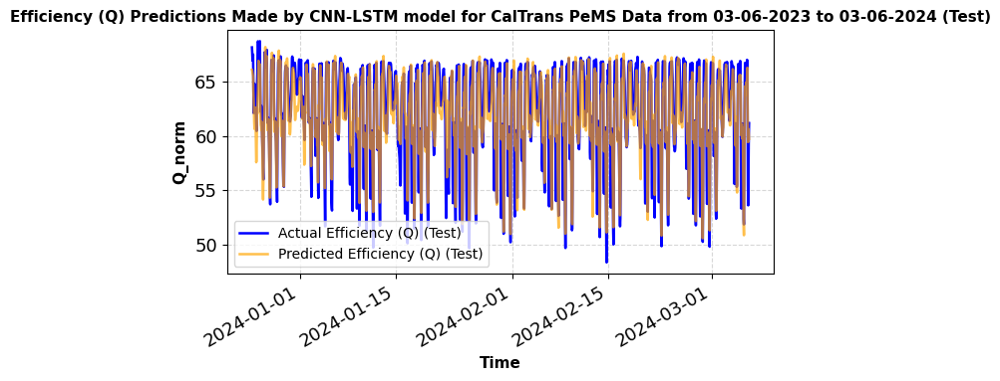

In [ ]:
# Create figure sized for IEEE 2-column layout
fig_CNN_LSTM_test = plt.figure(figsize=(6.5, 3.5))  # 6.5in width fits one column in IEEE

# Plot test data
plt.plot(results_CNN_LSTM_test['Date'], results_CNN_LSTM_test['Actual'],
         color='blue', label=f'Actual {feature} (Test)', linewidth=1.8)
plt.plot(results_CNN_LSTM_test['Date'], results_CNN_LSTM_test['Predicted'],
         color='orange', label=f'Predicted {feature} (Test)', alpha=0.7,
         linewidth=1.8)

# Formatting
plt.title("{0} Predictions Made by CNN-LSTM model for {1} (Test)".
          format(feature, title_name), fontsize = 11, fontweight='bold')
plt.xlabel('Time', fontsize=11,fontweight='bold')
plt.ylabel(feature_norm, fontsize=11,fontweight='bold')
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(fontsize=10, loc='best')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
fig_CNN_LSTM_test.autofmt_xdate()    # Auto-fix overlapping date labels
# Export for Appendix
plt.show()


### Training and Testing Data Comsbined.

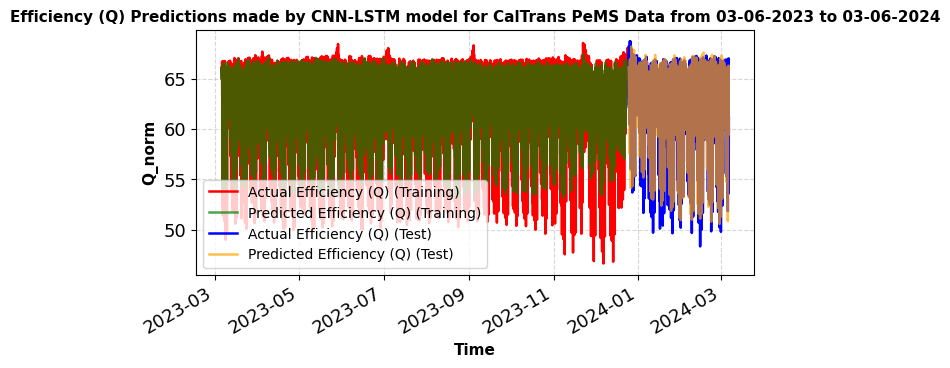

In [ ]:
# Create figure sized for IEEE 2-column layout
fig_CNN_LSTM = plt.figure(figsize=(6.5, 3.5))  # 6.5in width fits one column in IEEE

# Plot training data
plt.plot(results_CNN_LSTM_train['Date'], results_CNN_LSTM_train['Actual'],
         color='red', label=f'Actual {feature} (Training)', linewidth=1.8)
plt.plot(results_LSTM_train['Date'], results_LSTM_train['Predicted'],
         color='green', label=f'Predicted {feature} (Training)', alpha=0.7,
         linewidth=1.8)

# Plot test data
plt.plot(results_CNN_LSTM_test['Date'], results_CNN_LSTM_test['Actual'],
         color='blue', label=f'Actual {feature} (Test)', linewidth=1.8)
plt.plot(results_CNN_LSTM_test['Date'], results_CNN_LSTM_test['Predicted'],
         color='orange', label=f'Predicted {feature} (Test)', alpha=0.7,
         linewidth=1.8)

# Formatting
plt.title("{0} Predictions made by CNN-LSTM model for {1}".
          format(feature, title_name), fontsize = 11, fontweight='bold')
plt.xlabel('Time', fontsize=11,fontweight='bold')
plt.ylabel(feature_norm, fontsize=11,fontweight='bold')
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(fontsize=10, loc='best')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
fig_CNN_LSTM.autofmt_xdate()    # Auto-fix overlapping date labels
plt.show()  # Export for Appendix


## Combine Actual and Predicted Results for Train and Test Cases for CNN-LSTM.



In [ ]:
results_CNN_LSTM = [results_CNN_LSTM_train, results_CNN_LSTM_test]
results_CNN_LSTM = pd.concat(results_CNN_LSTM)
display(results_CNN_LSTM)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,63.220901
1,2023-03-06 01:00:00,66.153566,64.428322
2,2023-03-06 02:00:00,66.090926,64.189369
3,2023-03-06 03:00:00,65.942371,64.482483
4,2023-03-06 04:00:00,66.077982,65.120728
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,59.434864
1735,2024-03-06 08:00:00,53.606866,59.447342
1736,2024-03-06 09:00:00,56.729354,60.635113
1737,2024-03-06 10:00:00,60.111626,60.271160


## Plotting Residuals for Actual and Predicted Results for CNN-LSTM.

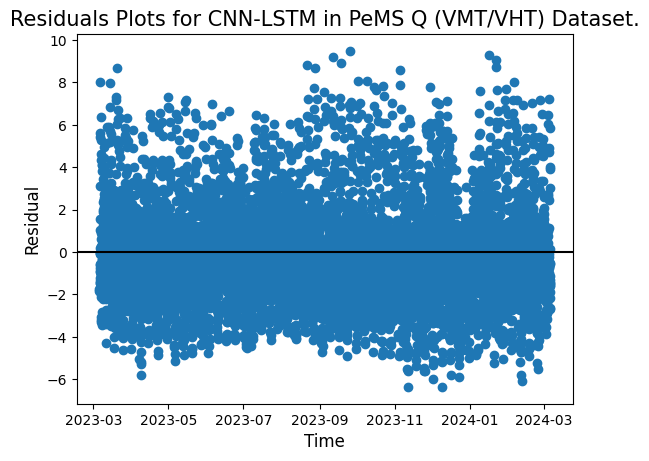

In [ ]:
actual_arr_CNN_LSTM = np.array(results_CNN_LSTM['Actual'])
predicted_arr_CNN_LSTM = np.array(results_CNN_LSTM['Predicted'])
residuals_CNN_LSTM = predicted_arr_CNN_LSTM - actual_arr_CNN_LSTM
plt.scatter(results_CNN_LSTM['Date'], residuals_CNN_LSTM)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for CNN-LSTM in PeMS {} Dataset.".
          format(feature_field), fontsize=15)
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

From the residual plots for the CNN-LSTM model, it can be concluded that the CNN-LSTM model is a good fit.

## Energy Consumption

In [ ]:
cnn_lstm_energy_results = measure_ann_energy(cnn_lstm_model, X_test, "CNN-LSTM Model")

Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2507 seconds
  Estimated CPU Energy: 20.0556 Joules (20055618.2861 µJ)

No GPU available. GPU measurements skipped.


## CNN-LSTM Ablation Study

In [ ]:
def build_cnn_lstm_model_for_ablation(activation='tanh', units=32, filters=32, kernel_size=3):
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=kernel_size, activation=activation,
                     input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Conv1D(filters=filters, kernel_size=kernel_size, activation=activation))
    model.add(MaxPooling1D(pool_size=2))
    model.add(LSTM(units, activation=activation, return_sequences=False))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    return model

print("Starting CNN-LSTM Ablation Studies...")

# Ablation 1: Activation
results_cnn_lstm_activation = {}
for act_name in ['tanh', 'relu']:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_cnn_lstm_model_for_ablation,
        {'activation': act_name, 'units': unit, 'filters': filter, 'kernel_size': kernel},
        f'CNN-LSTM (Activation: {act_name})'
    )
    results_cnn_lstm_activation[act_name] = {'MAE': mae, 'RMSE': rmse, 'Params': param_count,
                                              'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb, 'Memory_MB': memory_mb,
                                              'Inference_Time': inference_time, 'Estimated_FLOPs': estimated_flops,
                                              'Energy_Proxy': energy_proxy}
print("CNN-LSTM Activation Ablation Results:", results_cnn_lstm_activation)

# Ablation 2: Units in LSTM layer
results_cnn_lstm_units = {}
for u in [32, 64]:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_cnn_lstm_model_for_ablation,
        {'units': u, 'activation': activation, 'filters': filter, 'kernel_size': kernel},
        f'CNN-LSTM (Units: {u})'
    )
    results_cnn_lstm_units[f'{u}_units'] = {'MAE': mae, 'RMSE': rmse, 'Params': param_count,
                                              'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb, 'Memory_MB': memory_mb,
                                              'Inference_Time': inference_time, 'Estimated_FLOPs': estimated_flops,
                                              'Energy_Proxy': energy_proxy}
print("CNN-LSTM Units Ablation Results:", results_cnn_lstm_units)

# Ablation 3: Filters in Conv1D layers
results_cnn_lstm_filters = {}
for f in [32, 64]:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_cnn_lstm_model_for_ablation,
        {'filters': f, 'activation': activation, 'units': unit, 'kernel_size': kernel},
        f'CNN-LSTM (Filters: {f})'
    )
    results_cnn_lstm_filters[f'{f}_filters'] = {'MAE': mae, 'RMSE': rmse, 'Params': param_count,
                                                  'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb, 'Memory_MB': memory_mb,
                                                  'Inference_Time': inference_time, 'Estimated_FLOPs': estimated_flops,
                                                  'Energy_Proxy': energy_proxy}
print("CNN-LSTM Filters Ablation Results:", results_cnn_lstm_filters)

# Ablation 4: Kernel Size in Conv1D layers
results_cnn_lstm_kernel = {}
for k_size in [3, 5]:
    mae, rmse, param_count, memory_bytes, memory_kb, memory_mb, inference_time, estimated_flops, energy_proxy, _ = run_ablation_study(
        build_cnn_lstm_model_for_ablation,
        {'kernel_size': k_size, 'activation': activation, 'units': unit, 'filters': filter},
        f'CNN-LSTM (Kernel: {k_size})'
    )
    results_cnn_lstm_kernel[f'{k_size}_kernel'] = {'MAE': mae, 'RMSE': rmse, 'Params': param_count,
                                                    'Memory_Bytes': memory_bytes, 'Memory_KB': memory_kb, 'Memory_MB': memory_mb,
                                                    'Inference_Time': inference_time, 'Estimated_FLOPs': estimated_flops,
                                                    'Energy_Proxy': energy_proxy}
print("CNN-LSTM Kernel Size Ablation Results:", results_cnn_lstm_kernel)

Starting CNN-LSTM Ablation Studies...
Running ablation for CNN-LSTM (Activation: tanh) with params: {'activation': 'tanh', 'units': 32, 'filters': 32, 'kernel_size': 3}
Running ablation for CNN-LSTM (Activation: relu) with params: {'activation': 'relu', 'units': 32, 'filters': 32, 'kernel_size': 3}
CNN-LSTM Activation Ablation Results: {'tanh': {'MAE': 0.07019273930113155, 'RMSE': np.float64(0.09338120159126102), 'Params': 11585, 'Memory_Bytes': 46340, 'Memory_KB': 45.25390625, 'Memory_MB': 0.044193267822265625, 'Inference_Time': 0.3420581817626953, 'Estimated_FLOPs': 23170, 'Energy_Proxy': 7925.48807144165}, 'relu': {'MAE': 0.078037860116642, 'RMSE': np.float64(0.10429902328975739), 'Params': 11585, 'Memory_Bytes': 46340, 'Memory_KB': 45.25390625, 'Memory_MB': 0.044193267822265625, 'Inference_Time': 0.6767699718475342, 'Estimated_FLOPs': 23170, 'Energy_Proxy': 15680.760247707367}}
Running ablation for CNN-LSTM (Units: 32) with params: {'units': 32, 'activation': 'tanh', 'filters': 32,

## Plotting Residuals for Actual and Predicted Results for CNN-LSTM.

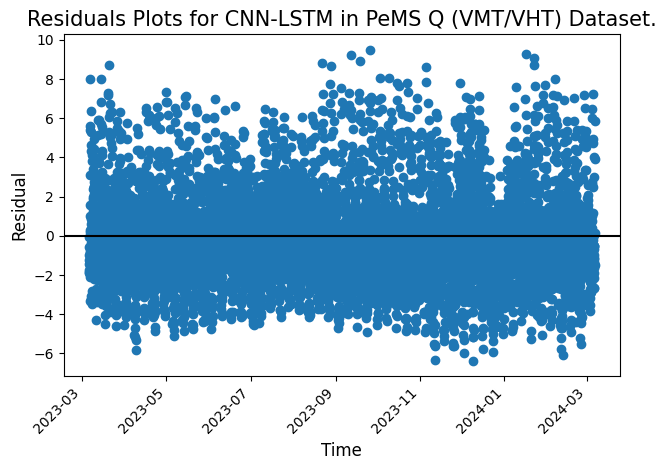

In [ ]:
actual_arr_CNN_LSTM = np.array(results_CNN_LSTM['Actual'])
predicted_arr_CNN_LSTM = np.array(results_CNN_LSTM['Predicted'])
residuals_CNN_LSTM = predicted_arr_CNN_LSTM - actual_arr_CNN_LSTM
plt.scatter(results_CNN_LSTM['Date'], residuals_CNN_LSTM)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for CNN-LSTM in PeMS {} Dataset.".
          format(feature_field), fontsize=15)
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Compare Predictions

## Energy Efficiency Comparison

In [ ]:
def plot_energy_results(all_results):
    print(f"all_results: {all_results}")
    cpu_times = [res['cpu_inference_time_s'] for res in all_results]
    estimated_cpu_energy_uJ = [res['estimated_cpu_energy_uJ']
                               for res in all_results]
    estimated_gpu_energy_uJ = [res['estimated_gpu_energy_uJ']
                               if res['estimated_gpu_energy_uJ'] is not None
                               else 0 for res in all_results]
    snn_spike_energy_uJ = [res['snn_spike_energy_uJ']
                           if res['snn_spike_energy_uJ'] is not None
                           else 0 for res in all_results]
    model_names = [res['model_name'] for res in all_results]

    x = np.arange(len(model_names))
    width = 0.2
    fig, ax1 = plt.subplots(figsize=(13, 6))

    # Plot estimated CPU Energy
    ax1.bar(x - width, estimated_cpu_energy_uJ, width,
            label='Estimated CPU Energy (µJ)', color='skyblue')
    # Plot estimated GPU Energy
    ax1.bar(x, estimated_gpu_energy_uJ, width,
            label='Estimated GPU Energy (µJ) (if available)', color='lightcoral')
    # Plot SNN Spike Energy
    ax1.bar(x + width, snn_spike_energy_uJ, width,
            label='Estimated SNN Spike Energy (µJ)', color='lightgreen')
    ax1.set_yscale('log')  # Set y-axis to logarithmic scale

    ax1.set_ylabel('Estimated Energy (µJ) (Log Scale)', fontsize=14,
                   fontweight='bold')
    ax1.set_xlabel('Model', fontsize=14, fontweight='bold')
    ax1.set_title('Estimated Energy Consumption per Model (Log Scale)' +
                  'for PeMS Dataset', fontsize=20, fontweight = 'bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(model_names, rotation=45, ha="right", fontsize=12)
    ax1.tick_params(axis='y', labelsize=12)
    ax1.legend(loc='upper left', fontsize=10)
    ax1.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

all_results: [{'model_name': 'Δt-Scaled LIF SNN Model', 'cpu_inference_time_s': 0.45428013801574707, 'estimated_cpu_energy_J': 36.342411041259766, 'estimated_cpu_energy_uJ': 36342411.041259766, 'gpu_inference_time_s': None, 'estimated_gpu_energy_J': None, 'estimated_gpu_energy_uJ': None, 'snn_spike_energy_uJ': 20.005, 'snn_spike_sparsity': np.float64(0.9101270485911443), 'snn_spike_density': np.float64(0.08987295140885566)}, {'model_name': 'LSTM Model', 'cpu_inference_time_s': 0.2986178398132324, 'estimated_cpu_energy_J': 23.889427185058594, 'estimated_cpu_energy_uJ': 23889427.185058594, 'gpu_inference_time_s': None, 'estimated_gpu_energy_J': None, 'estimated_gpu_energy_uJ': None, 'snn_spike_energy_uJ': None}, {'model_name': 'CNN-LSTM Model', 'cpu_inference_time_s': 0.25069522857666016, 'estimated_cpu_energy_J': 20.055618286132812, 'estimated_cpu_energy_uJ': 20055618.286132812, 'gpu_inference_time_s': None, 'estimated_gpu_energy_J': None, 'estimated_gpu_energy_uJ': None, 'snn_spike_ene

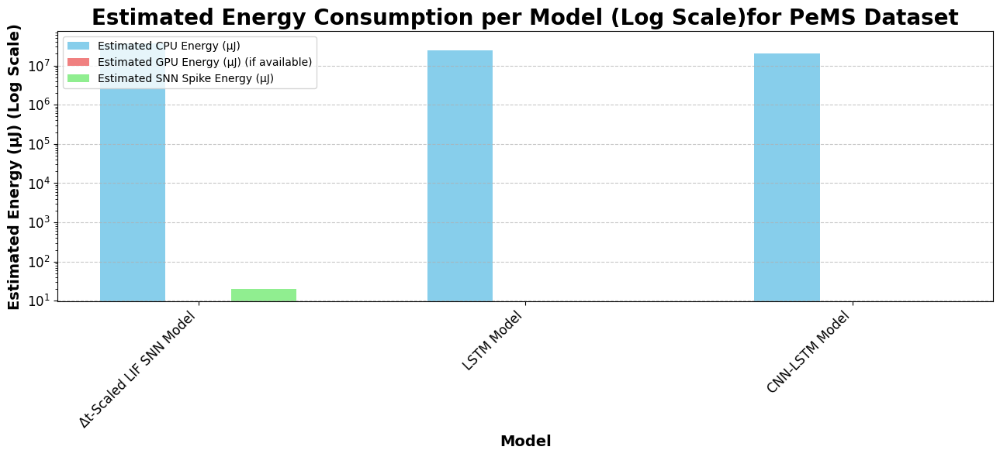

In [ ]:
all_models_energy_results = [spiking_LIFv3_energy_results,
                             lstm_energy_results, cnn_lstm_energy_results]

plot_energy_results(all_models_energy_results)

## Applying Diebold-Mariano Test to Model Predictions

In [ ]:
print("\n--- Diebold-Mariano Test Results ---")

models = {
    "LSTM": lstm_pred_test.flatten(),
    "Δt-Scaled LIF SNN": spiking_LIFv3_model_pred_test.flatten(),
    "CNN-LSTM": cnn_lstm_pred_test.flatten()
}

model_names = list(models.keys())

# Compare each model against every other model
for i in range(len(model_names)):
    for j in range(i + 1, len(model_names)):
        name1 = model_names[i]
        name2 = model_names[j]
        preds1 = models[name1]
        preds2 = models[name2]

        if len(y_test) != len(preds1) or len(y_test) != len(preds2):
            print(f"Skipping DM test for {name1} vs {name2} due to length mismatch.\n")
            continue

        try:
            dm_stat_mae, p_value_mae = diebold_mariano_mae(y_test, preds1, preds2)
            dm_stat_mse, p_value_mse = diebold_mariano_mse(y_test, preds1, preds2)

            print(f"Comparing {name1} vs {name2}:")
            print(f"DM Statistic (MAE loss): {dm_stat_mae:.4f}, p-value: {p_value_mae:.4f}")
            if p_value_mae < 0.05:
                print(f"(Significant difference: {name1} and {name2} have different predictive accuracy based on MAE loss)")
            else:
                print(f"(No significant difference: {name1} and {name2} have similar predictive accuracy based on MAE loss)")

            print(f"DM Statistic (MSE loss): {dm_stat_mse:.4f}, p-value: {p_value_mse:.4f}")
            if p_value_mse < 0.05:
                print(f"(Significant difference: {name1} and {name2} \n"
                "have different predictive accuracy based on MSE loss)")
            else:
                print(f"(No significant difference: {name1} and {name2} have similar predictive accuracy based on MSE loss)\n")

        except Exception as e:
            print(f"Error performing DM test for {name1} vs {name2}: {e}\n")


--- Diebold-Mariano Test Results ---
Comparing LSTM vs Δt-Scaled LIF SNN:
DM Statistic (MAE loss): -21.5452, p-value: 0.0000
(Significant difference: LSTM and Δt-Scaled LIF SNN have different predictive accuracy based on MAE loss)
DM Statistic (MSE loss): -21.1960, p-value: 0.0000
(Significant difference: LSTM and Δt-Scaled LIF SNN 
have different predictive accuracy based on MSE loss)
Comparing LSTM vs CNN-LSTM:
DM Statistic (MAE loss): -2.5195, p-value: 0.0118
(Significant difference: LSTM and CNN-LSTM have different predictive accuracy based on MAE loss)
DM Statistic (MSE loss): -3.6975, p-value: 0.0002
(Significant difference: LSTM and CNN-LSTM 
have different predictive accuracy based on MSE loss)
Comparing Δt-Scaled LIF SNN vs CNN-LSTM:
DM Statistic (MAE loss): 17.5429, p-value: 0.0000
(Significant difference: Δt-Scaled LIF SNN and CNN-LSTM have different predictive accuracy based on MAE loss)
DM Statistic (MSE loss): 16.8482, p-value: 0.0000
(Significant difference: Δt-Scaled L

# Forecasting Future Data for all models

## Essential Functions.

In [ ]:
# this section for unknown future.
future=20
#future=seq_len
forecast_LSTM = []
forecast_CNN_LSTM = []
Xin = X_test[:,:,:]
Xin

array([[[0.91890749],
        [0.9199068 ],
        [0.92844702],
        ...,
        [0.96329094],
        [0.96826151],
        [0.96781635]],

       [[0.9199068 ],
        [0.92844702],
        [0.9259517 ],
        ...,
        [0.96826151],
        [0.96781635],
        [0.9741406 ]],

       [[0.92844702],
        [0.9259517 ],
        [0.89934155],
        ...,
        [0.96781635],
        [0.9741406 ],
        [0.95280242]],

       ...,

       [[0.64968194],
        [0.55970156],
        [0.37723423],
        ...,
        [0.61105245],
        [0.39747358],
        [0.31521033]],

       [[0.55970156],
        [0.37723423],
        [0.2574696 ],
        ...,
        [0.39747358],
        [0.31521033],
        [0.4564768 ]],

       [[0.37723423],
        [0.2574696 ],
        [0.23532842],
        ...,
        [0.31521033],
        [0.4564768 ],
        [0.60949634]]])

In [ ]:
def insert_end(Xin, new_input, timestep):
    for i in range(timestep-1):
        Xin[:,i,:] = Xin[:,i+1,:]
    Xin[:,timestep-1,:] = new_input
    return Xin

def forecast_data(Xin, model_type, forecast, future_num):
    time=[]
    data_pts = 24*future_num
    for j in range(data_pts):
      out = model_type.predict(Xin, batch_size=1000)
      forecast.append(out[j, 0])
      Xin = insert_end(Xin, out[j, 0], future_num)
      time_current = pd.to_datetime(df_norm.index[-1])+timedelta(hours=j)
      if (j % 100 == 0):
        print("j = {0}".format(j))
        print("forecast: {0}".format(forecast))
        print("time_current: ",  time_current)
      time.append(time_current)


    forcasted_output=np.asanyarray(forecast)
    forcasted_output=forcasted_output.reshape(-1,1)
    forcasted_output = scaler.inverse_transform(forcasted_output)
    forcasted_output = pd.DataFrame(forcasted_output)
    date = pd.DataFrame(time)
    forecast_result = pd.concat([date, forcasted_output],axis=1)
    forecast_result.columns = "Date","Forecasted"

    return forecast_result

In [ ]:
# Plotting Predictions for VMT/VHT/Q for each model.
def plot_forecast(forecast_set, model_name, mode, min=30, max=70):
    plt.figure(figsize=(16,6))
    plt.plot(forecast_set['Date'], forecast_set['Forecasted'], alpha=0.7,
             color='teal', label='Forecasted {0}'.format(feature))
    plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
    plt.title('{0} Forecast for {1} using {2}'.
              format(feature_field, mode, model_name), fontsize = 15)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.ylim([min, max])
    plt.xlabel('Time', fontsize = 15)
    #plt.ylabel(feature_field, fontsize = 15)
    plt.ylabel('Normalized {0} Scale'.format(feature_field), fontsize = 15)
    plt.rc('xtick', labelsize=15)
    plt.rc('ytick', labelsize=15)
    plt.legend()
    plt.show()

In [ ]:
# Plotting Predictions for VMT/VHT/Q for Training, Testing, and Future Data.
def plot_with_forecast(train_set, test_set, forecast_set, model_name, mode,
                       min=30, max=70):
    plt.figure(figsize=(16,6))
    plt.plot(train_set['Date'], train_set['Actual'], color='red',
             label='Actual {0} (Training Case)'.format(feature))
    plt.plot(train_set['Date'], train_set['Predicted'], alpha=0.7,
             color='green',
             label='Predicted {0} (Training Case)'.format(feature))
    plt.plot(test_set['Date'], test_set['Actual'], color='blue',
            label='Actual {0} (Test Case)'.format(feature))
    plt.plot(test_set['Date'], test_set['Predicted'], alpha=0.7, color='yellow',
             label='Predicted {0} (Test Case)'.format(feature))
    plt.plot(forecast_set['Date'], forecast_set['Forecasted'], alpha=0.7,
             color='teal', label='Forecasted {0}'.format(feature))
    plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
    plt.title("{0} Predictions and Forecasts made by {1} model for {2}".
              format(feature_field, model_name, title_name), fontsize=15)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.ylim([min, max])
    plt.xlabel('Time', fontsize = 15)
    plt.ylabel('Normalized {0} Scale'.format(feature_field), fontsize = 15)
    plt.legend()
    plt.show()

## Forecasting Future Data for LSTM.

In [ ]:
forecast_result_lstm = forecast_data(Xin, lstm_model, forecast_LSTM, future)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
j = 0
forecast: [np.float32(0.8834032)]
time_current:  2024-03-06 11:00:00
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
2/2 ━━━━━━━━━

In [ ]:
forecast_result_lstm

,Date,Forecasted
0,2024-03-06 11:00:00,66.165932
1,2024-03-06 12:00:00,65.070076
2,2024-03-06 13:00:00,63.776497
3,2024-03-06 14:00:00,62.468483
4,2024-03-06 15:00:00,61.417599
...,...,...
475,2024-03-26 06:00:00,63.648464
476,2024-03-26 07:00:00,63.648472
477,2024-03-26 08:00:00,63.648472
478,2024-03-26 09:00:00,63.648476


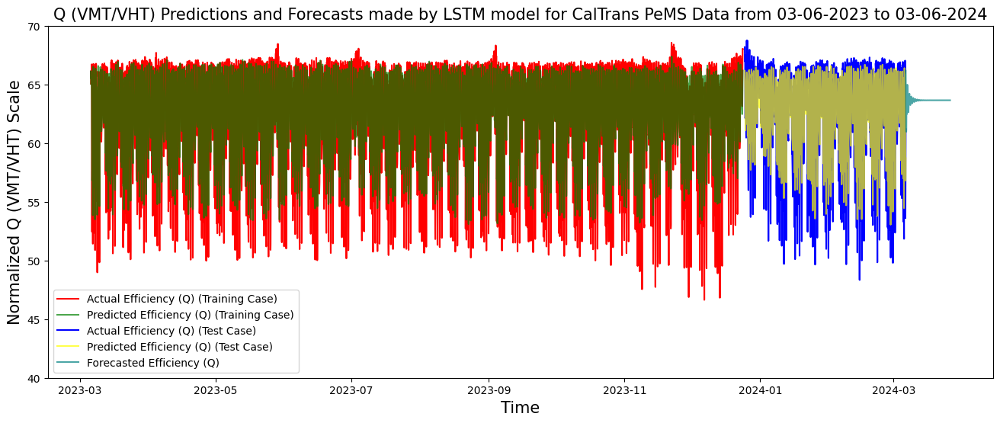

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_LSTM_train, results_LSTM_test, forecast_result_lstm,
                   'LSTM', title_name, min=40, max=70)

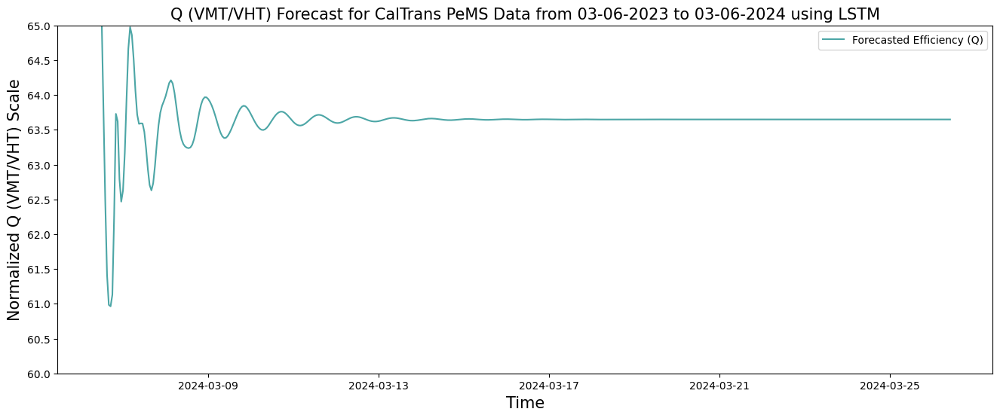

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_lstm, 'LSTM', title_name, min=60, max=65)

## Forecasting Future Data for CNN-LSTM.

In [ ]:
forecast_result_cnn_lstm = forecast_data(Xin, cnn_lstm_model, forecast_CNN_LSTM, future)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
j = 0
forecast: [np.float32(0.7596135)]
time_current:  2024-03-06 11:00:00
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━

In [ ]:
forecast_result_cnn_lstm

,Date,Forecasted
0,2024-03-06 11:00:00,63.429745
1,2024-03-06 12:00:00,63.429745
2,2024-03-06 13:00:00,63.429745
3,2024-03-06 14:00:00,63.414246
4,2024-03-06 15:00:00,63.402576
...,...,...
475,2024-03-26 06:00:00,63.403236
476,2024-03-26 07:00:00,63.403236
477,2024-03-26 08:00:00,63.403240
478,2024-03-26 09:00:00,63.403240


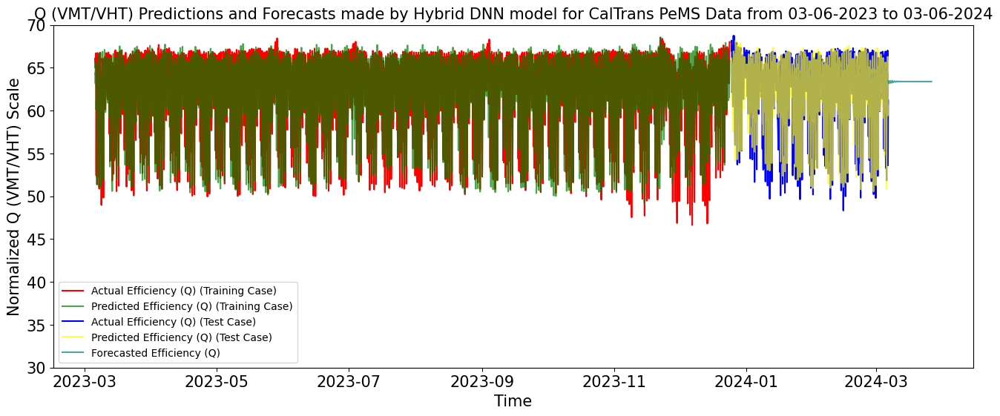

In [ ]:
plot_with_forecast(results_CNN_LSTM_train, results_CNN_LSTM_test,
                   forecast_result_cnn_lstm, 'Hybrid DNN', title_name, min=30,
                   max=70)

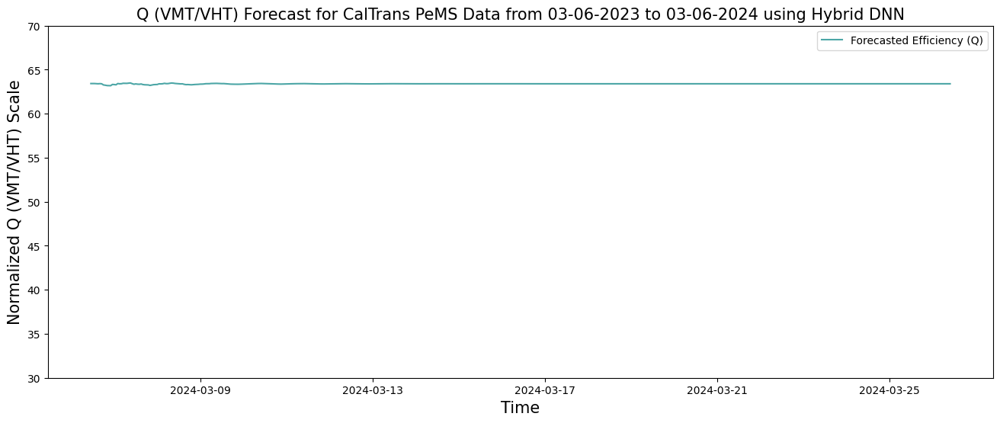

In [ ]:
plot_forecast(forecast_result_cnn_lstm, 'Hybrid DNN', title_name)